In [1]:
#HOURS 
%load_ext autoreload
%load_ext line_profiler
%autoreload 2

import numpy as np
import pandas as pd
from mpl_toolkits import mplot3d
import matplotlib
import matplotlib.pyplot as plt
import scipy.optimize as optimize
import Estimate
import figure 
from EconModel import cpptools
import pickle
import statsmodels.api as sm
import seaborn as sns
#from binsreg import binsreg
from binsreg import *
from plotnine import *
from LimitedCommitmentModel import LimitedCommitmentModelClass

# plot style
linestyles = ['-','--','-.',':',':']
markers = ['o','s','D','*','P']
linewidth = 2
font_size = 17
font = {'size':font_size}
matplotlib.rc('font', **font)


plt.rcParams.update({'figure.max_open_warning': 0,'text.usetex': False})
path = 'output/'

SAVE = False

# c++ settings

do_compile = True
threads = 20
T = 20




In [2]:
name = 'model_FC'
model_name = "model_FC"
do_distr_yerror = "none"
do_yerror = 0
name_error = f'{do_distr_yerror}{do_yerror}std_Yerror'
#N = 16000 #MODEL_LC 
#N = 4000 #model NC
N = 9000
gender = "w"
#name_error = "uni2std_Yerror"

specs = {}
#specs.update({f'test2':{'latexname':'limited', 'par':{ 'T':T, 'num_K': 5, 'num_A': 10 ,  'do_HK': False, 'threads':threads,'bargaining':0}}})


#specs.update({f'model_LC':{'latexname':'limited', 'par':{ 'T':T, 'do_HK': False, 'simN': N,  'threads':threads,'bargaining':1}}})
#specs.update({f'model_NC':{'latexname':'limited', 'par':{ 'T':T, 'do_HK': False, 'simN': N,  'threads':threads,'bargaining':2}}})
specs.update({f'model_FC':{'latexname':'limited', 'par':{ 'T':T,  'do_HK': False, 'simN': N,  'threads':threads,'bargaining':0}}})

# solve different models
models = {}
for m,(name,spec) in enumerate(specs.items()):
    
    # setup model
    model = LimitedCommitmentModelClass(name=name,par=spec['par'])
    model.spec = spec

    compile_now = True if do_compile & (m==0) else False
    model.link_to_cpp(force_compile=compile_now)
    

# setup model
#model = LimitedCommitmentModelClass(name=name)    
#model.link_to_cpp(force_compile=True)


#load par and sol
pickle_file = f'output/{name}_sol.pickle'

with open(pickle_file, 'rb') as f:
    model.sol = pickle.load(f)

pickle_file = f'output/{name}_par.pickle'

with open(pickle_file, 'rb') as f:
    model.par = pickle.load(f)
    model.par.simN = N

In [3]:
data = Estimate.create_data(model,start_p = 2, end_p = model.par.T-2, yerror = do_distr_yerror, scale_st = do_yerror )
data = Estimate.create_variable(data, model.par)
data = Estimate.aux_est(data,model.par)


#data2 = data2[data2['delta_log_barganing']< 0.5]
#data2 = data2[data2['delta_log_barganing']> -0.5]
#data2 = data2[data2['delta_log_barganing']!= 0]


_, wald_FC_w , wald_NC_w,  _,_,_ = Estimate.main_est(data,gender= "w", do_estimate_wage = "est_omega", print_reg = True, shadow_value_simple=2, do_control_love = False)
   

c:\Users\czk481\project\LimitedCommitmentTest-1\Estimate.py:194: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
c:\Users\czk481\project\LimitedCommitmentTest-1\Estimate.py:195: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
c:\Users\czk481\project\LimitedCommitmentTest-1\Estimate.py:196: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use 

                            OLS Regression Results                            
Dep. Variable:                    y_w   R-squared:                       0.942
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     450.1
Date:                Sun, 19 May 2024   Prob (F-statistic):               0.00
Time:                        13:29:17   Log-Likelihood:                 25134.
No. Observations:                9568   AIC:                        -4.983e+04
Df Residuals:                    9347   BIC:                        -4.824e+04
Df Model:                         220                                         
Covariance Type:              cluster                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.3351 

control_part_inc_w


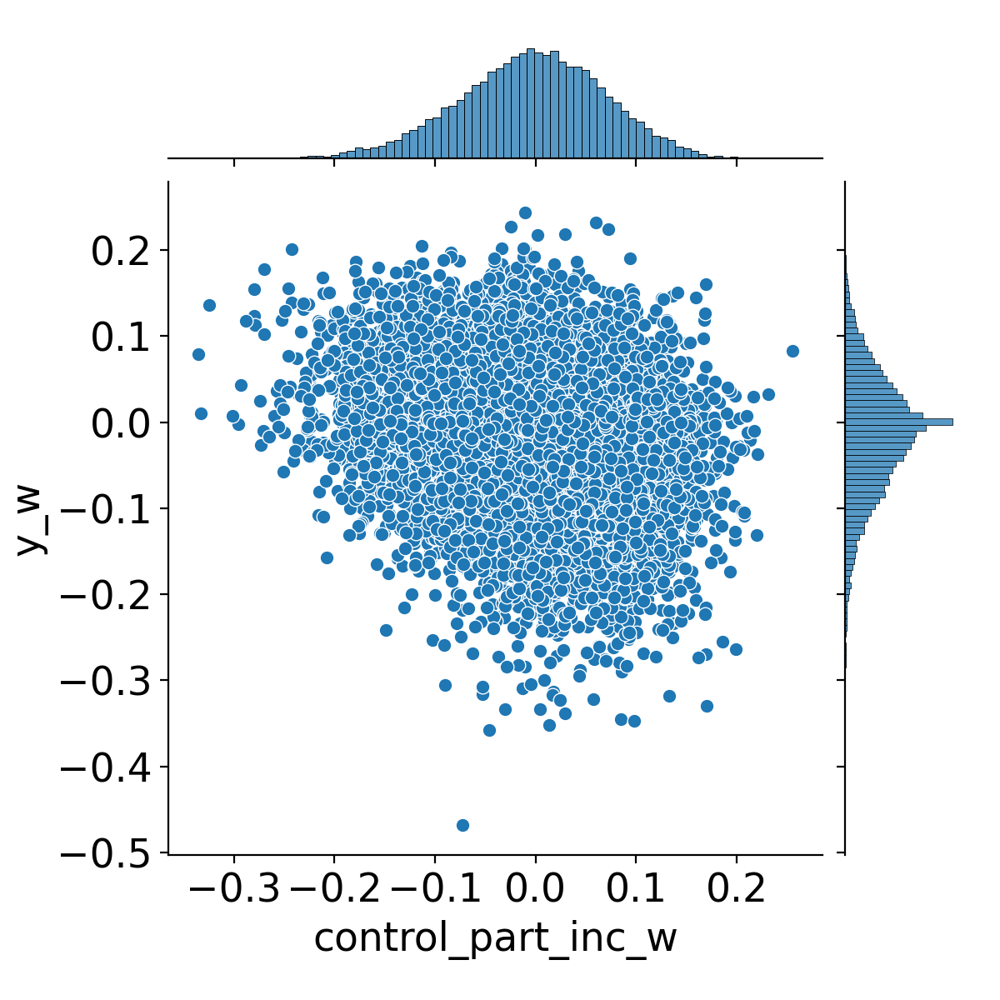

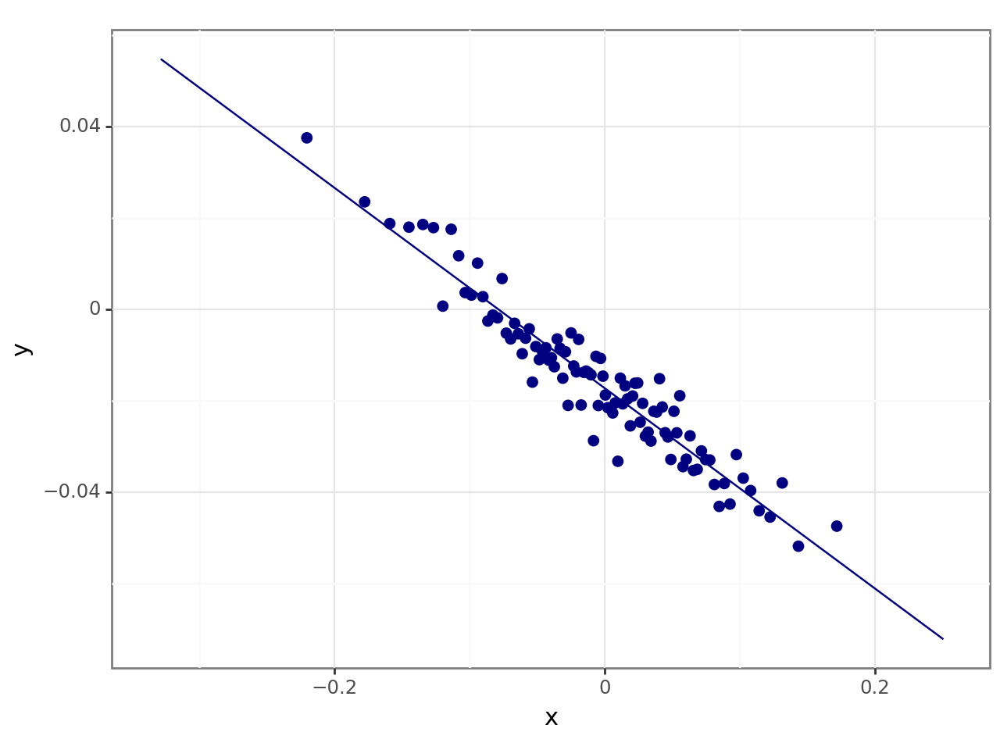


control_cons


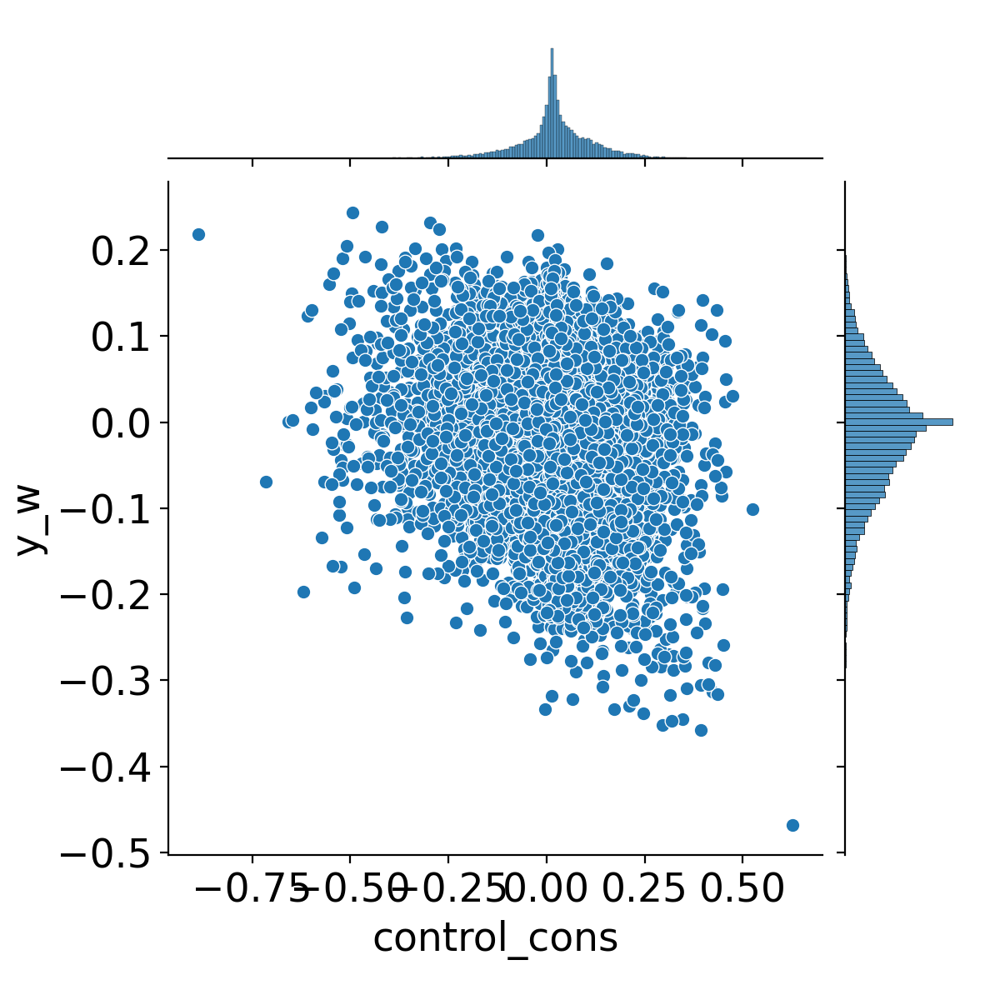

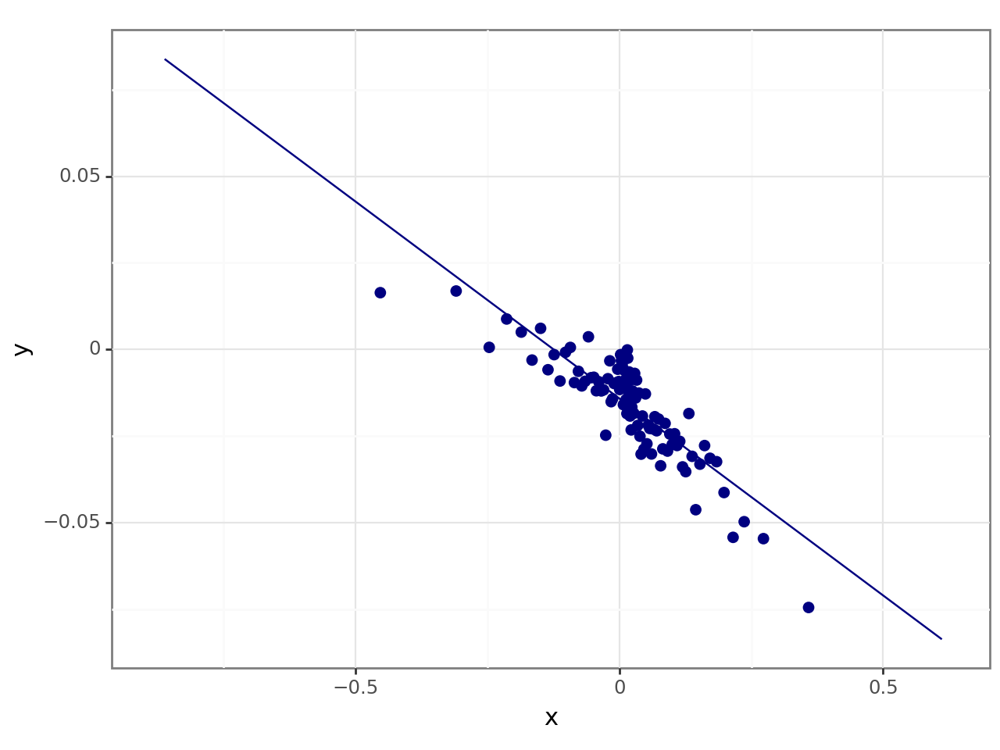


delta_log_fam_inc


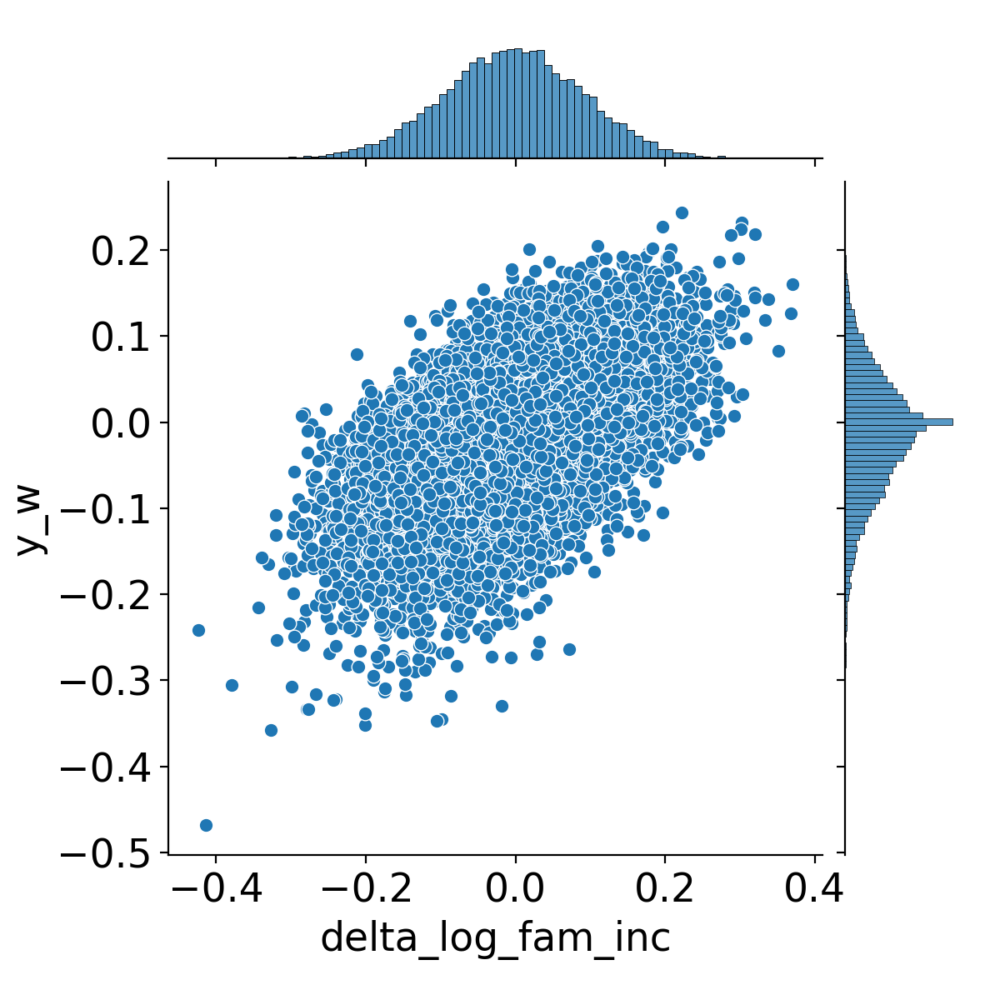

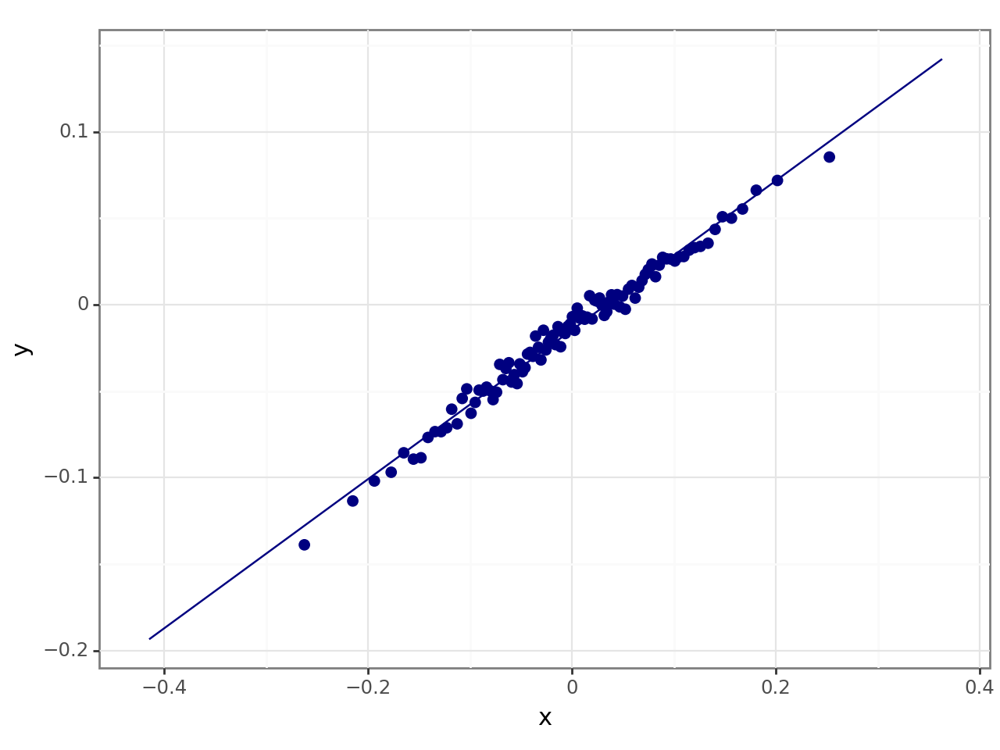


delta_log_wealth


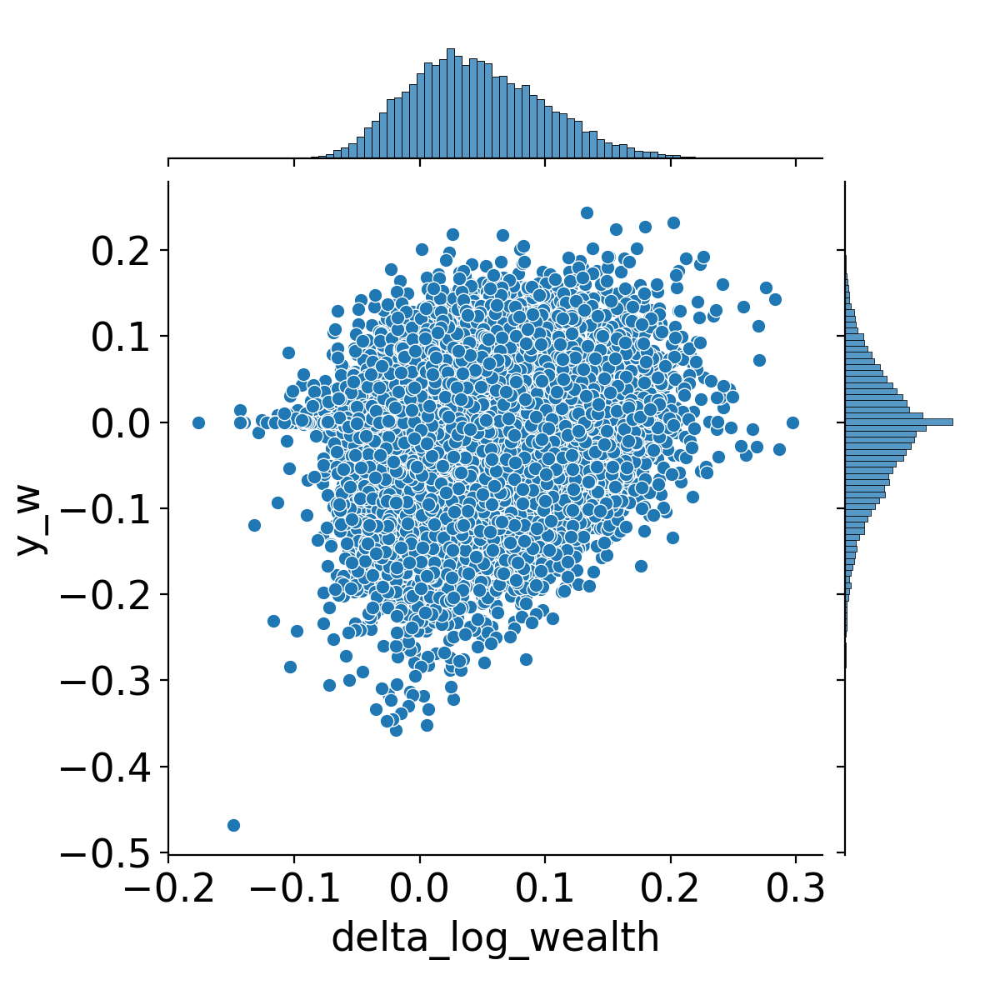

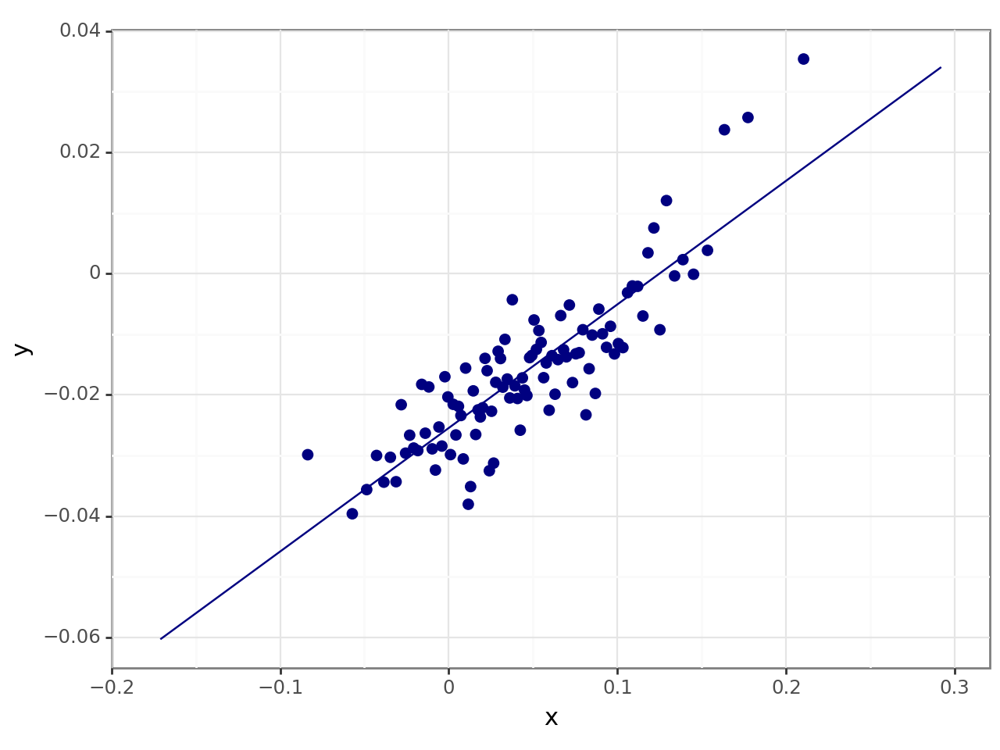


log_fam_inc_l


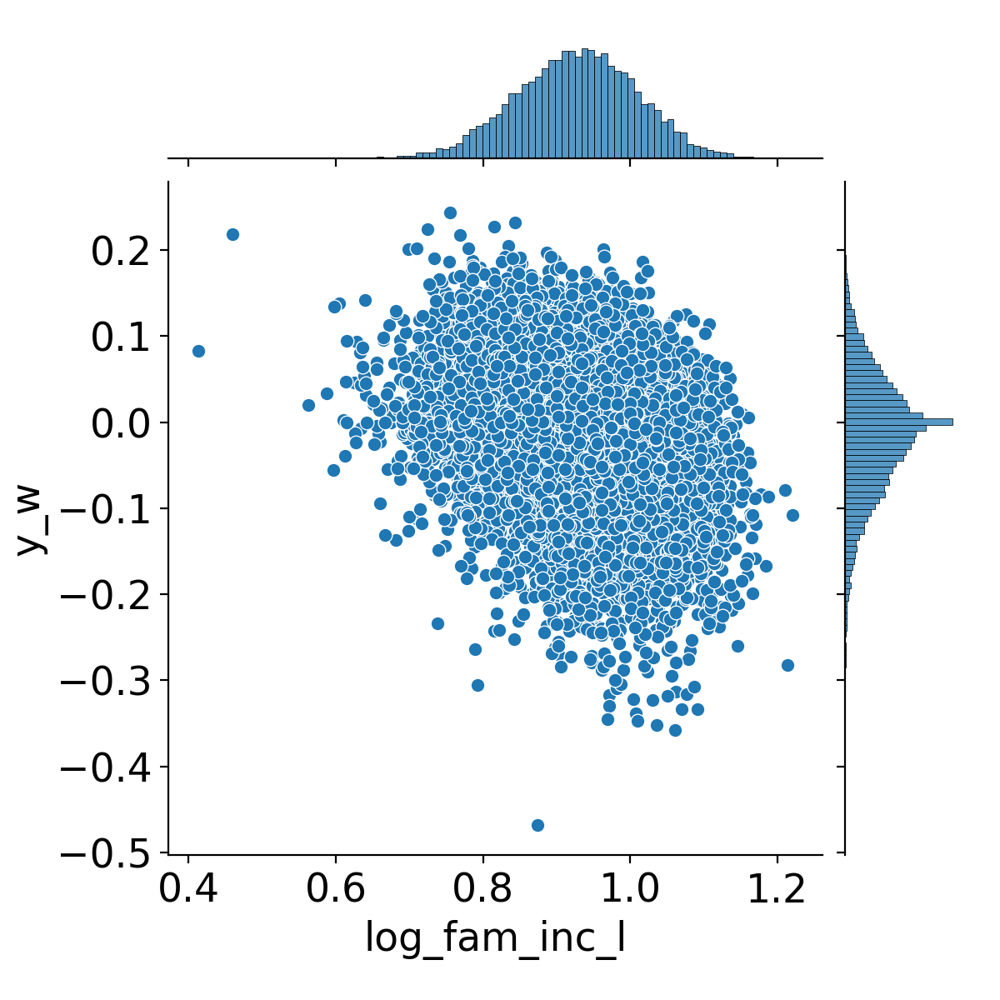

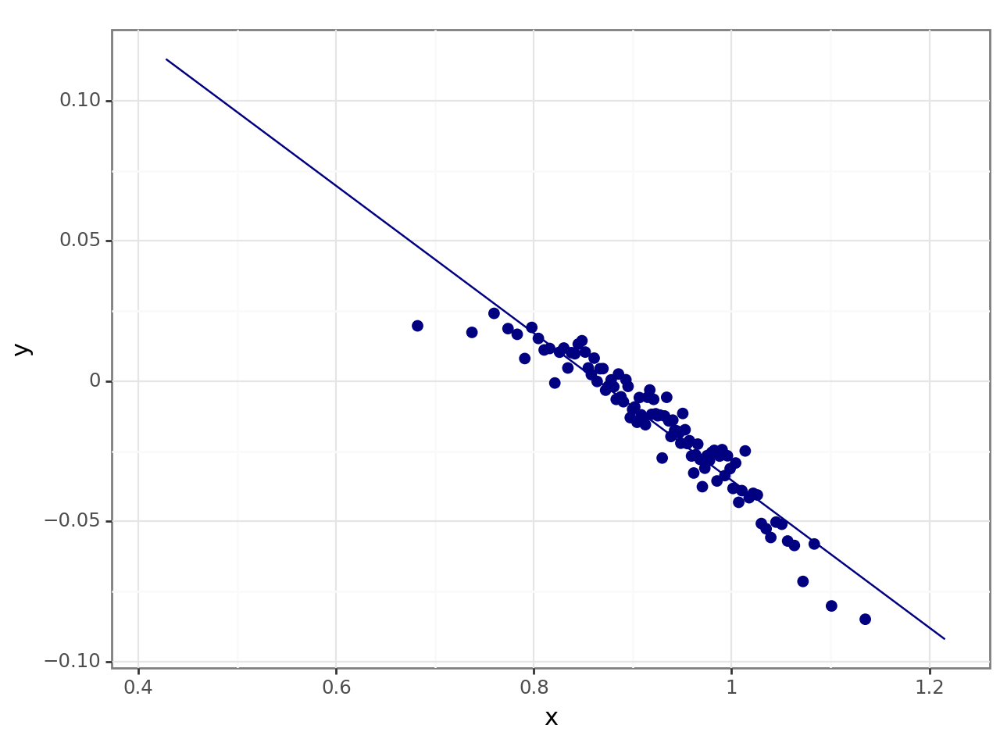


log_wealth_l


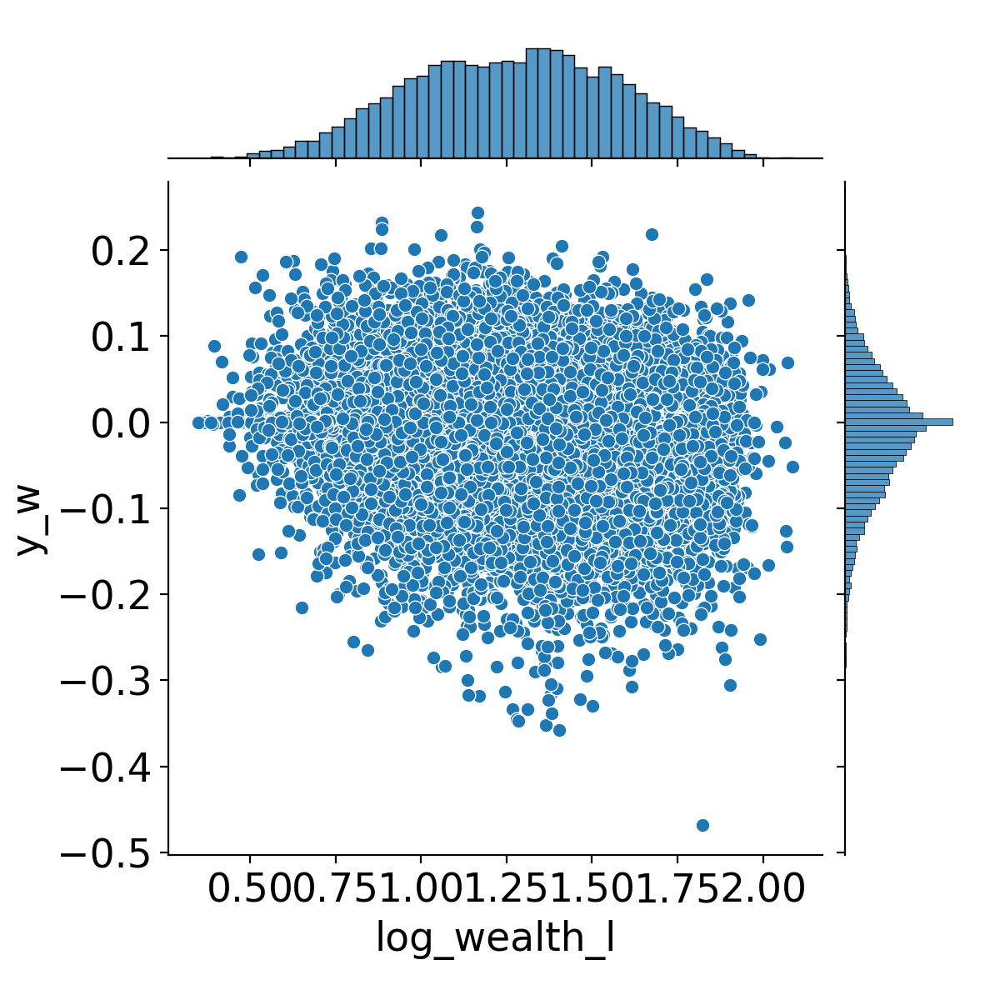

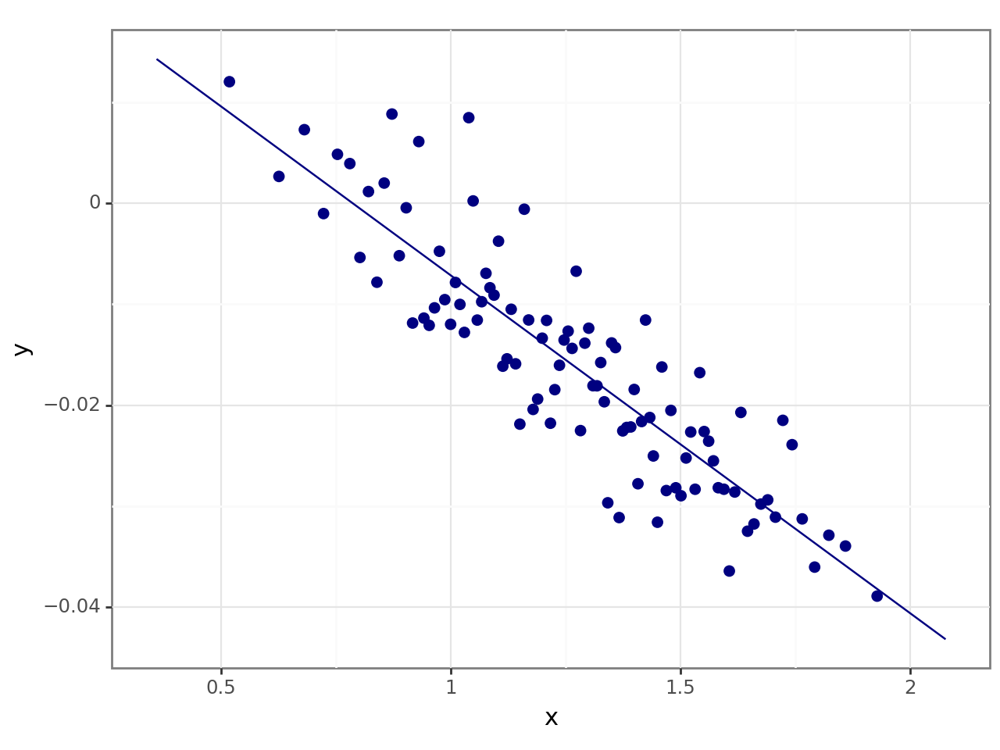


wage_shock


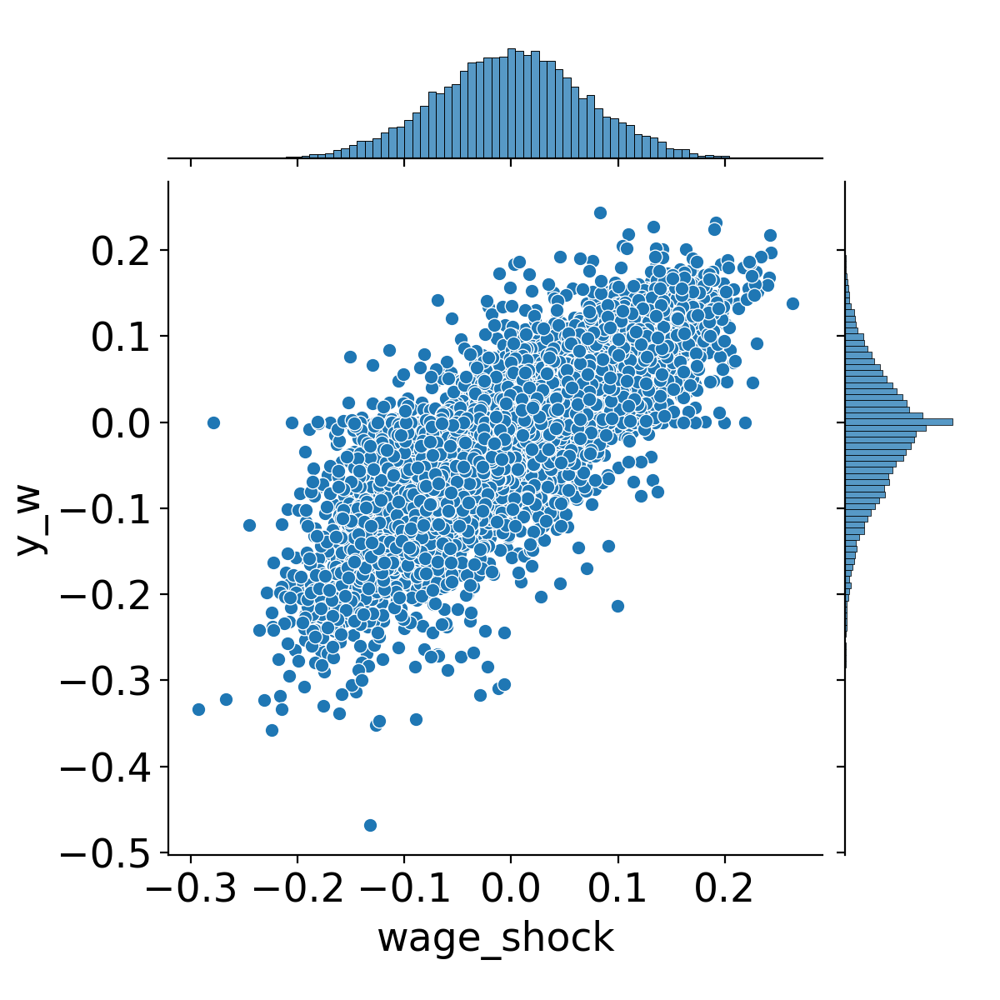

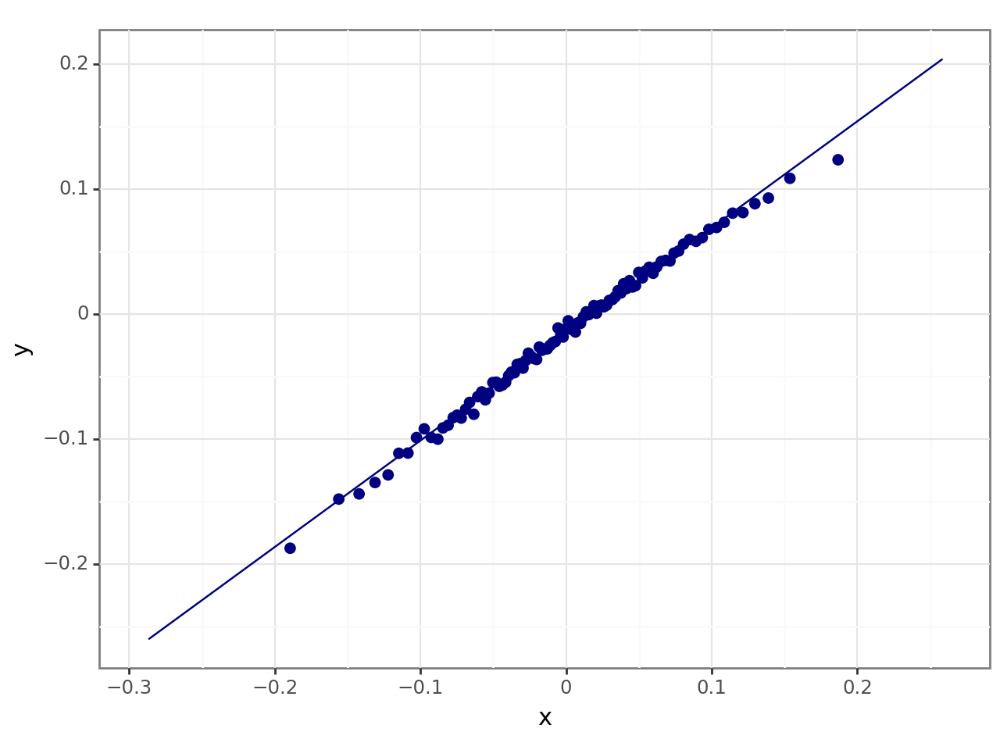


wage_shock_l


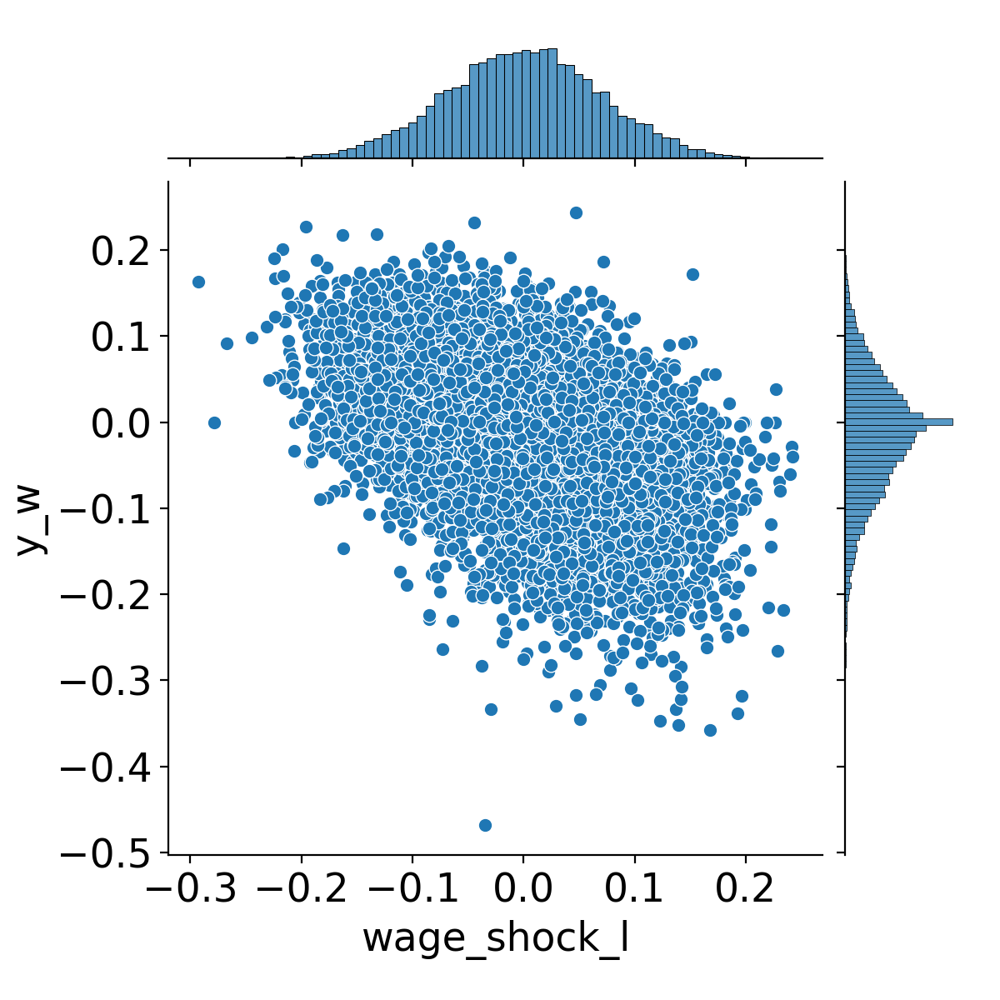

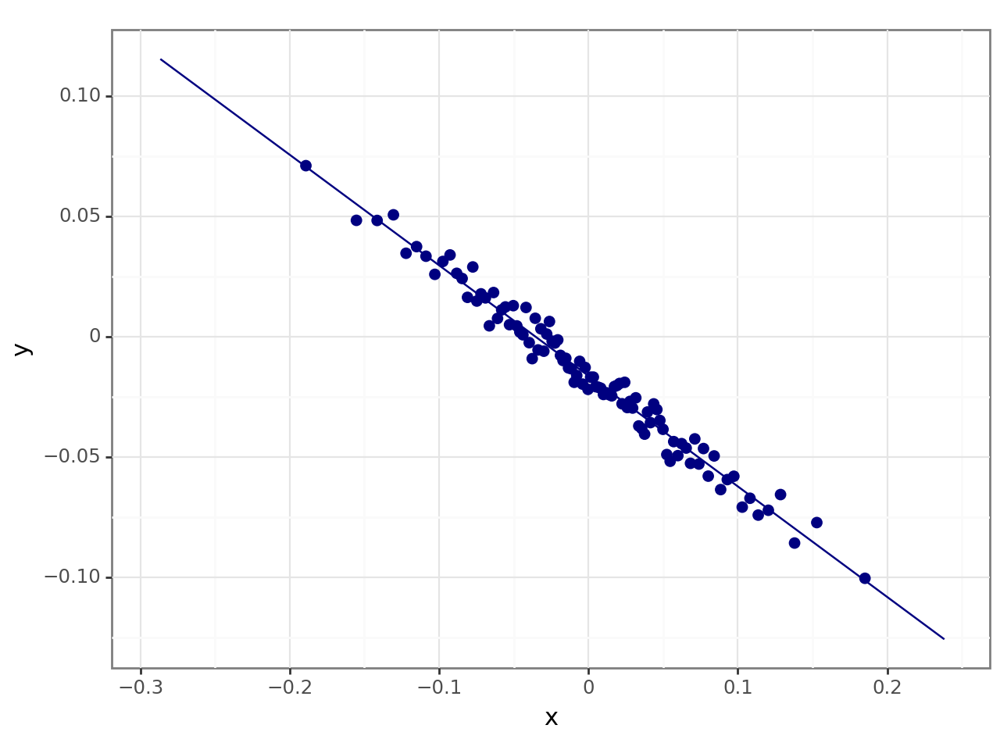


wage_shock_l2


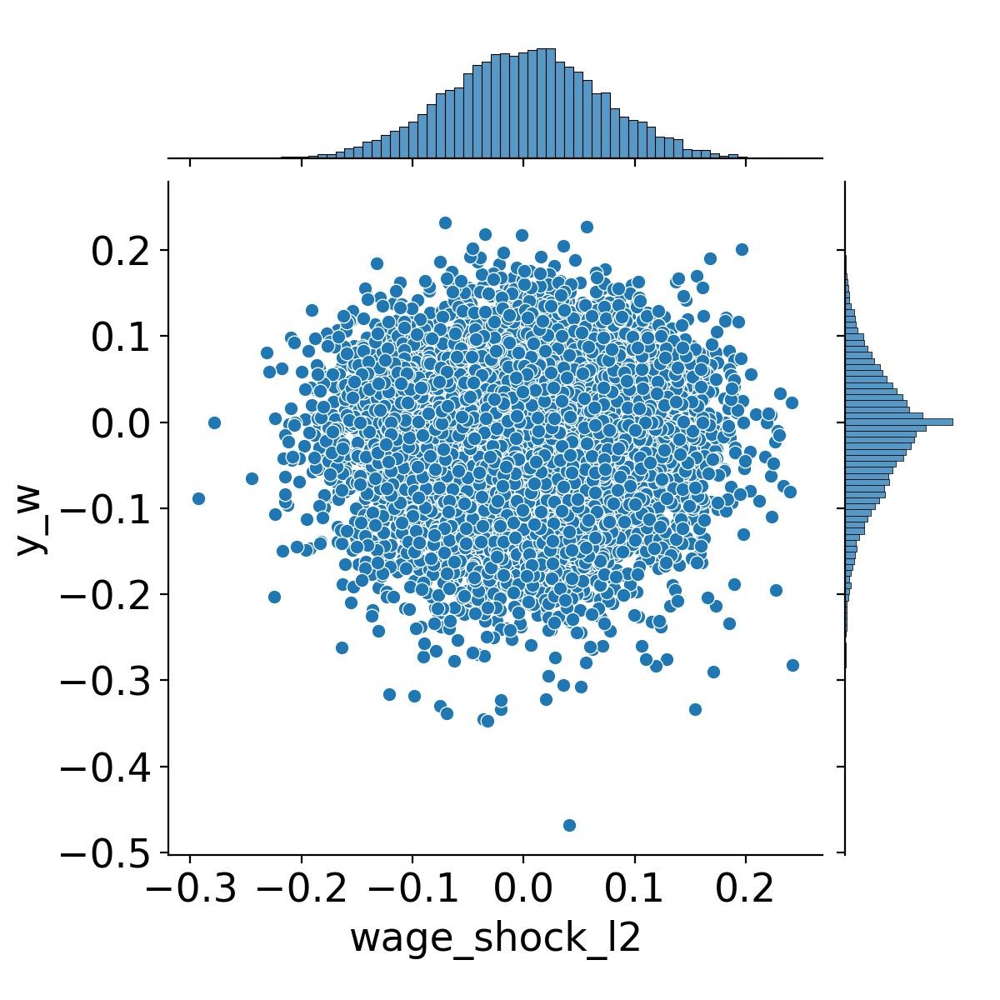

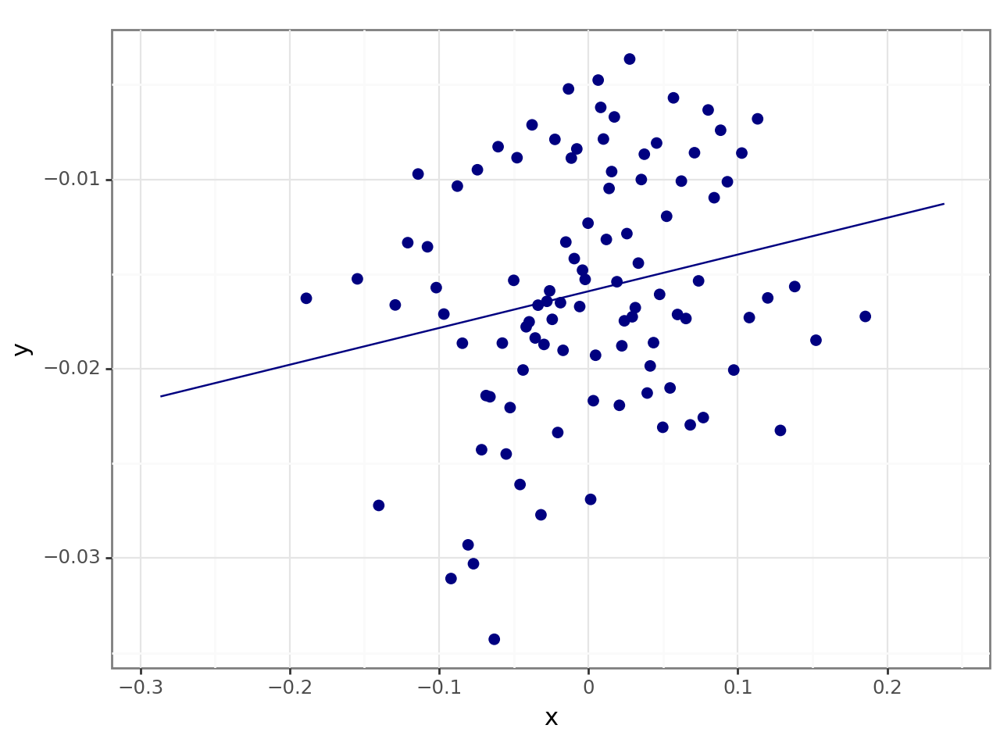


wage_shock_j


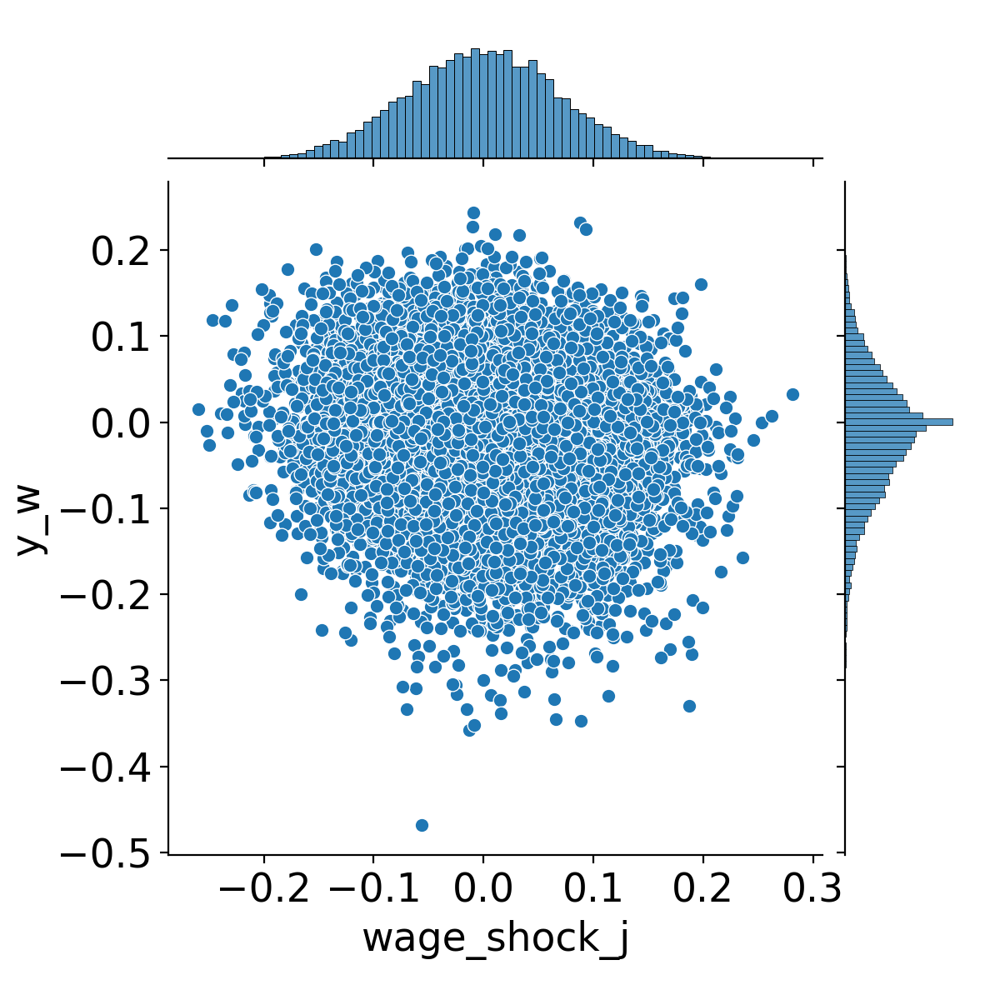

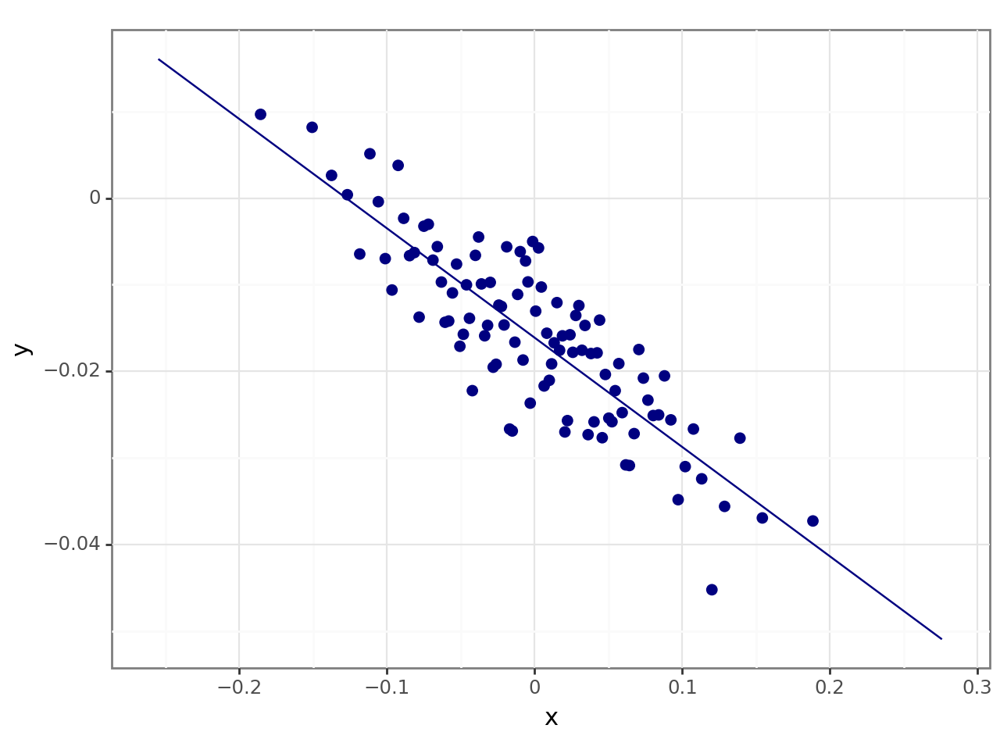


wage_shock_j_l


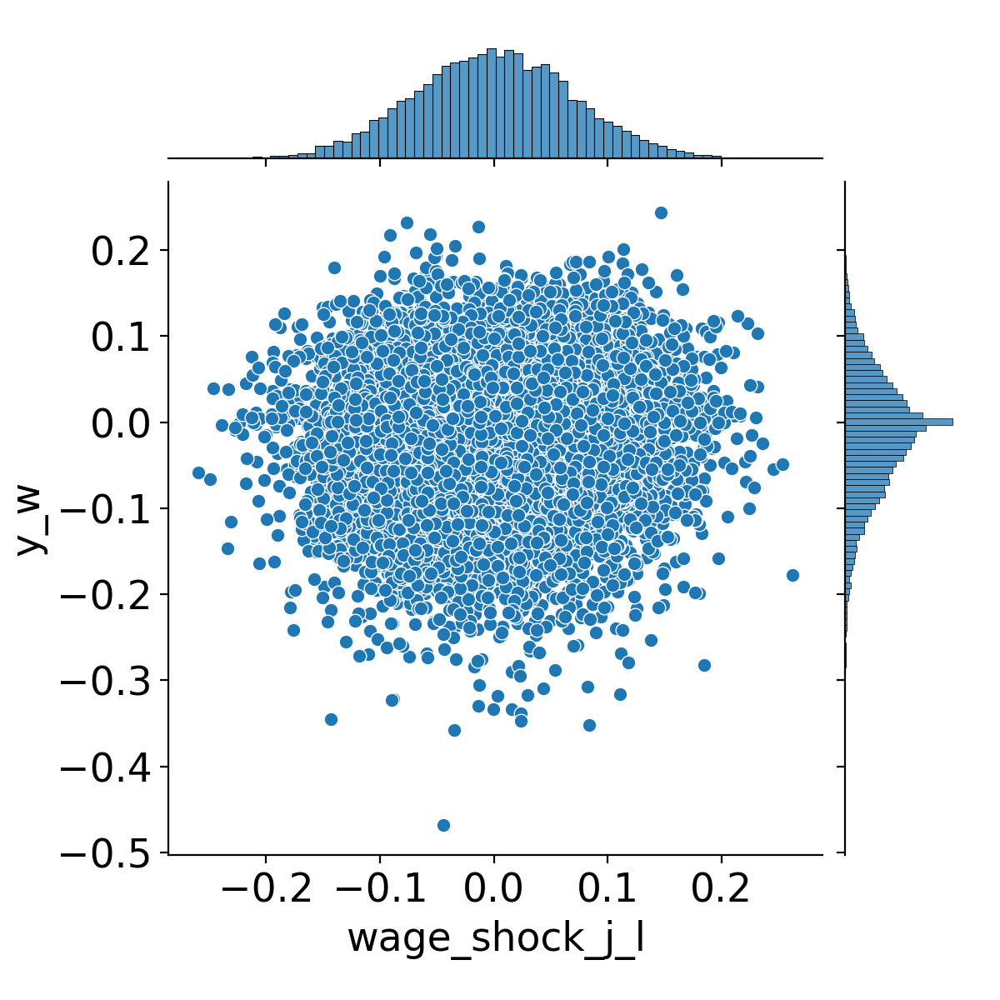

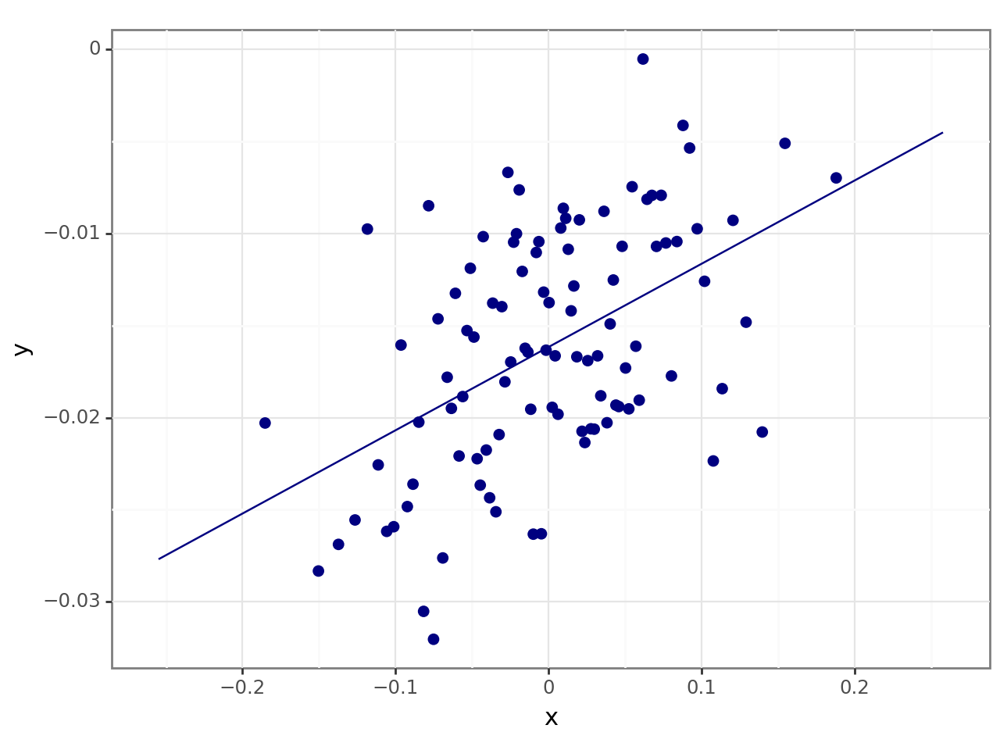


wage_shock_j_l2


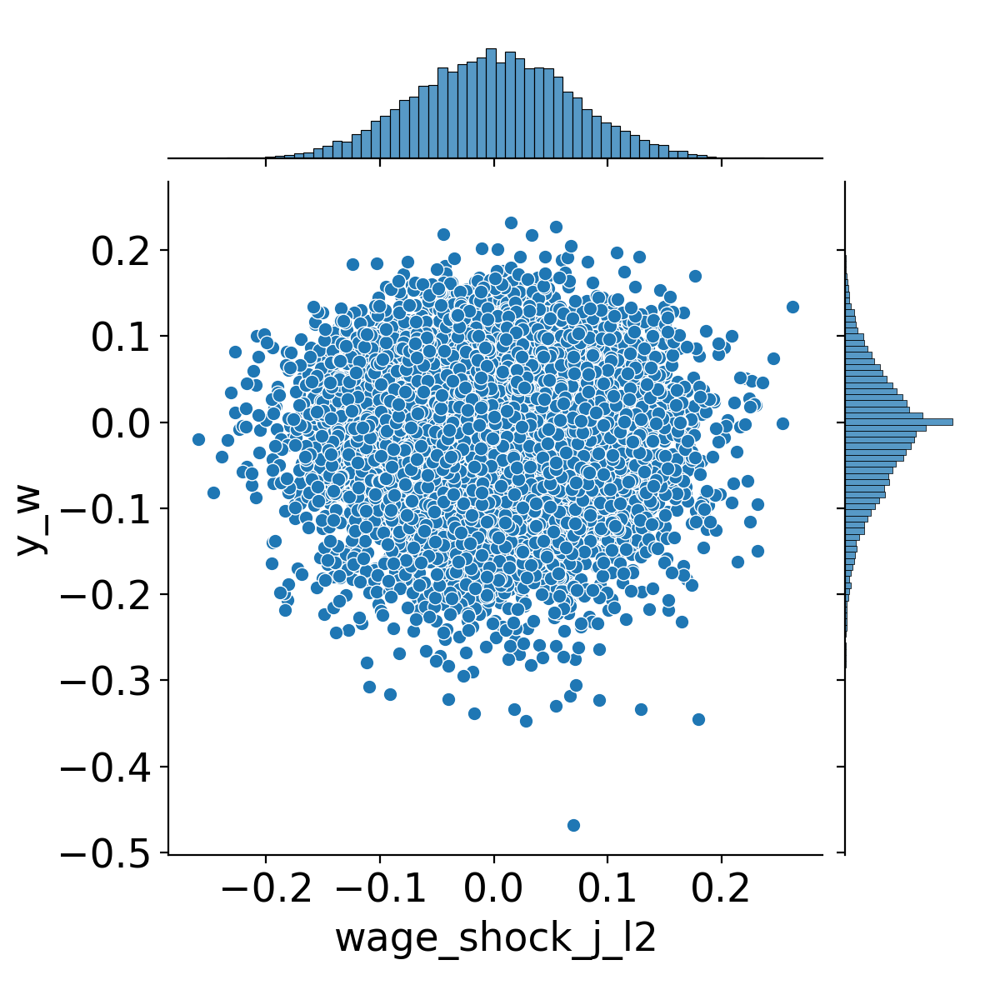

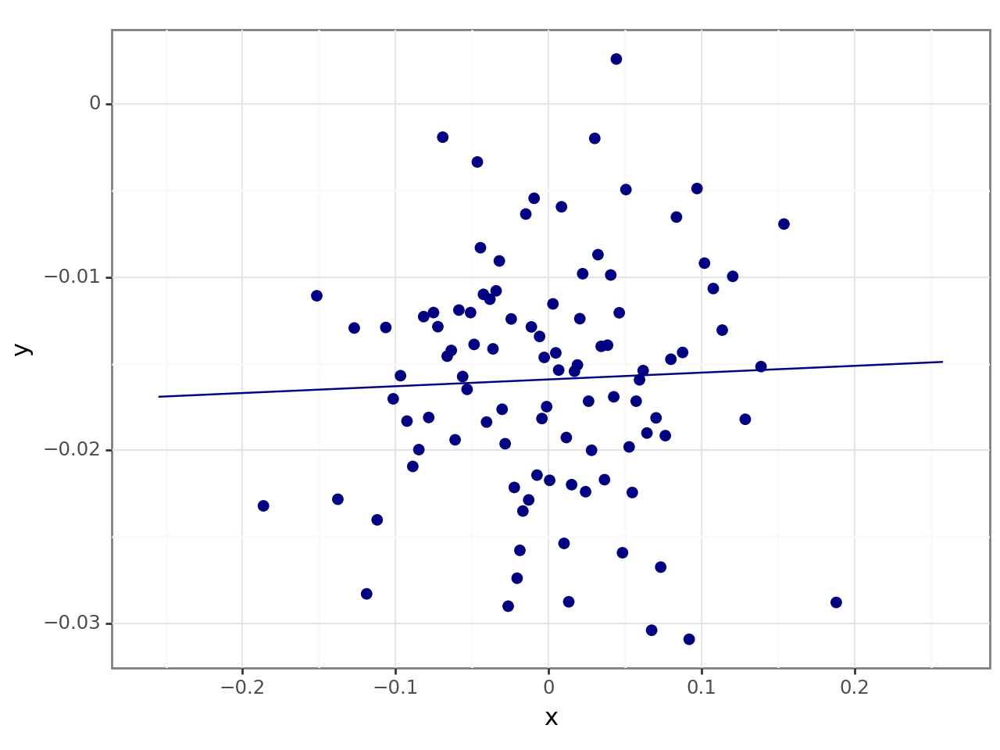


delta_log_wealth_l


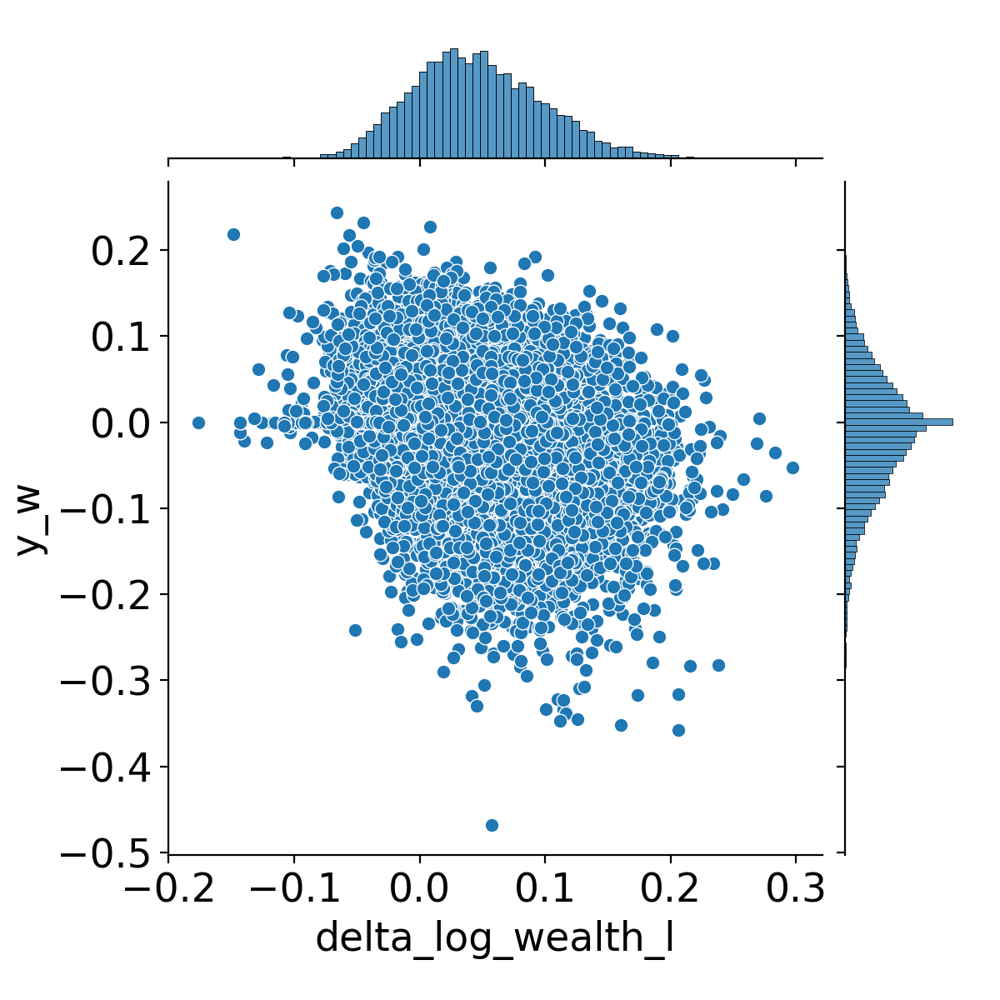

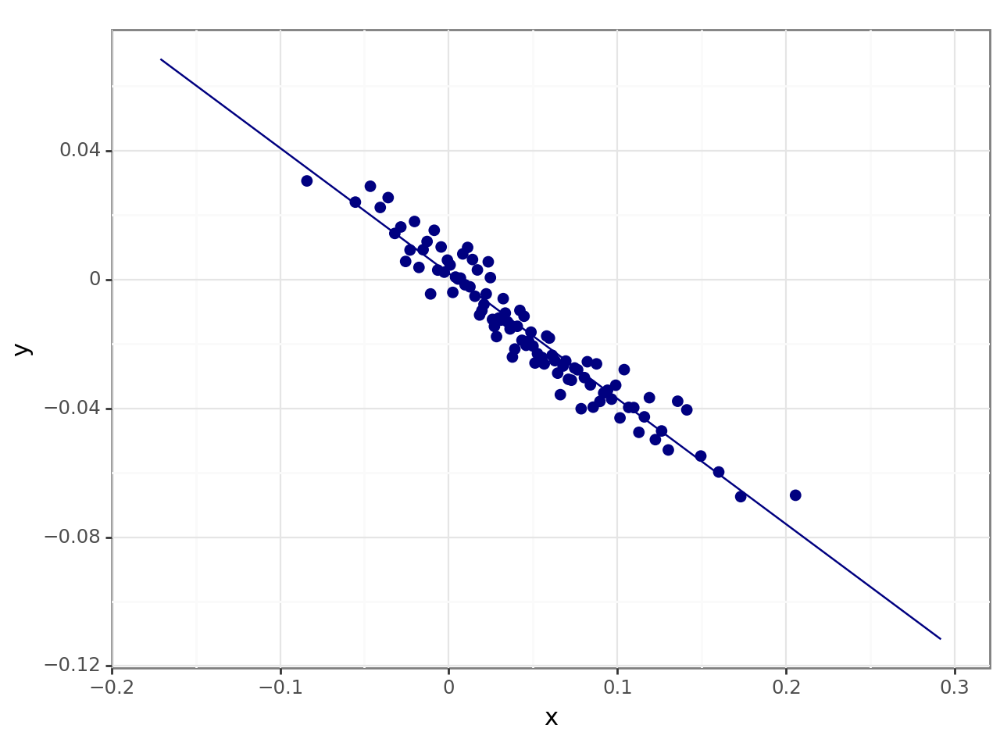


delta_log_wealth_l2


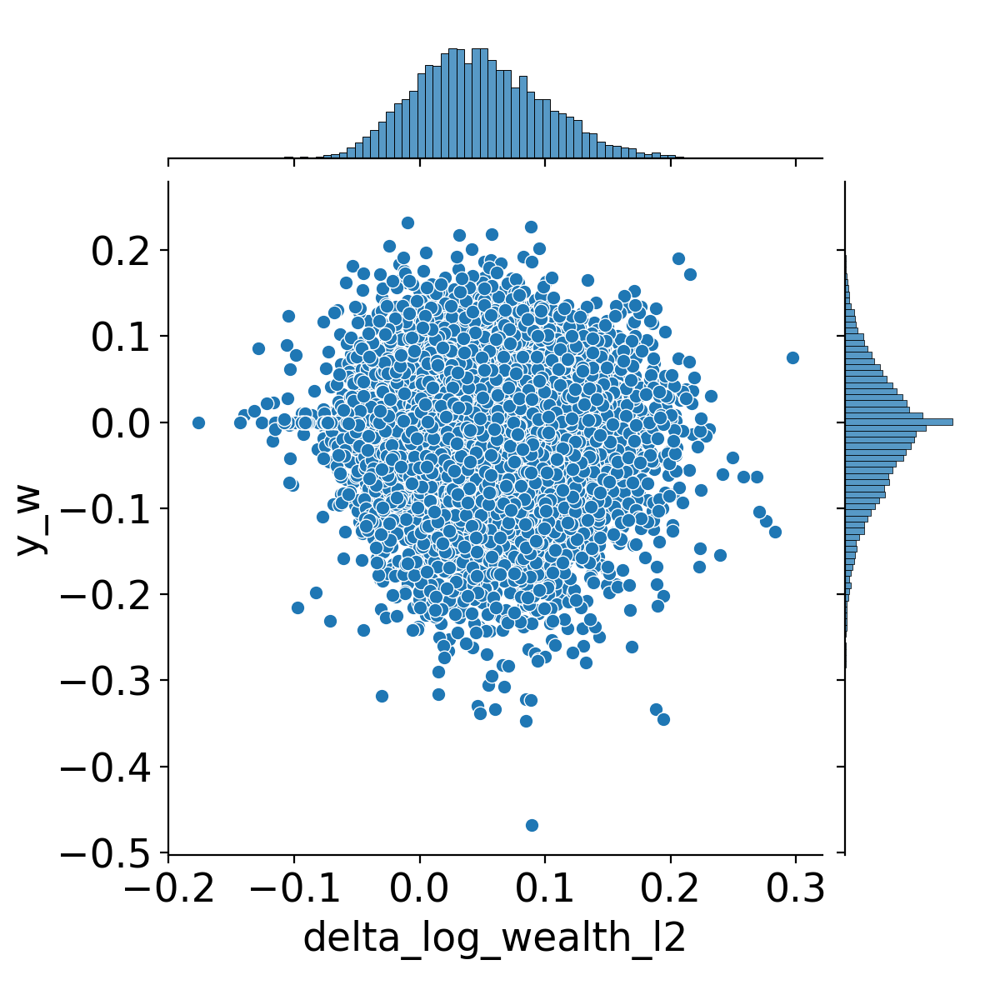

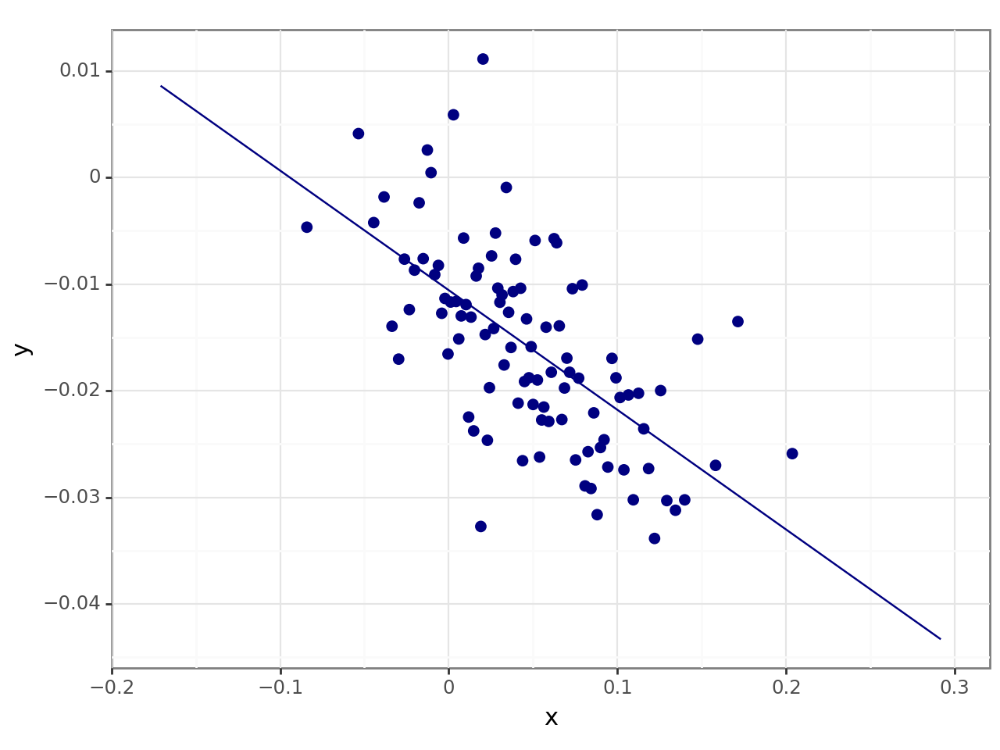

In [4]:
#CORRELATION
gender = "w"
data_regress = data
list = [f'control_part_inc_{gender}','control_cons','delta_log_fam_inc', 'delta_log_wealth', 'log_fam_inc_l', 'log_wealth_l',  'wage_shock','wage_shock_l','wage_shock_l2','wage_shock_j','wage_shock_j_l','wage_shock_j_l2','BMI','BMI_l','BMI_l2','BMI_j','BMI_j_l','BMI_j_l2','delta_log_wealth_l','delta_log_wealth_l2']
list = [f'control_part_inc_{gender}','control_cons','delta_log_fam_inc', 'delta_log_wealth', 'log_fam_inc_l', 'log_wealth_l',  'wage_shock','wage_shock_l','wage_shock_l2','wage_shock_j','wage_shock_j_l','wage_shock_j_l2','delta_log_wealth_l','delta_log_wealth_l2']

#list = ['wage_shock','wage_shock_j','delta_log_barganing_l']

#summary = data_regress[['delta_log_barganing']].describe()

for i in list:
    print(f'{i}')

    joint_plot = sns.jointplot(data_regress, x=f'{i}', y=f'y_{gender}')
    #joint_plot.fig.savefig(f'output/bargaining_x{i}_plot{model_name}_{gender}.png')
    #binspos='es' #like this equal spread does not work properly
    est = binsreg(data_regress[f'y_{gender}'],data_regress[f'{i}'], nbins=100, polyreg=1, noplot=False) #CANNOT GET TO SAVE AUTOMATICALLY
  





In [5]:

#MED KOTNROLLER LAV DEN
#est = binsreg(data_regress['delta_log_barganing'],data_regress[f'{i}'],  nbins=100,polyreg=1, noplot=False) #CANNOT GET TO SAVE AUTOMATICALLY
#est = binsreg(data_regress['delta_log_barganing'],data_regress[f'{i}'], w=list2, nbins=100,polyreg=1, noplot=False) #CANNOT GET TO SAVE AUTOMATICALLY



In [6]:
#UDEN 0
#if name != "model_FC":
#    data_regress = data
#    data_regress = data_regress[data_regress['delta_log_barganing']< 0.5]
#    data_regress = data_regress[data_regress['delta_log_barganing']> -0.5]
#    data_regress = data_regress[data_regress['delta_log_barganing']!= 0]


#    for i in list:
#        print(f'{i}')
#
#        joint_plot = sns.jointplot(data_regress, x=f'{i}', y=f'delta_log_barganing')
        #joint_plot.fig.savefig(f'output/bargaining_x{i}_plot{model_name}_{gender}_restrict.png')
        #binspos='es' #like this equal spread does not work properly
#        est = binsreg(data_regress['delta_log_barganing'],data_regress[f'{i}'], nbins=100,polyreg=1, noplot=False) #CANNOT GET TO SAVE AUTOMATICALLY


#relationen bliver meget mindre kraftigt, for 0 --> trækker mode at ting bliver insignifikante selv i LC,

                            OLS Regression Results                            
Dep. Variable:                    y_w   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     8250.
Date:                Sun, 19 May 2024   Prob (F-statistic):               0.00
Time:                        13:29:35   Log-Likelihood:                 26986.
No. Observations:                9568   AIC:                        -5.391e+04
Df Residuals:                    9539   BIC:                        -5.371e+04
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0033    

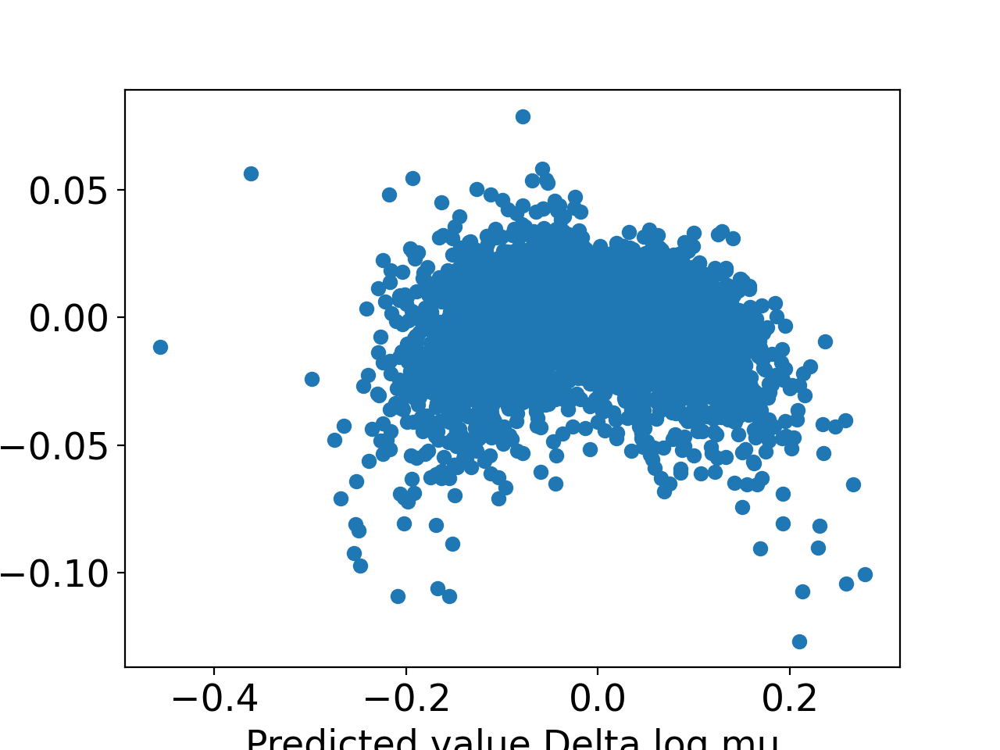

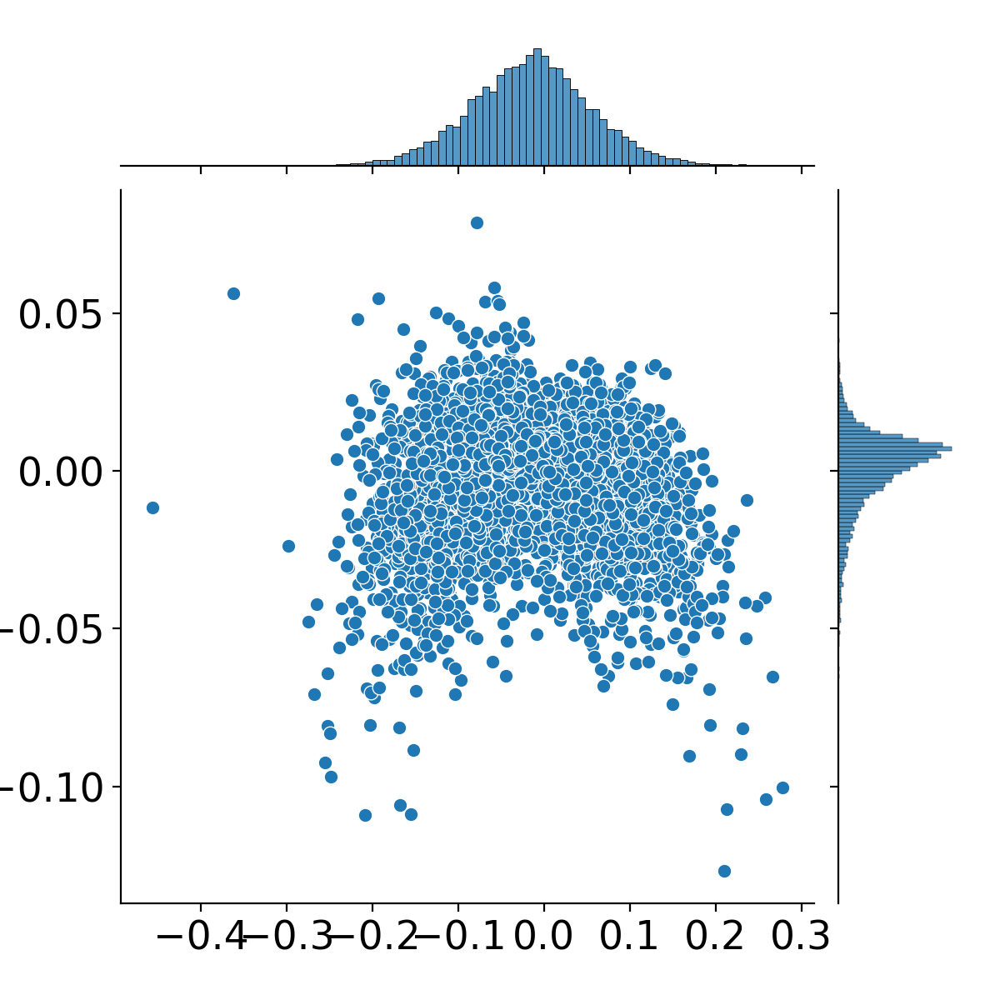

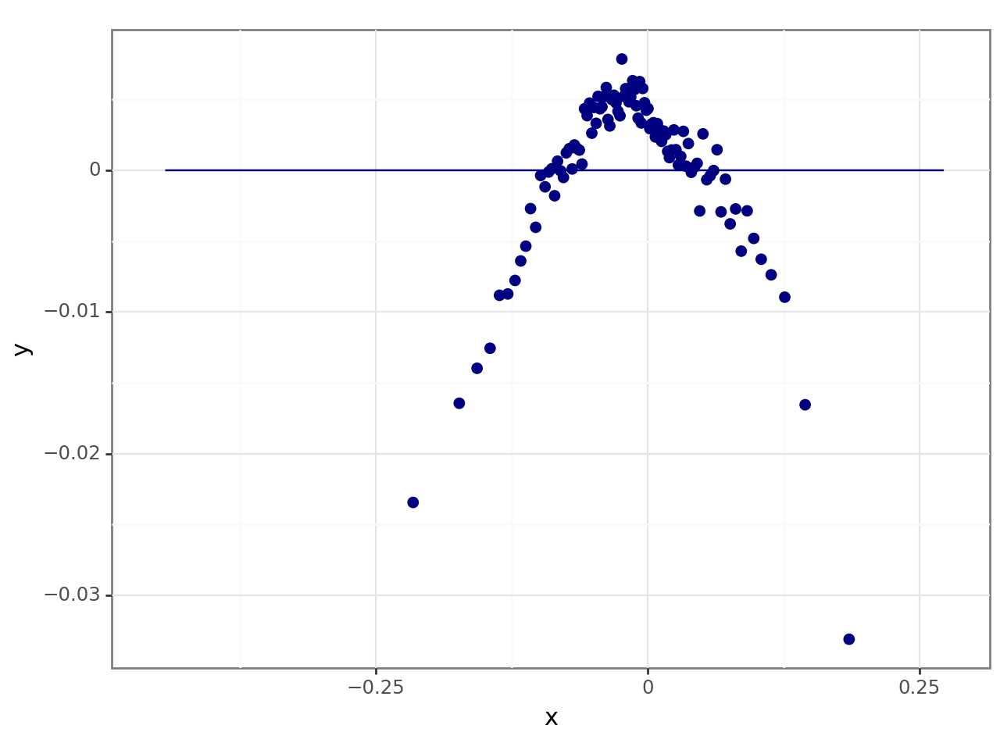


control_part_inc_w


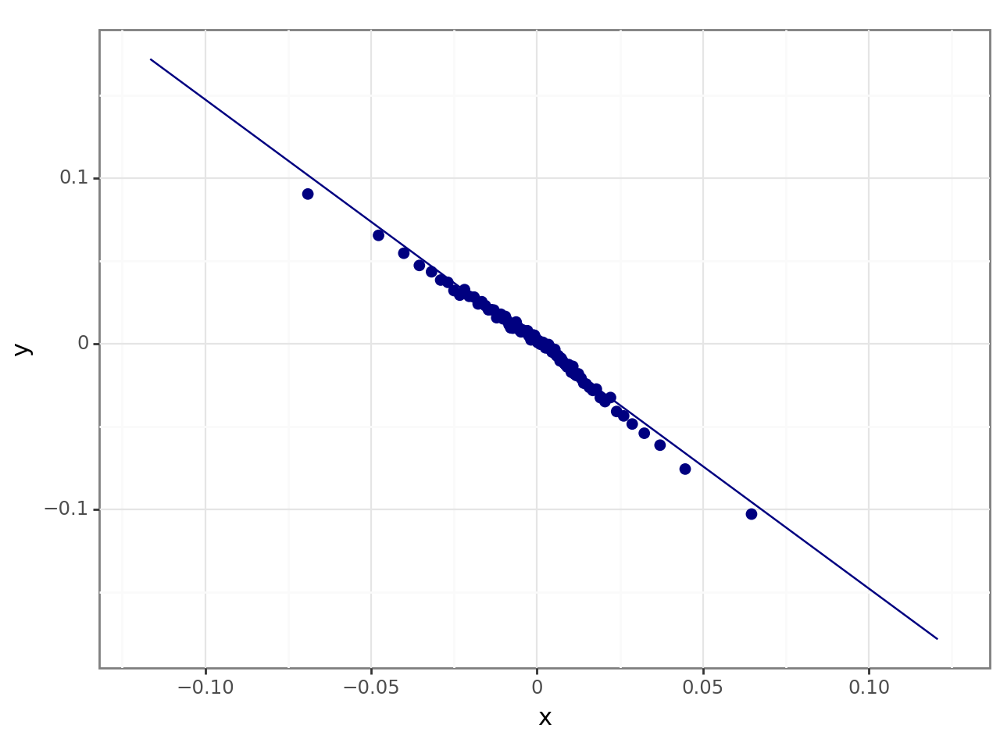


control_cons


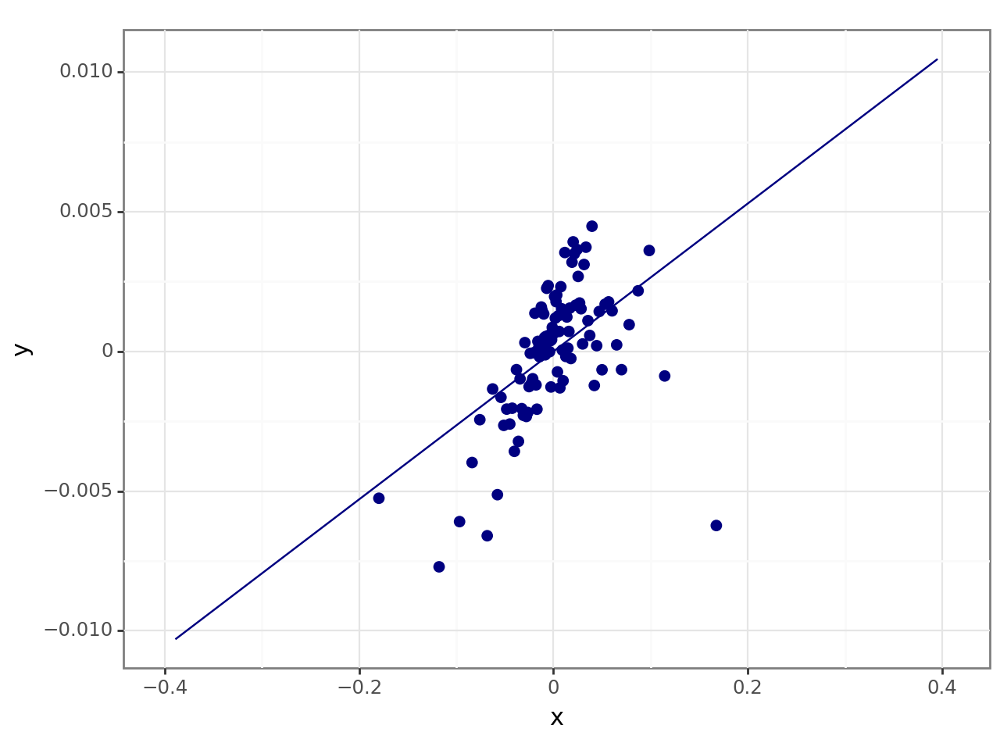


delta_log_fam_inc


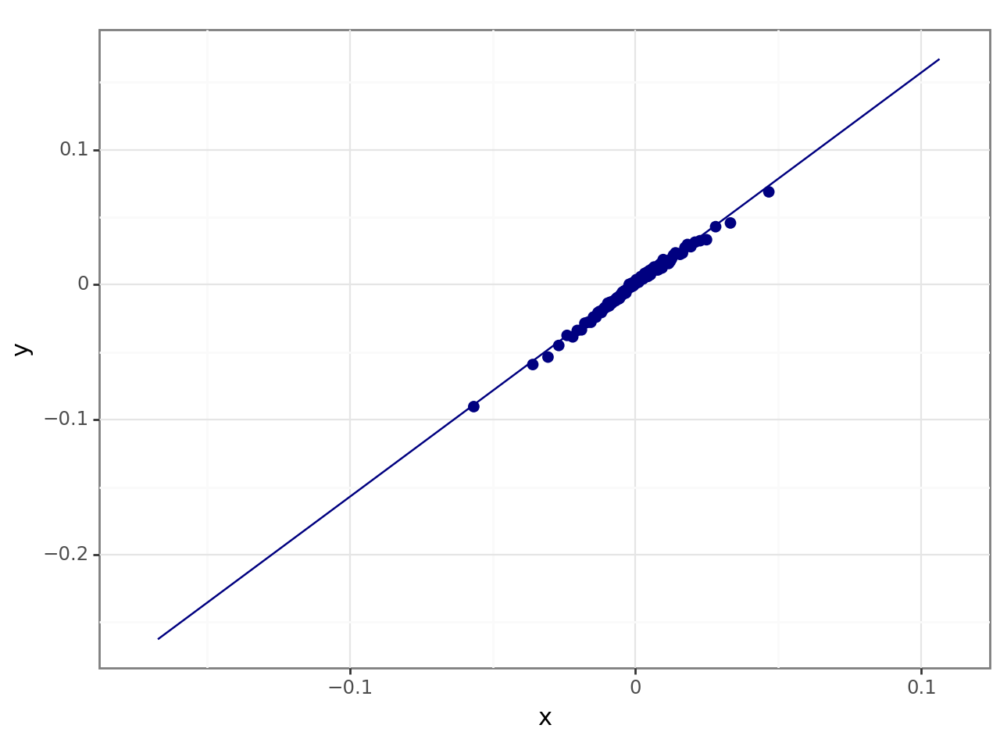


delta_log_wealth


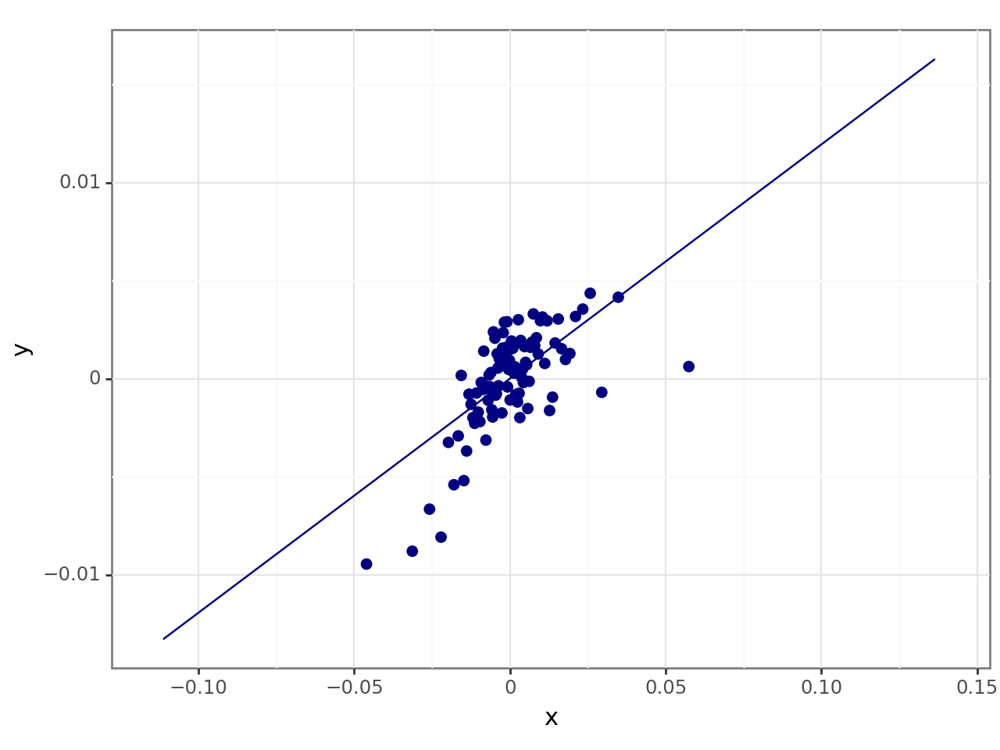


log_fam_inc_l


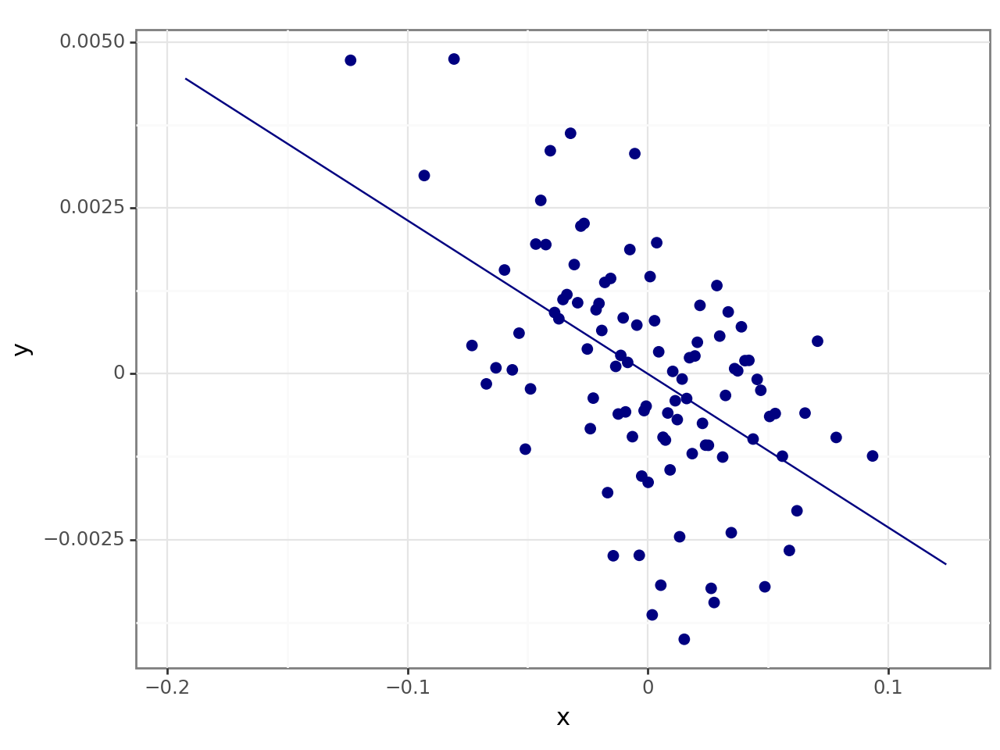


log_wealth_l


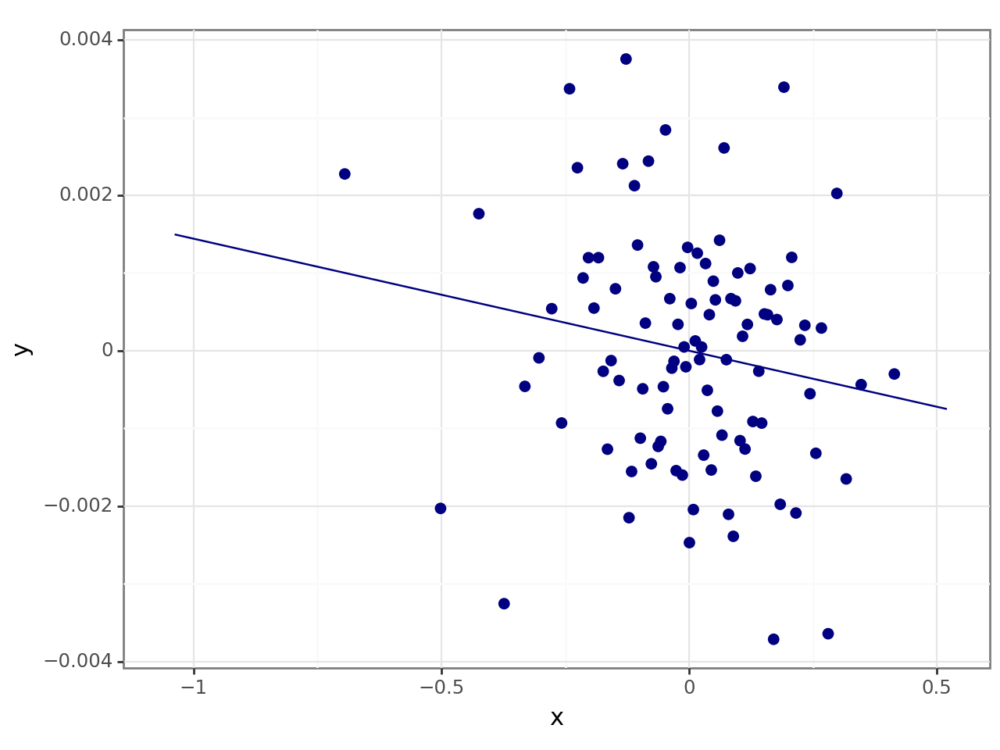


wage_shock


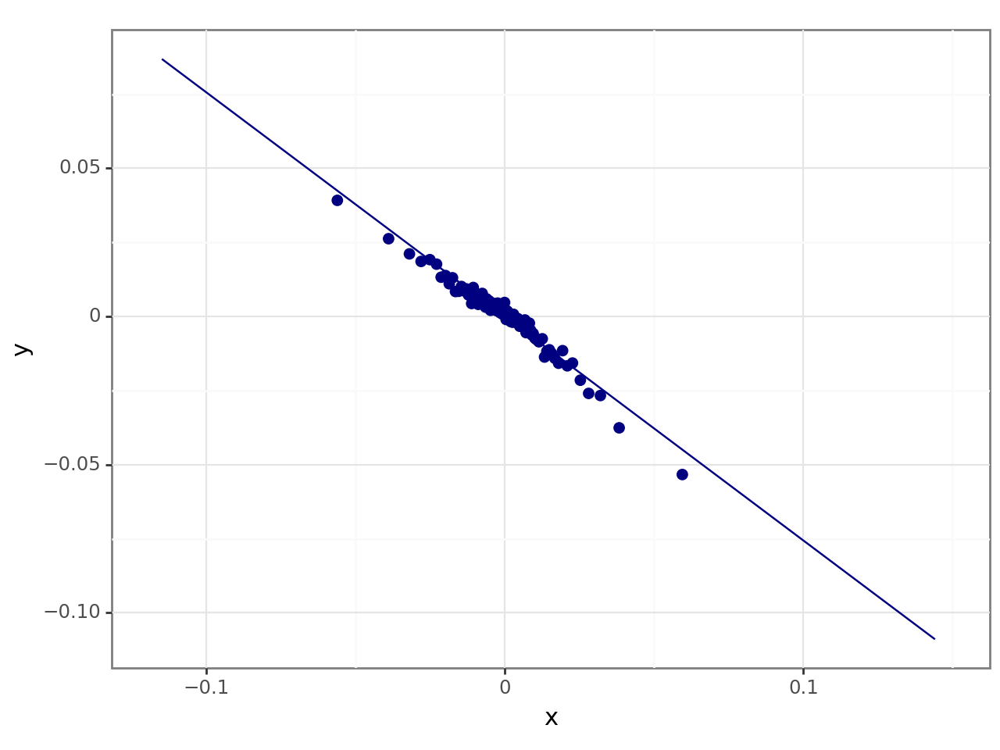


wage_shock_l


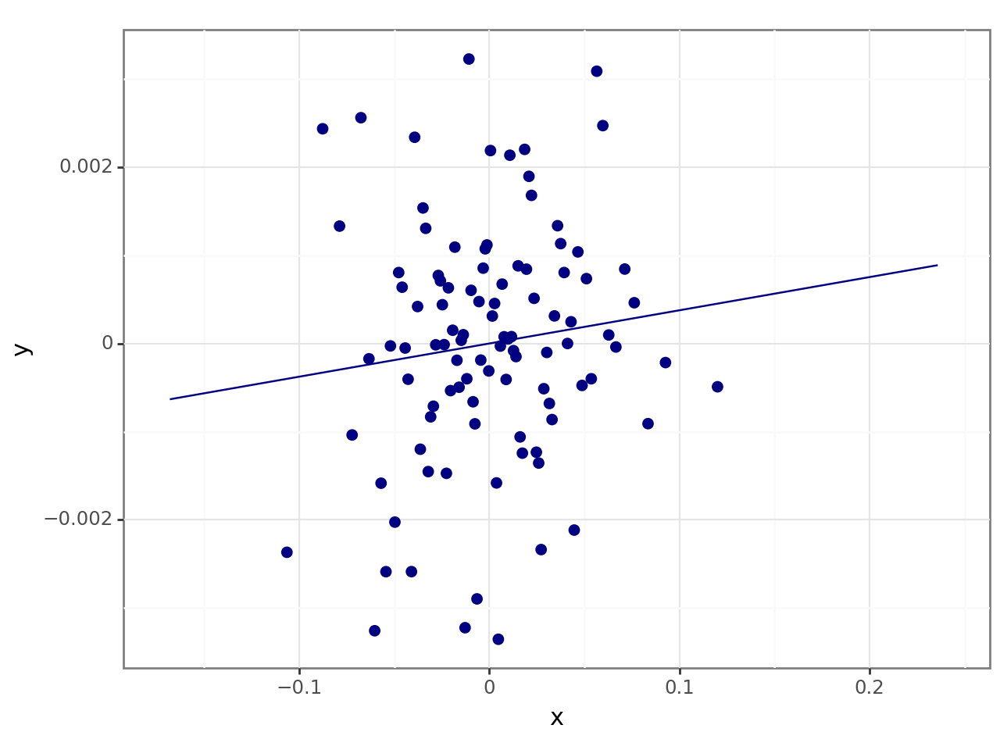


wage_shock_l2


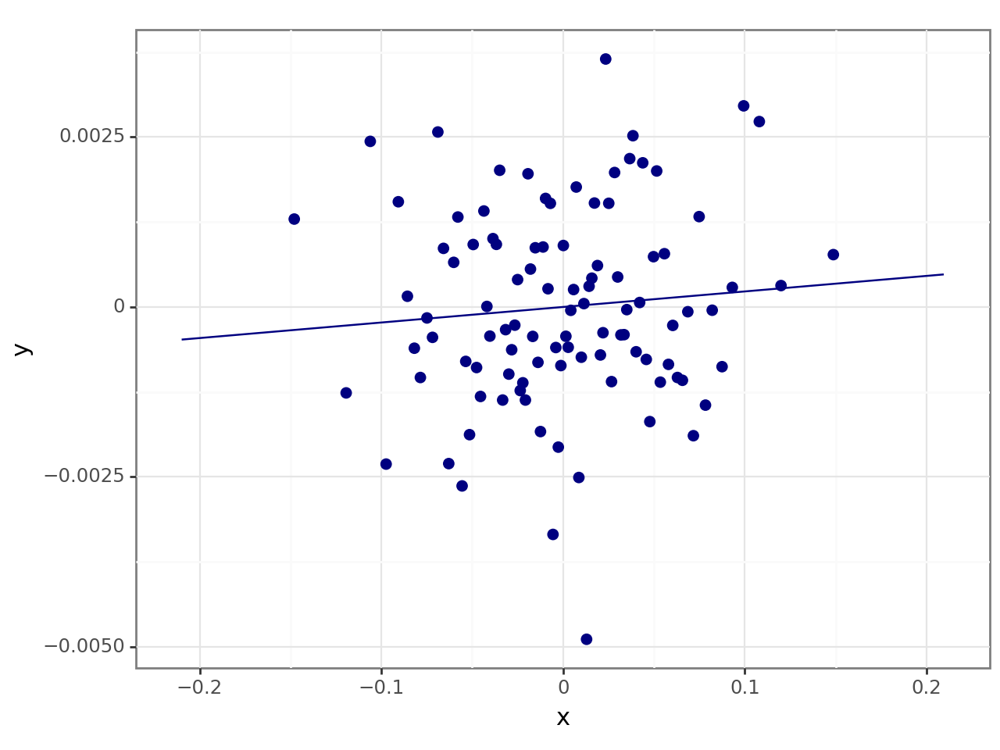


wage_shock_j


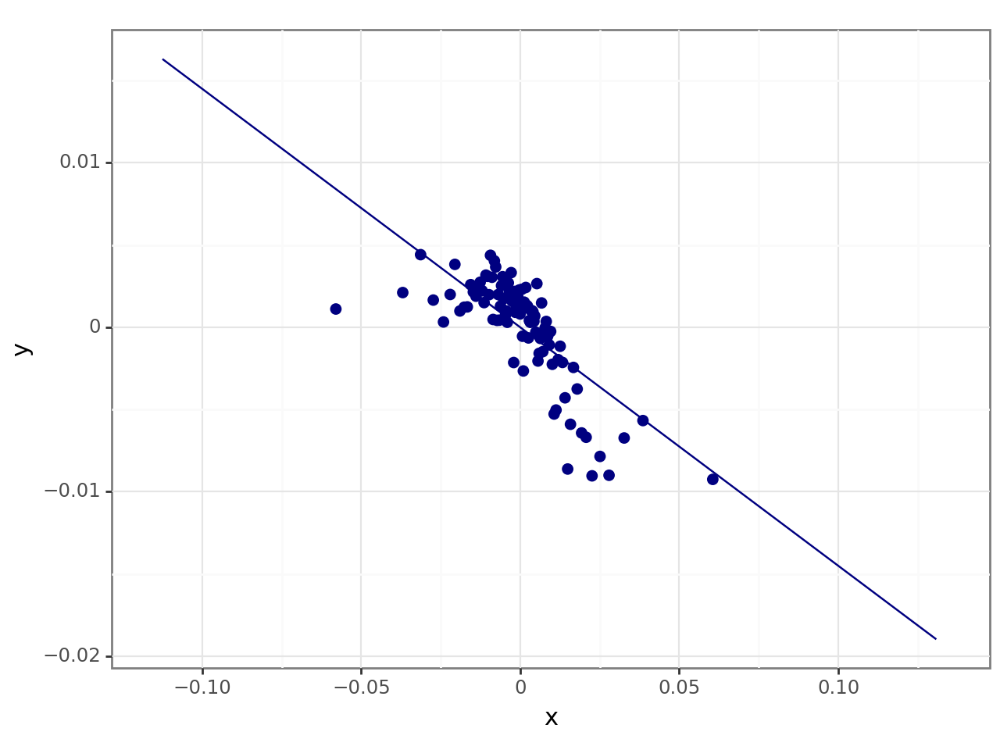


wage_shock_j_l


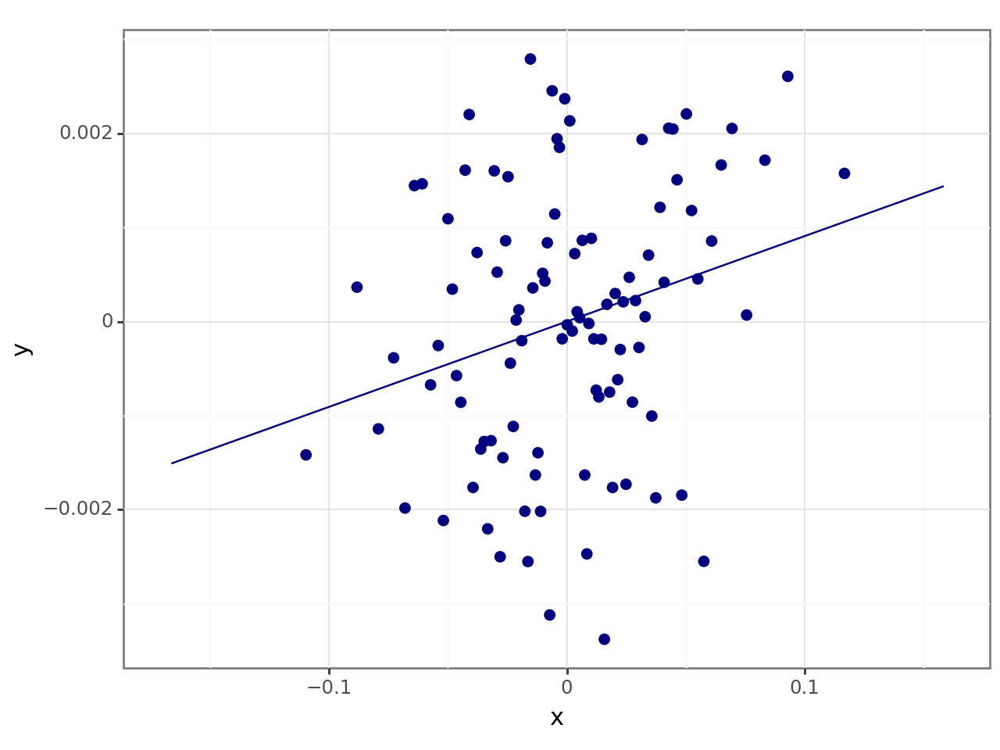


wage_shock_j_l2


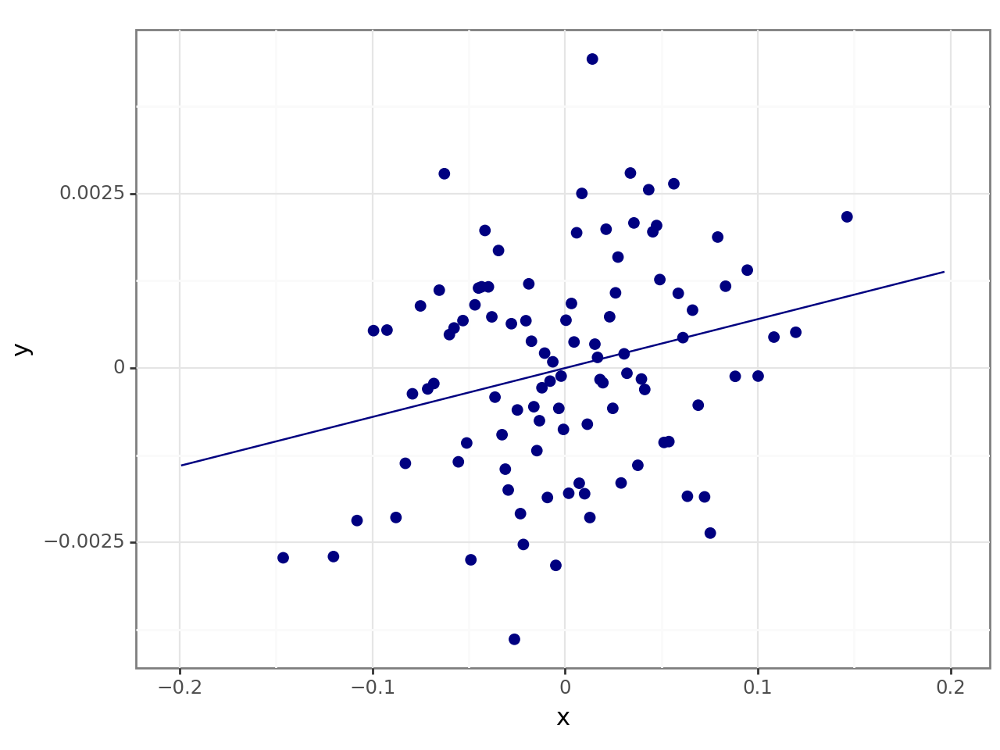


BMI


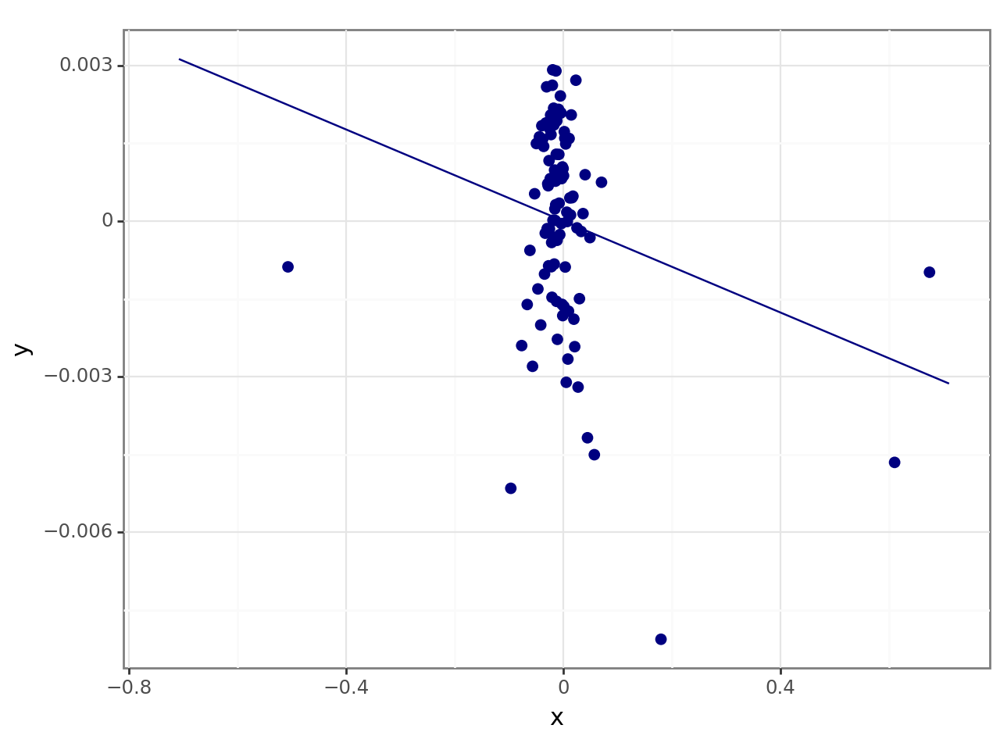


BMI_l


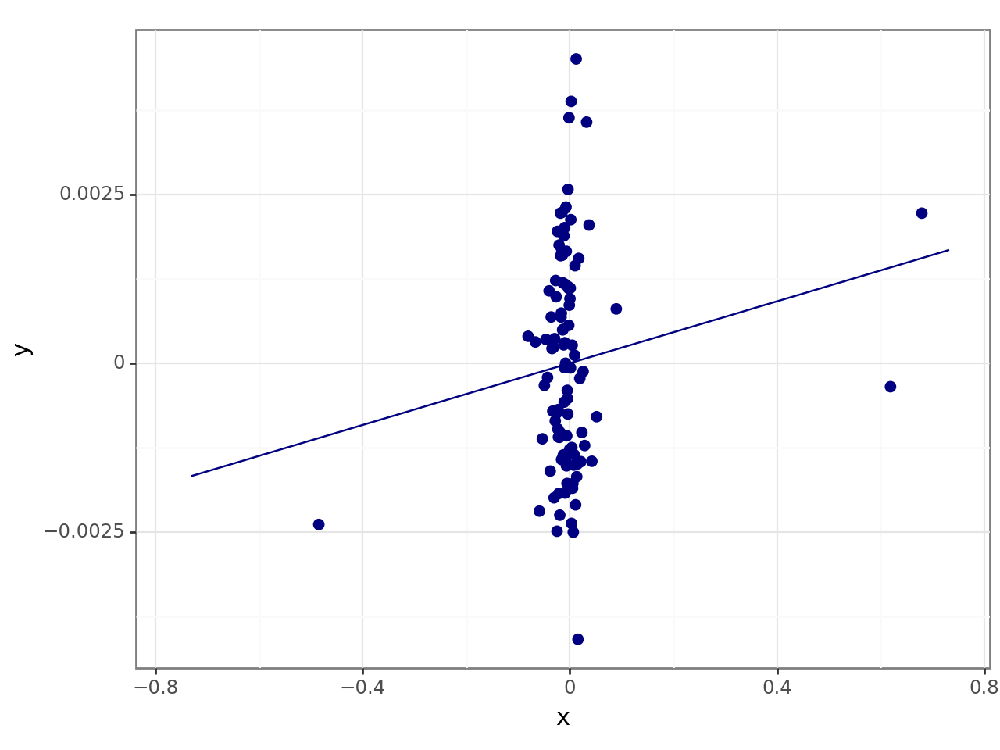


BMI_l2


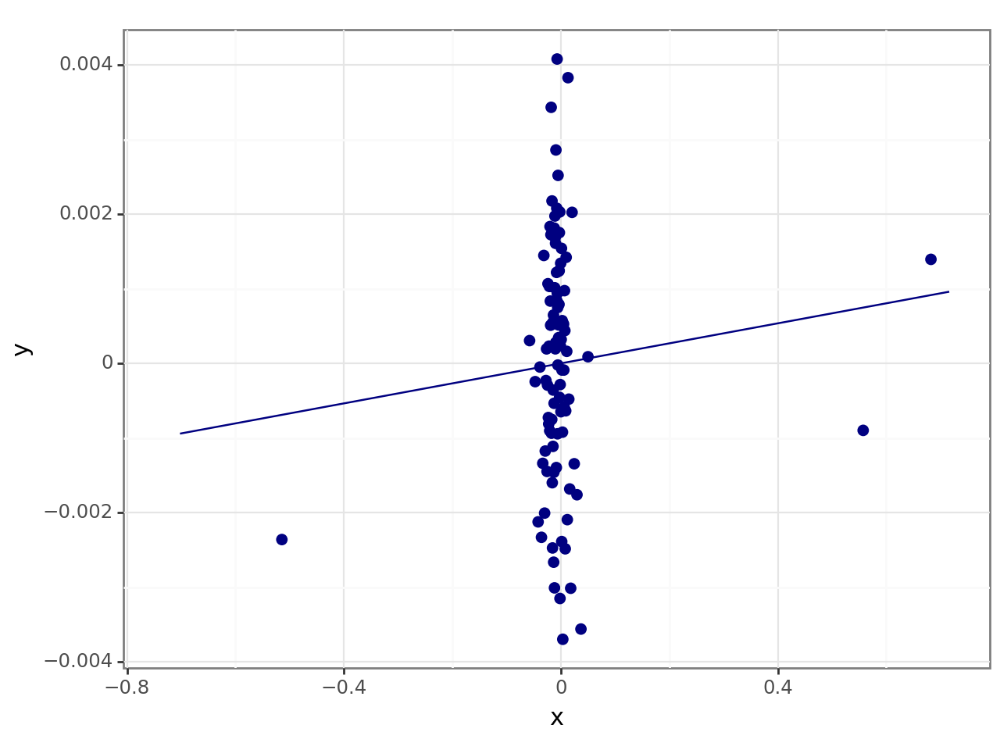


BMI_j


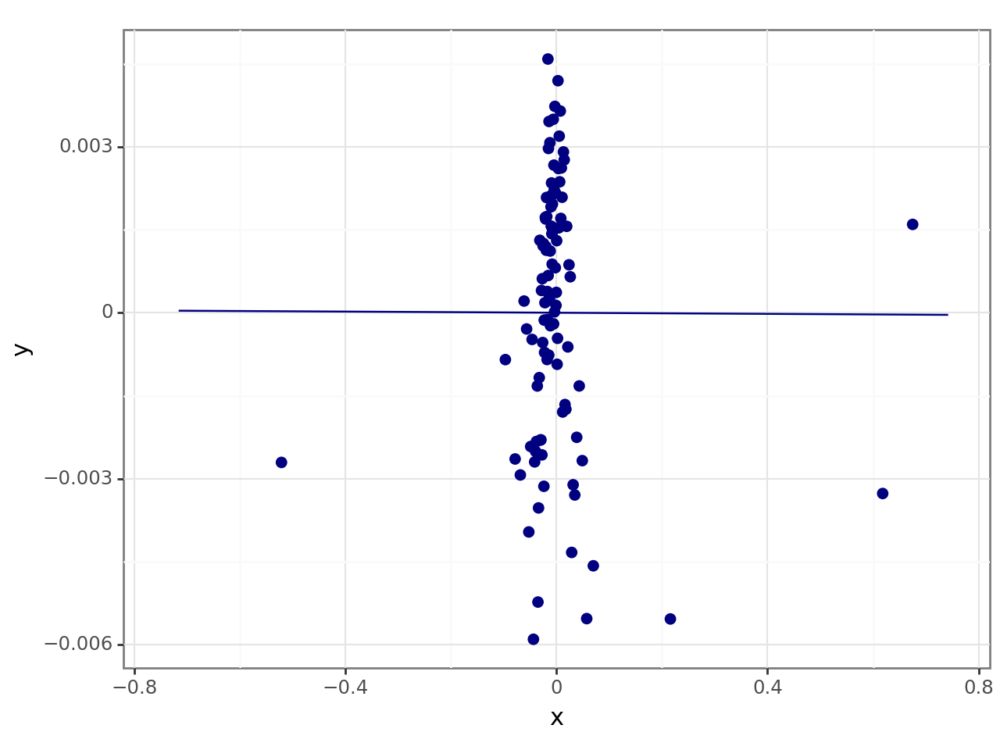


BMI_j_l


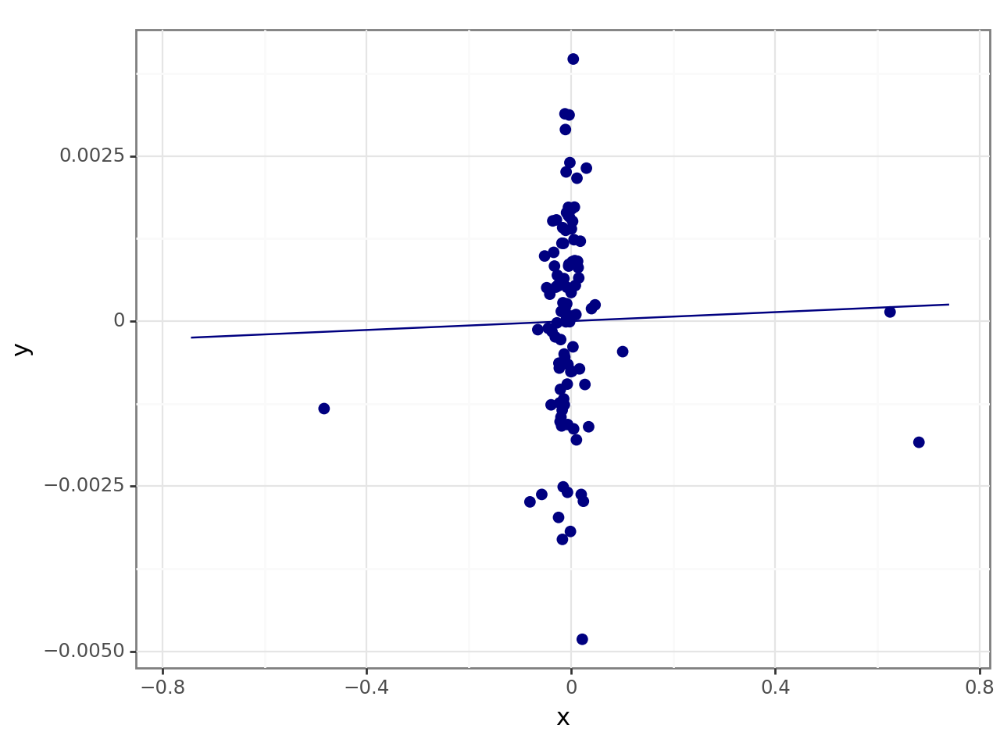


BMI_j_l2


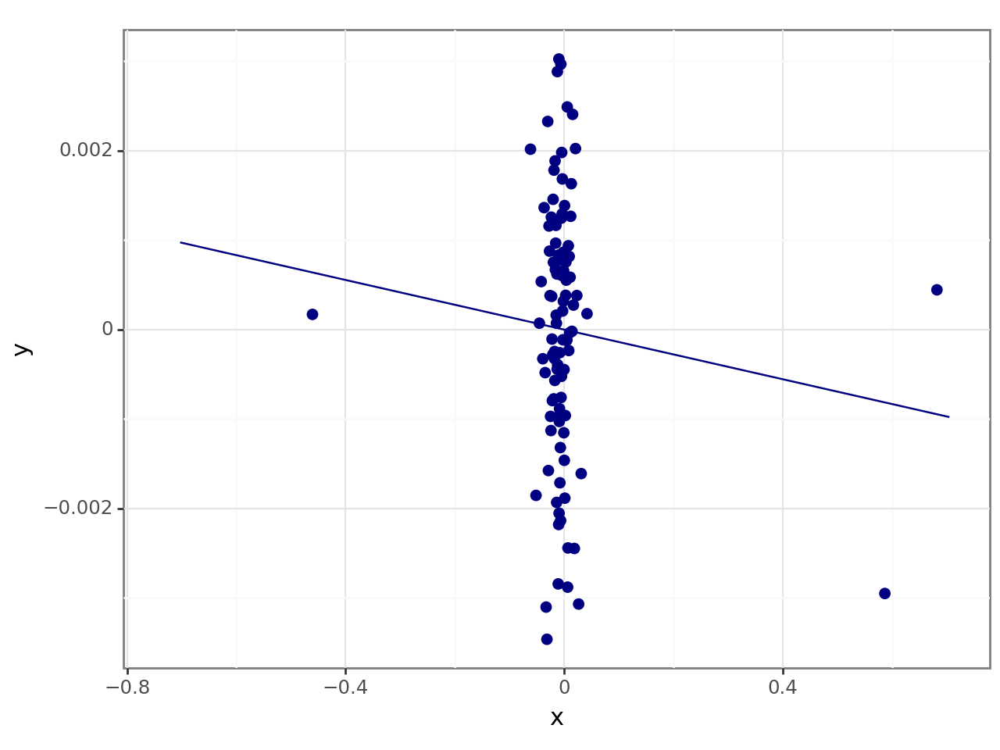


delta_log_wealth_l


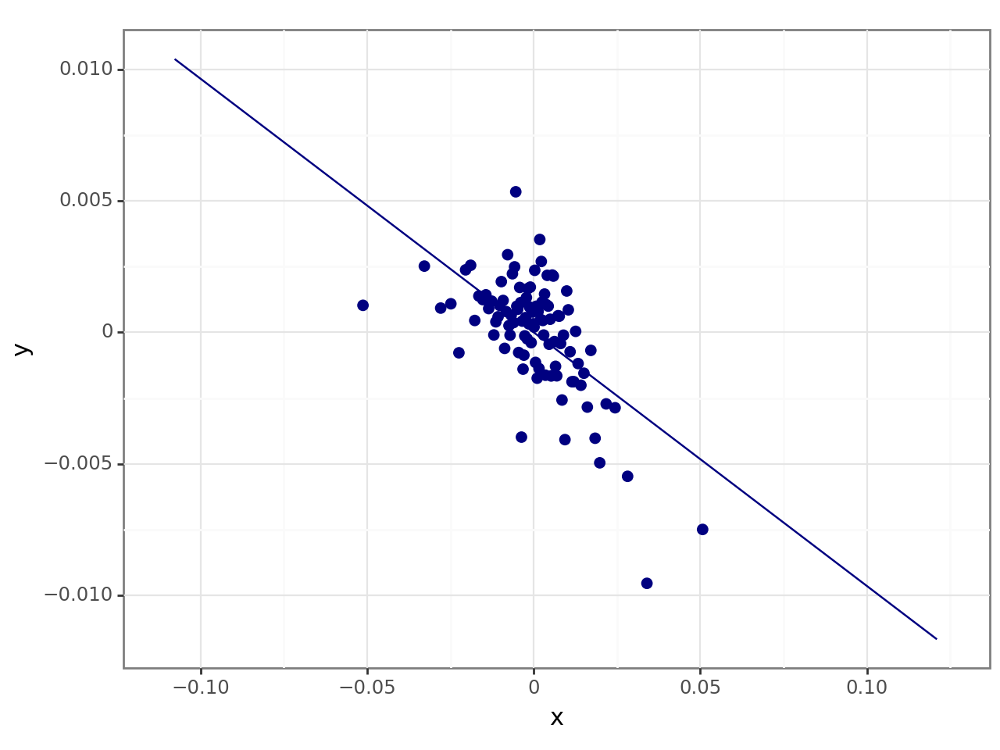


delta_log_wealth_l2


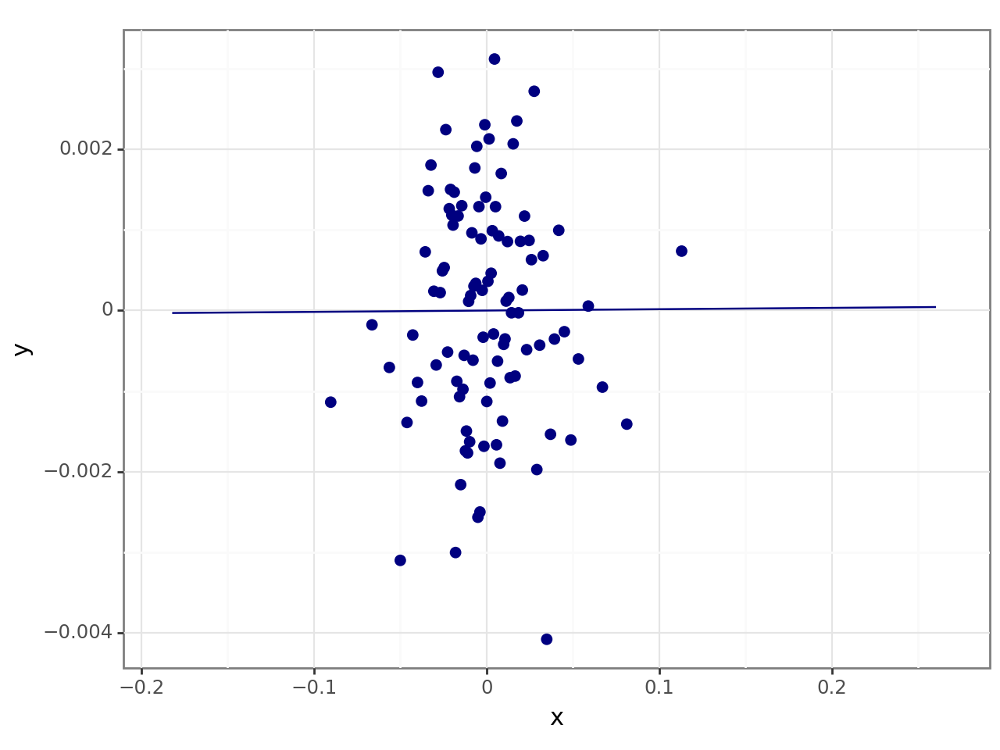

In [7]:

#HOURS, final regression 
gender = "w"
#Find the gender and the gender of the spouse
if gender == "w":
    spouse = "m"
elif gender =='m':
    spouse = "w"

  
data['wage_shock']=data[f'omega_res_{gender}']
data['wage_shock_l']=data[f'omega_res_{gender}_l']
data['wage_shock_l2']=data[f'omega_res_{gender}_l2']
data['wage_shock_j']=data[f'omega_res_{spouse}']
data['wage_shock_j_l']=data[f'omega_res_{spouse}_l']
data['wage_shock_j_l2']=data[f'omega_res_{spouse}_l2']
    

  
data['BMI'] = data[f'delta_log_BMI_{gender}']
data['BMI_l'] = data[f'delta_log_BMI_{gender}_l']
data['BMI_l2'] = data[f'delta_log_BMI_{gender}_l2']
data['BMI_j'] = data[f'delta_log_BMI_{spouse}']
data['BMI_j_l'] = data[f'delta_log_BMI_{spouse}_l']
data['BMI_j_l2'] = data[f'delta_log_BMI_{spouse}_l2']




data_regress = data[['t',f'inc_share_{spouse}_l',f'delta_log_earnings_{spouse}','init_barg','log_earnings_w', 'log_earnings_m','log_earnings_w_l', 'log_earnings_m_l', 'inc_share_w', 'inc_share_w_l','log_wealth', 'wealth_F',  f'y_{gender}', 'idx', 'wage_shock','wage_shock_l','wage_shock_l2','wage_shock_j','wage_shock_j_l','wage_shock_j_l2','BMI','BMI_l','BMI_l2','BMI_j','BMI_j_l','BMI_j_l2',f'control_part_inc_{gender}','control_cons','delta_log_wealth','delta_log_wealth_l','delta_log_wealth_l2','delta_log_Love','delta_log_Love_l','delta_log_Love_l2','delta_log_fam_inc', 'log_fam_inc' , 'log_fam_inc_l', 'log_fam_inc_l2', 'log_wealth_l', 'log_wealth_l2']]

#DROP NAN
data_regress = data_regress.dropna() # det ser ud som om den ikke fjerner nogen

#PREPARE T
X_t=pd.get_dummies(data_regress[['t', 'init_barg']], columns = ['t','init_barg'], prefix = ['D_t','D_init_barg'], dtype = float) 
#X_t=pd.get_dummies(data['t''init_barg'], columns = ['t'], prefix = 'D_t', dtype = float, drop_first=True,  ) 
X_t = X_t.drop(columns = ['D_t_13','D_init_barg_1']) #drop reference cat

#consumption
cons = data_regress[['control_cons']]

#earnings_inc

inc_share = data_regress[[f'control_part_inc_{gender}']]


    #SHADOW VALUE: 
Shadow_value = data_regress[['delta_log_fam_inc', 'delta_log_wealth', 'log_fam_inc_l', 'log_wealth_l']]

 
df = data_regress.drop(columns = ['t','init_barg',f'inc_share_{spouse}_l','control_cons', f'control_part_inc_{gender}', f'delta_log_earnings_{spouse}', 'log_earnings_w', 'log_fam_inc' , 'log_earnings_m','log_earnings_w_l', 'log_earnings_m_l', 'inc_share_w', 'inc_share_w_l','log_wealth', 'wealth_F',  f'y_{gender}', 'idx','delta_log_fam_inc', 'log_fam_inc_l', 'log_wealth_l', 'log_fam_inc_l2', 'log_wealth_l2', 'delta_log_wealth'])
    

#df = df.drop(columns = ['wage_shock_j_l2','wage_shock_l2','BMI_l2','BMI_j_l2','delta_log_wealth_l2'])
    
df = df.drop(columns = ['delta_log_Love','delta_log_Love_l','delta_log_Love_l2'])
    

#REGRESS
y  = data_regress[f'y_{gender}']
x1 = pd.concat([df,  X_t , Shadow_value, inc_share, cons], axis=1 )
#x = x.T.drop_duplicates().T #drop duplicates
x1 = sm.add_constant(x1)  
#result = sm.OLS(y,x).fit() 

result2 = sm.OLS(y,x1).fit()
print(result2.summary())
res = result2.resid
predict = result2.predict()
data_regress['res'] = res
data_regress['predict'] = predict
params = result2.params

print('residual plot')
plt.scatter(predict,res)
plt.ylabel("Residual Delta log mu")
plt.xlabel(f'Predicted value Delta log mu')

#plt.savefig(f'output/barg_res_predict_plot{model_name}_{gender}.png')
plt.show()
joint_plot = sns.jointplot(data_regress, x=predict, y=res)
est = binsreg(res,predict, nbins=100,polyreg=1, noplot=False) 


#print('res against y')
#plt.scatter(data_regress[['delta_log_barganing']],res)
#plt.show()

list = [f'control_part_inc_{gender}','control_cons','delta_log_fam_inc', 'delta_log_wealth', 'log_fam_inc_l', 'log_wealth_l',  'wage_shock','wage_shock_l','wage_shock_l2','wage_shock_j','wage_shock_j_l','wage_shock_j_l2',  'BMI','BMI_l','BMI_l2','BMI_j','BMI_j_l','BMI_j_l2','delta_log_wealth_l','delta_log_wealth_l2']



for i in list :
    

    xlabel = f'{i}'
    if i == "wage_shock":
        xlabel = "Shock to wage"
    elif i == "wage_shock_j":
        xlabel = "Shock to partners wage"
    elif i == "delta_log_barganing_l":
        xlabel = "Change in barganing weigth, lag"

    data_regress_neg = data_regress[data_regress[f'{i}']<0]
    data_regress_pos = data_regress[data_regress[f'{i}']>0]
    x = x1
    y2 = x[f'{i}']
    x = x.drop(columns = [f'{i}'])
    
    #x = x.drop(columns = list_drop)
    #x = x.T.drop_duplicates().T #drop duplicates
    x = sm.add_constant(x)  
    
    result= sm.OLS(y,x).fit()
    res_y = result.resid
    data_regress[f'res_y'] = res_y
    
    result= sm.OLS(y2,x).fit()
    res_x = result.resid
    #data_regress[[f'res_x']]=res_x


    
    #joint_plot = sns.jointplot(data_regress, x='res_x', y='res_y')
    print(f'{i}')
    est = binsreg(res_y,res_x, nbins=100,polyreg=1, noplot=False) 
    
    
  
   


C:\Users\czk481\AppData\Local\Temp\2\ipykernel_11100\3232345479.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\czk481\AppData\Local\Temp\2\ipykernel_11100\3232345479.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\czk481\AppData\Local\Temp\2\ipykernel_11100\3232345479.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.or

                            OLS Regression Results                            
Dep. Variable:                    y_w   R-squared:                       0.942
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     684.9
Date:                Sun, 19 May 2024   Prob (F-statistic):               0.00
Time:                        13:29:47   Log-Likelihood:                 25134.
No. Observations:                9568   AIC:                        -4.983e+04
Df Residuals:                    9347   BIC:                        -4.824e+04
Df Model:                         220                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.3351 

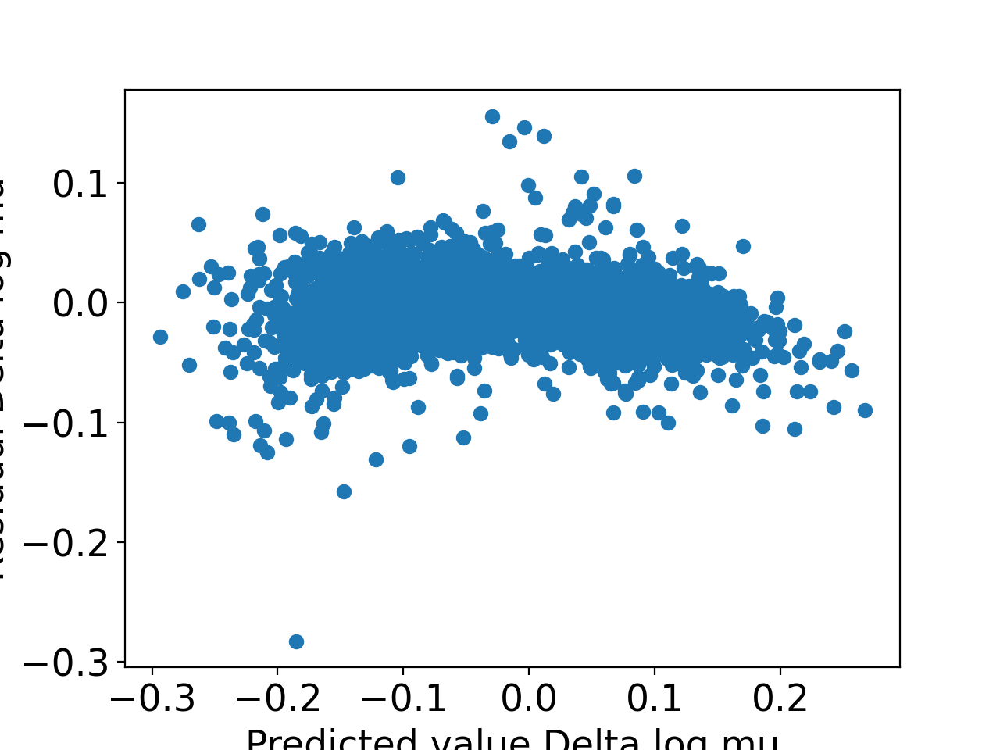

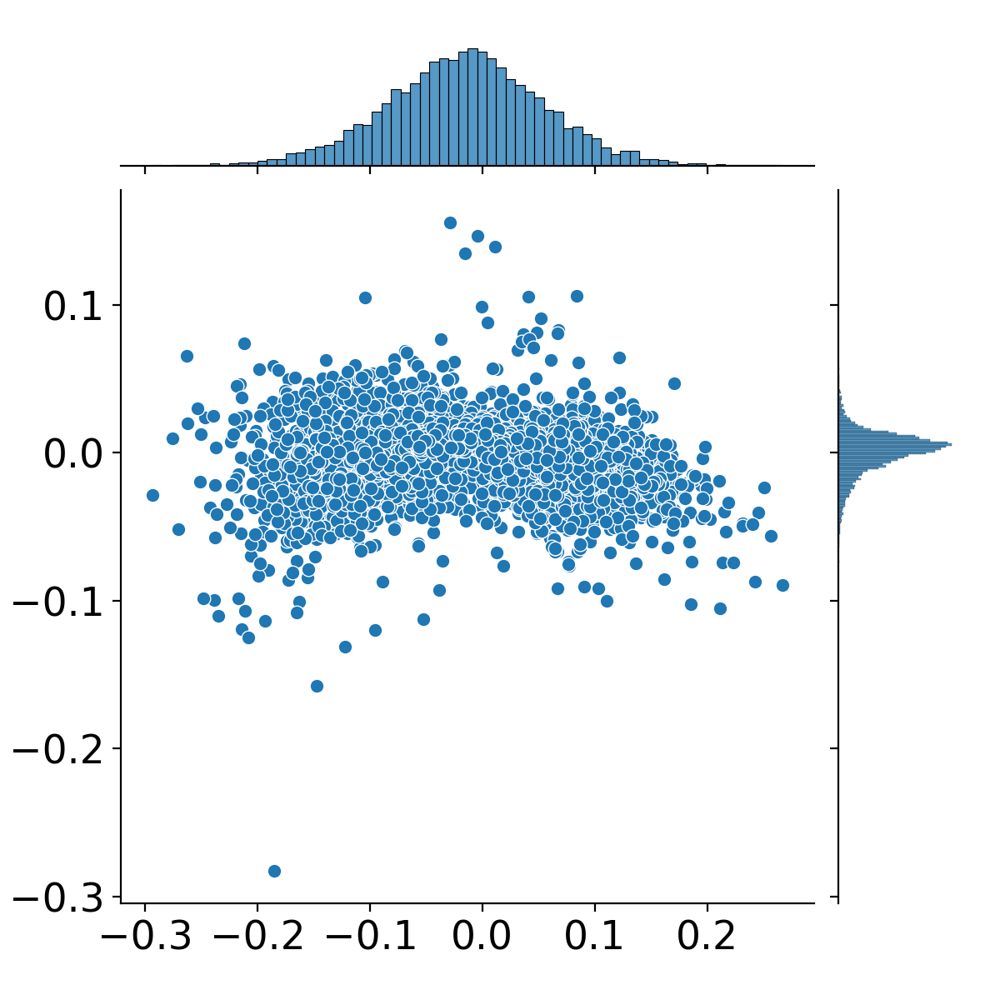

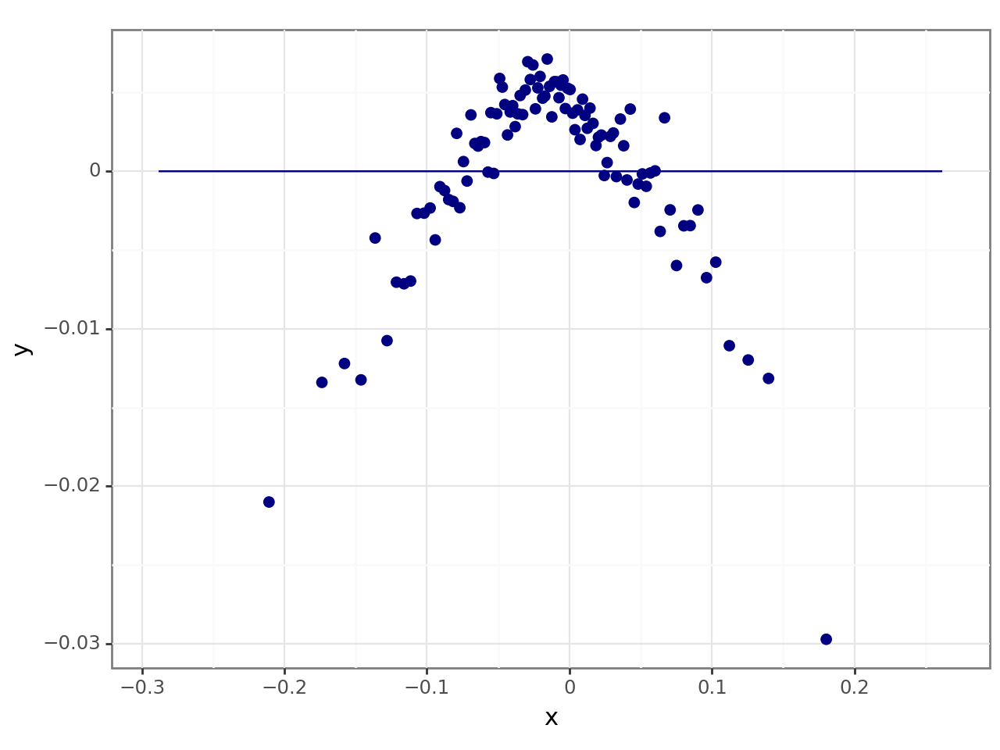


control_part_inc_w


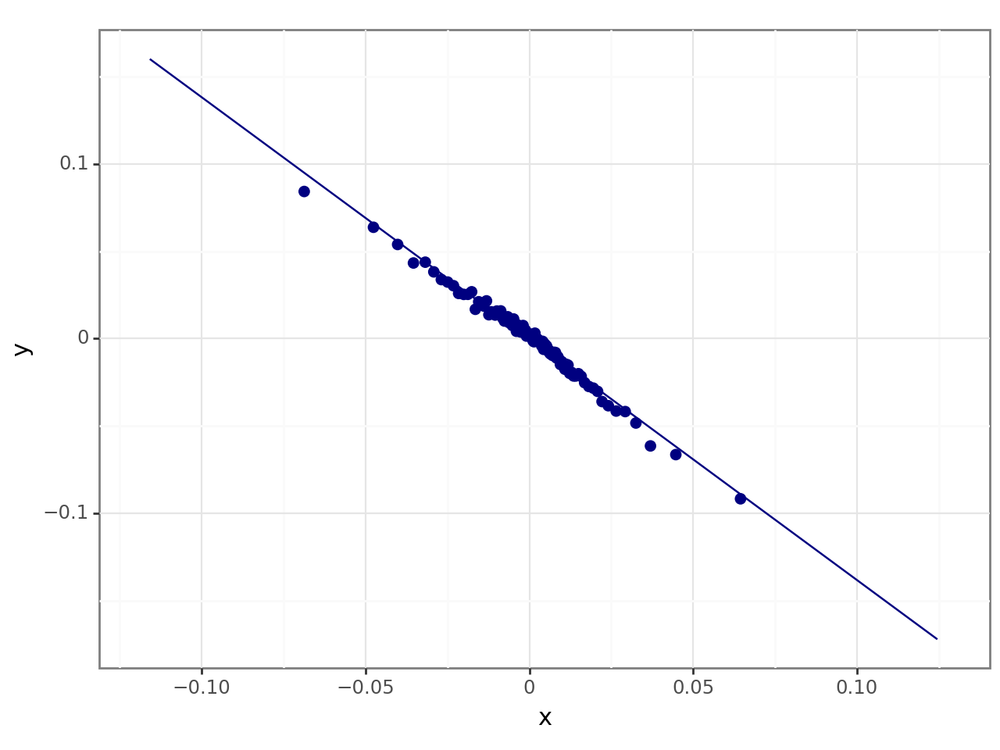


control_cons


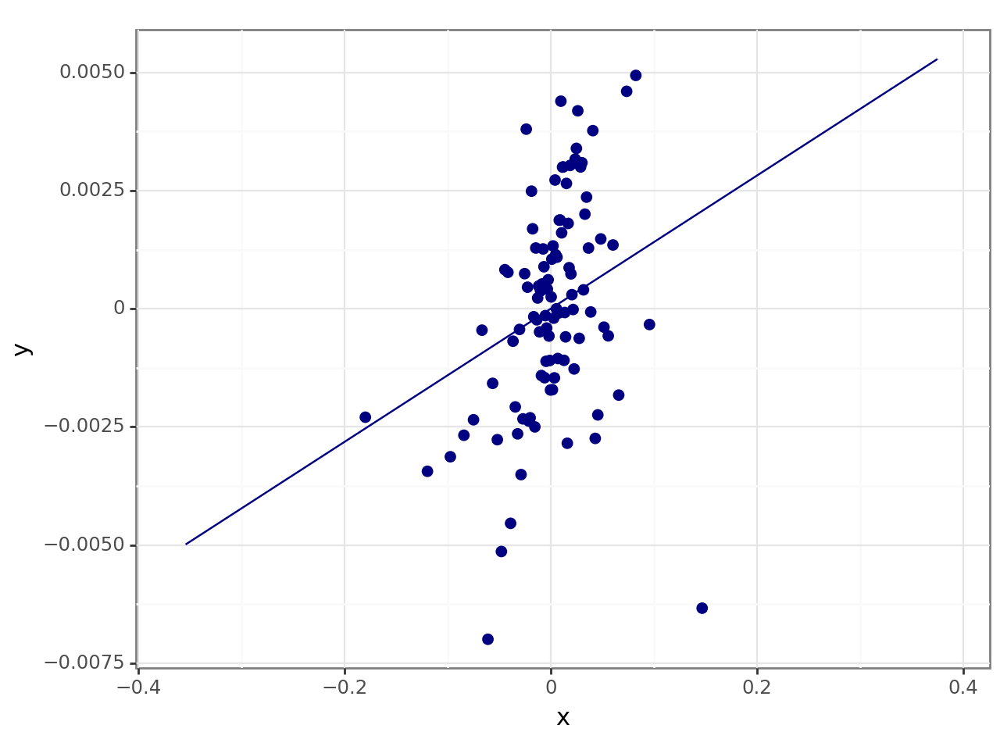


wage_shock


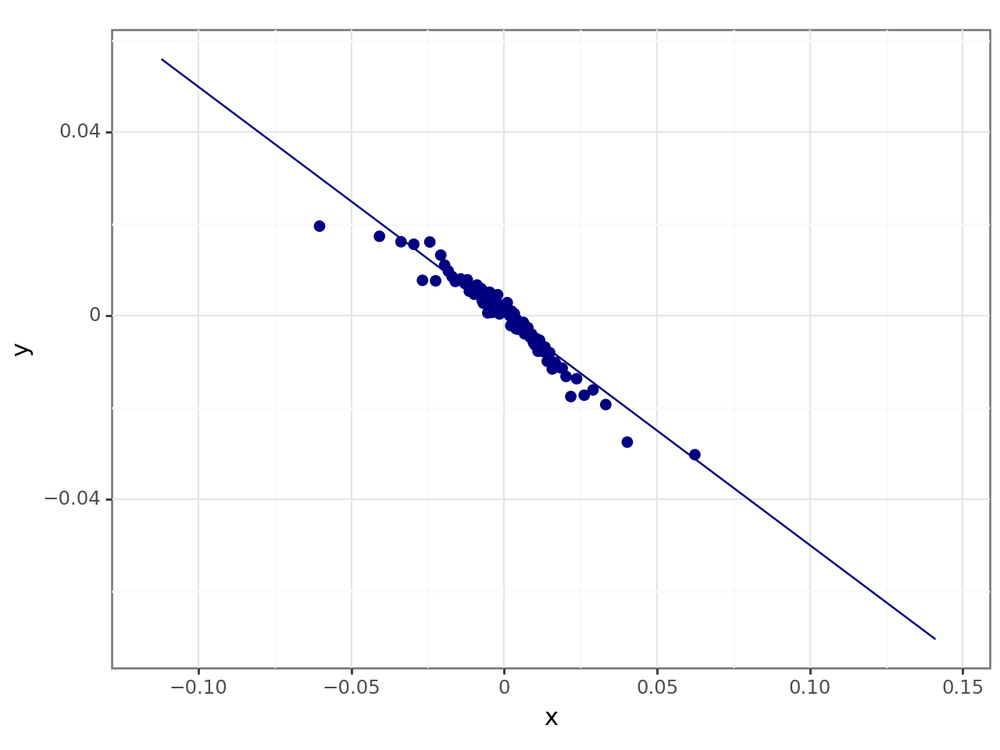


wage_shock_l


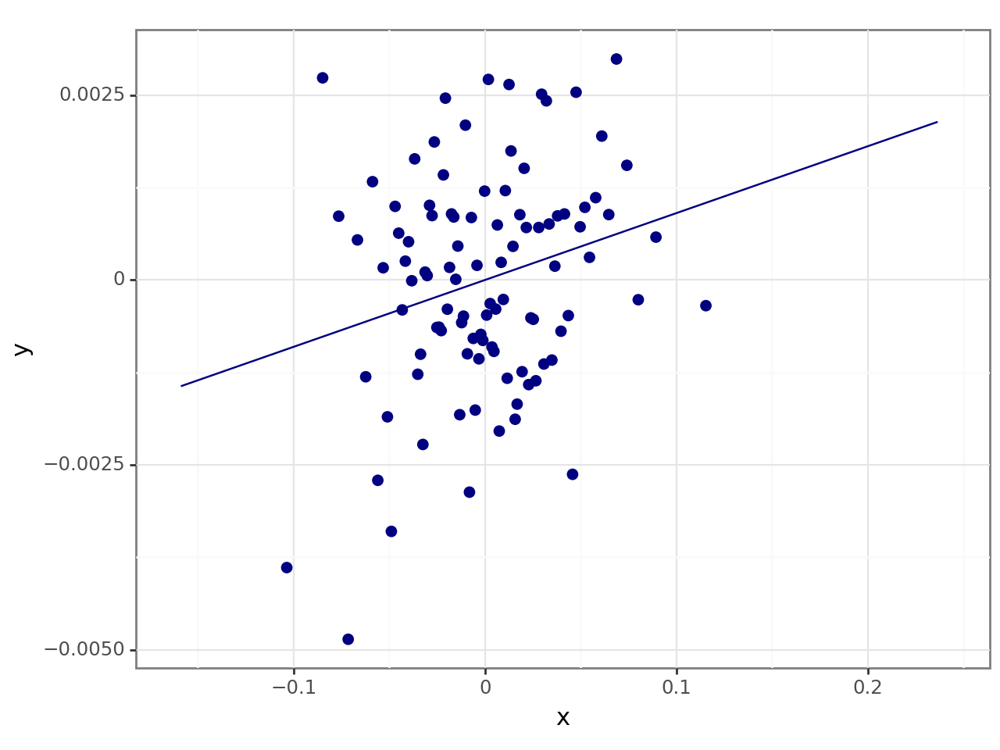


wage_shock_l2


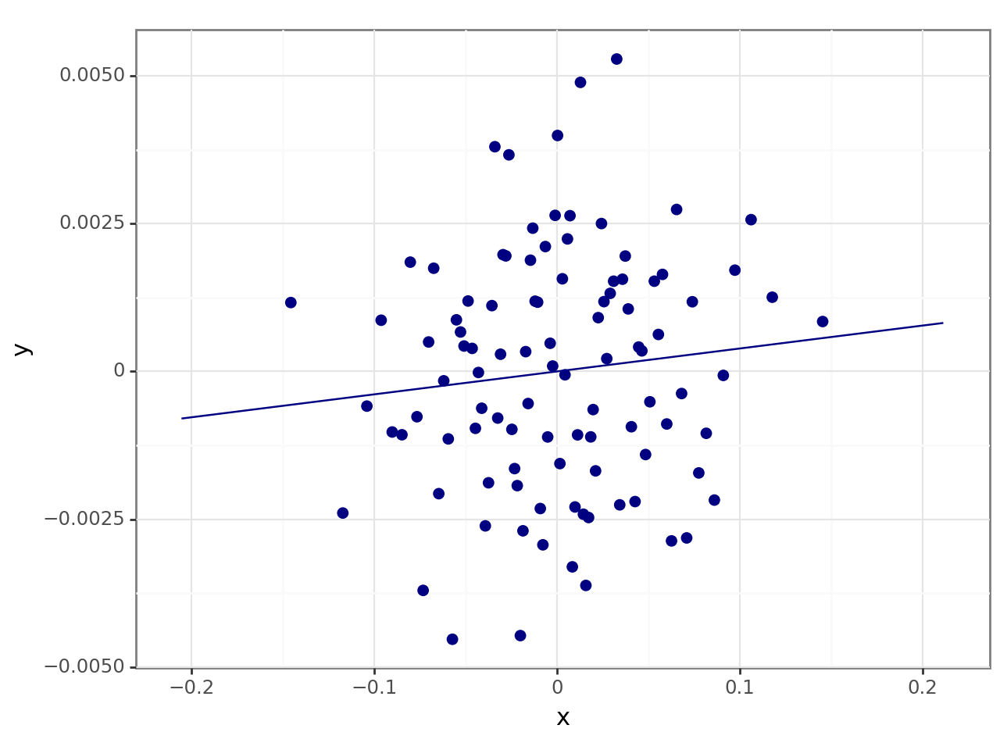


wage_shock_j


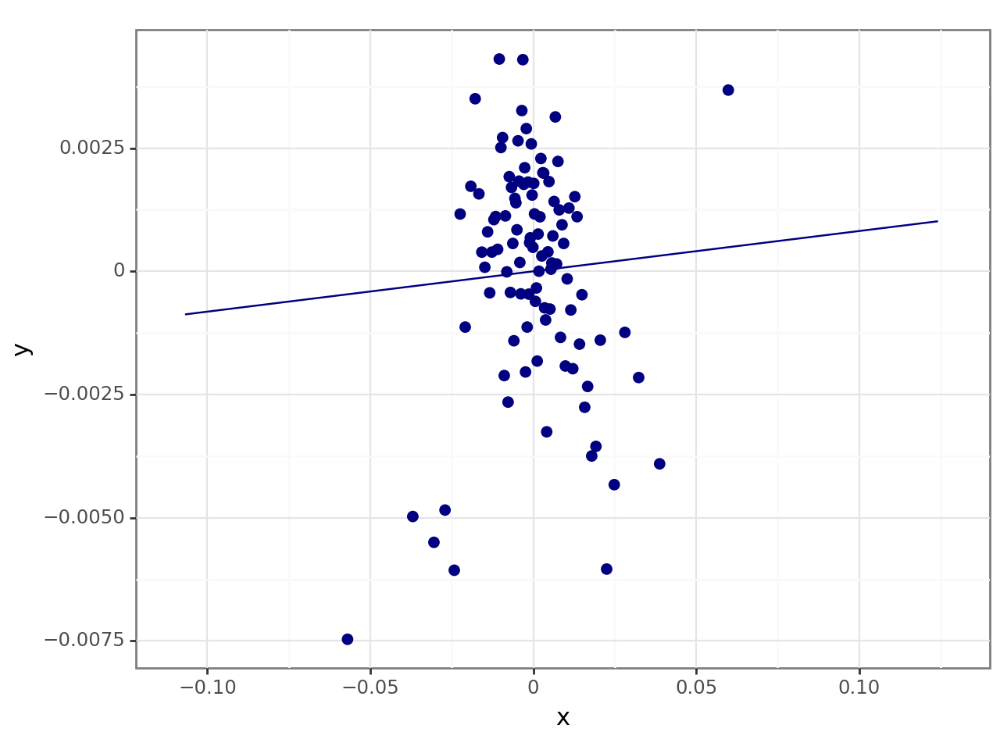


wage_shock_j_l


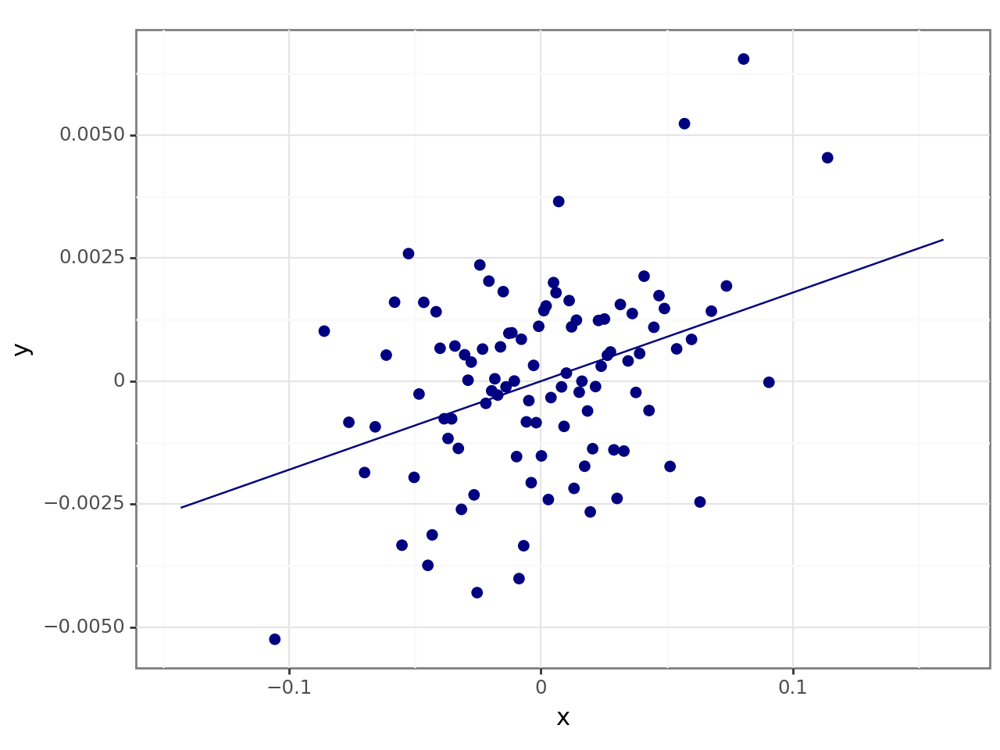


wage_shock_j_l2


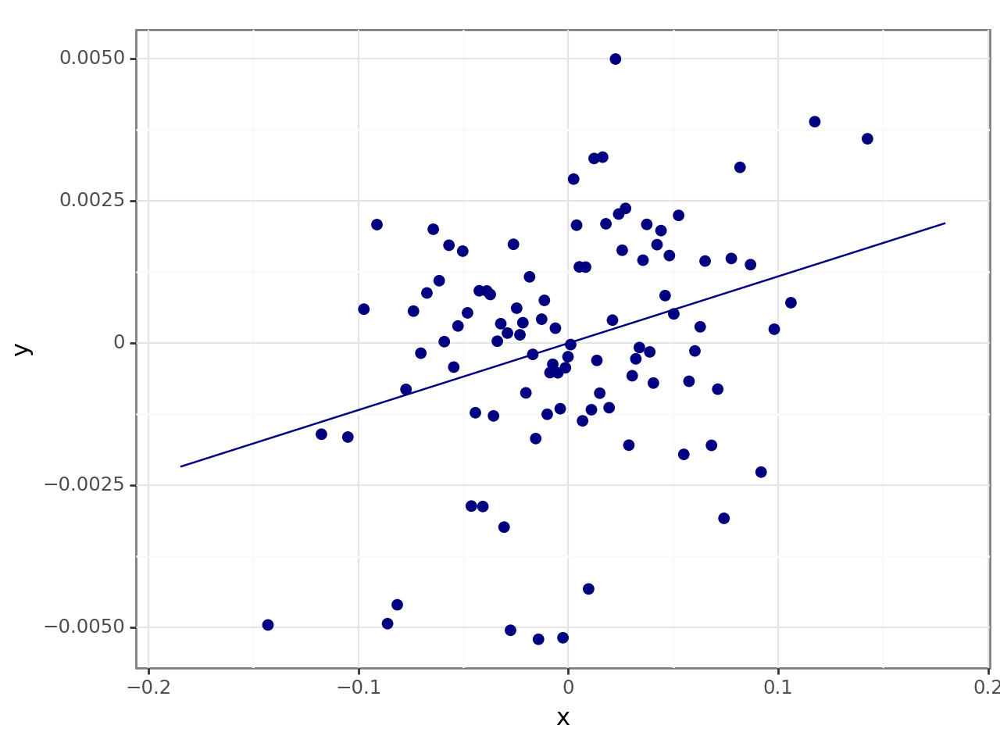


BMI


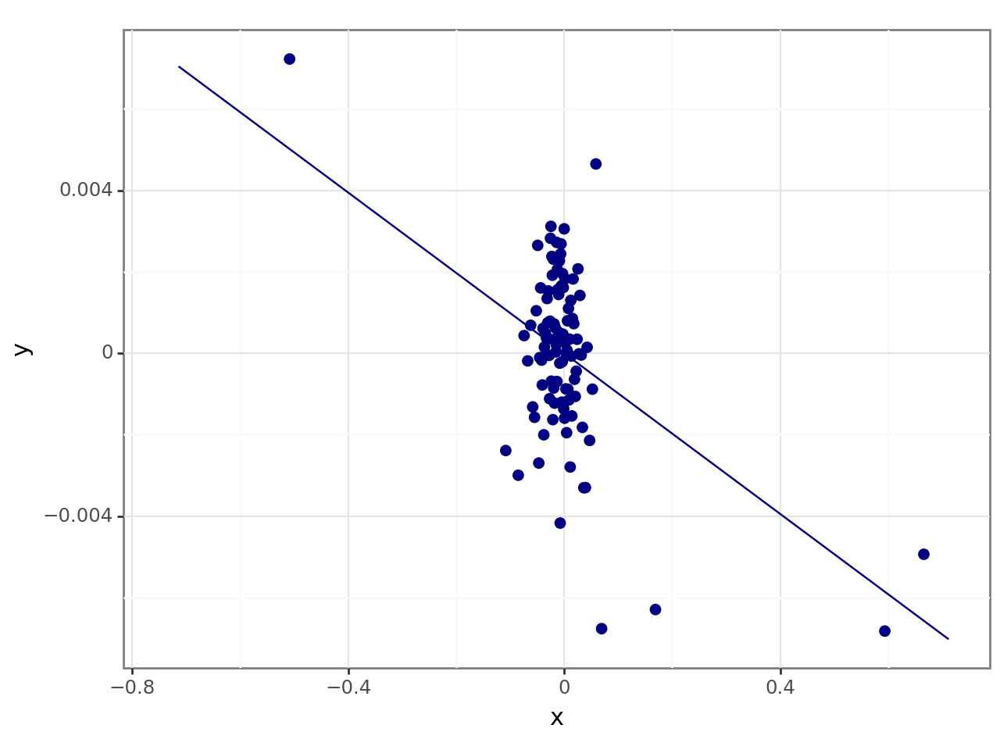


BMI_l


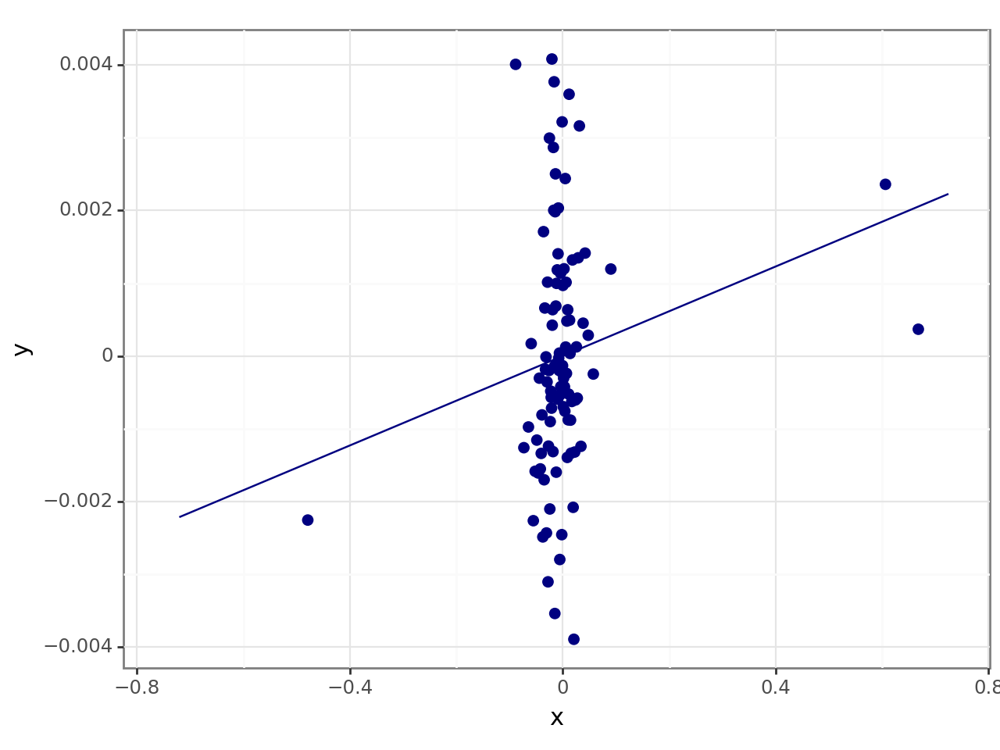


BMI_l2


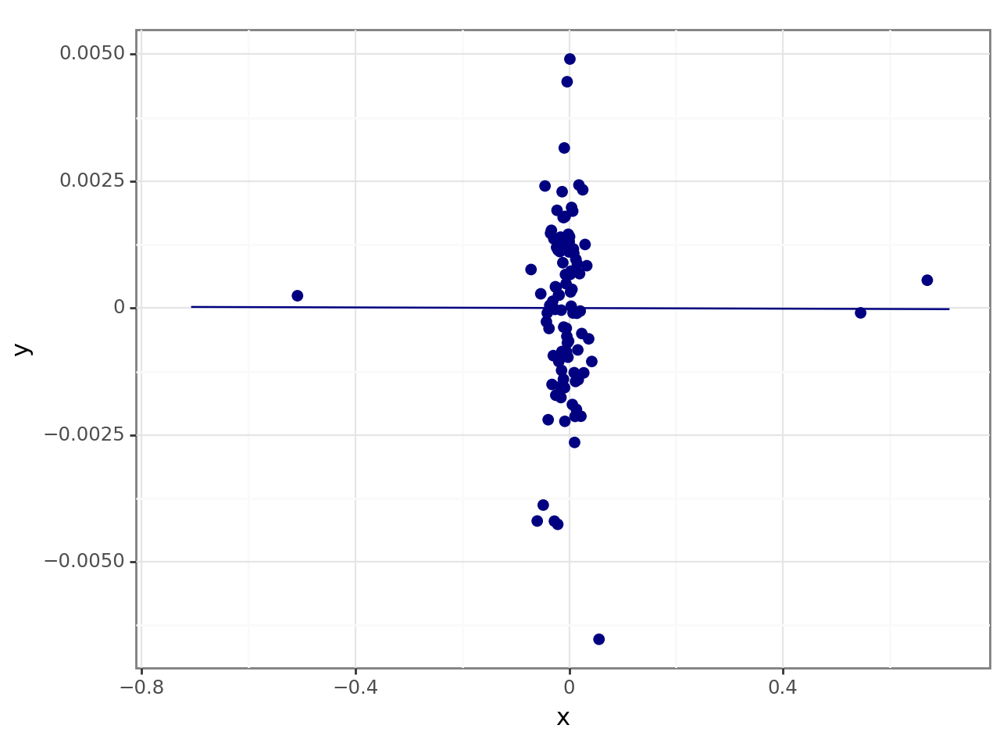


BMI_j


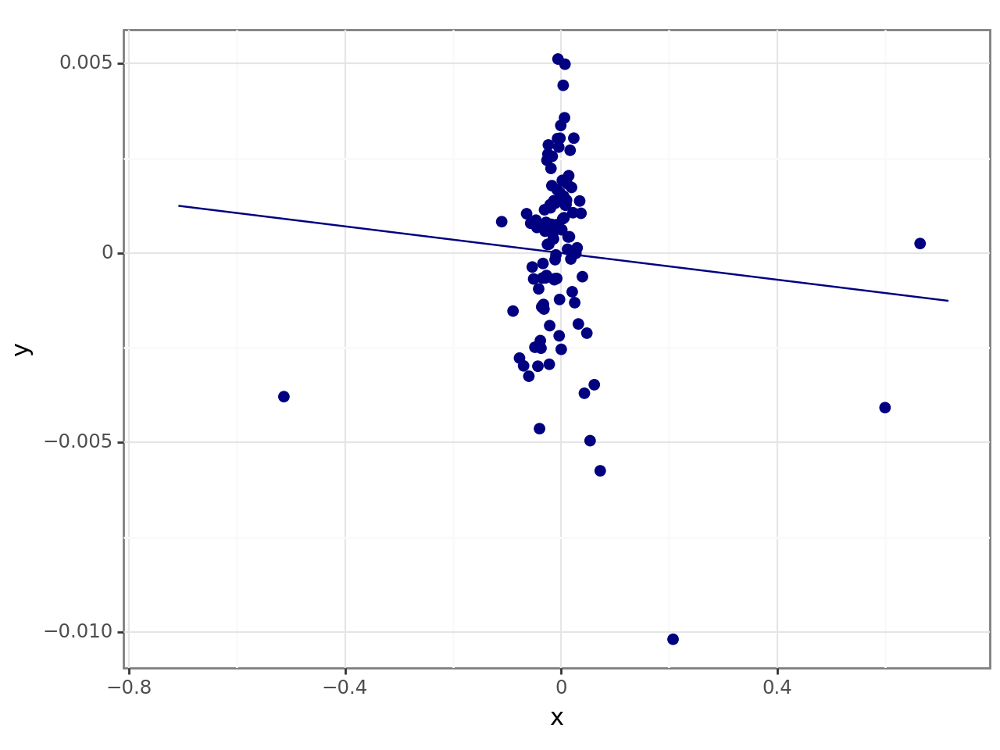


BMI_j_l


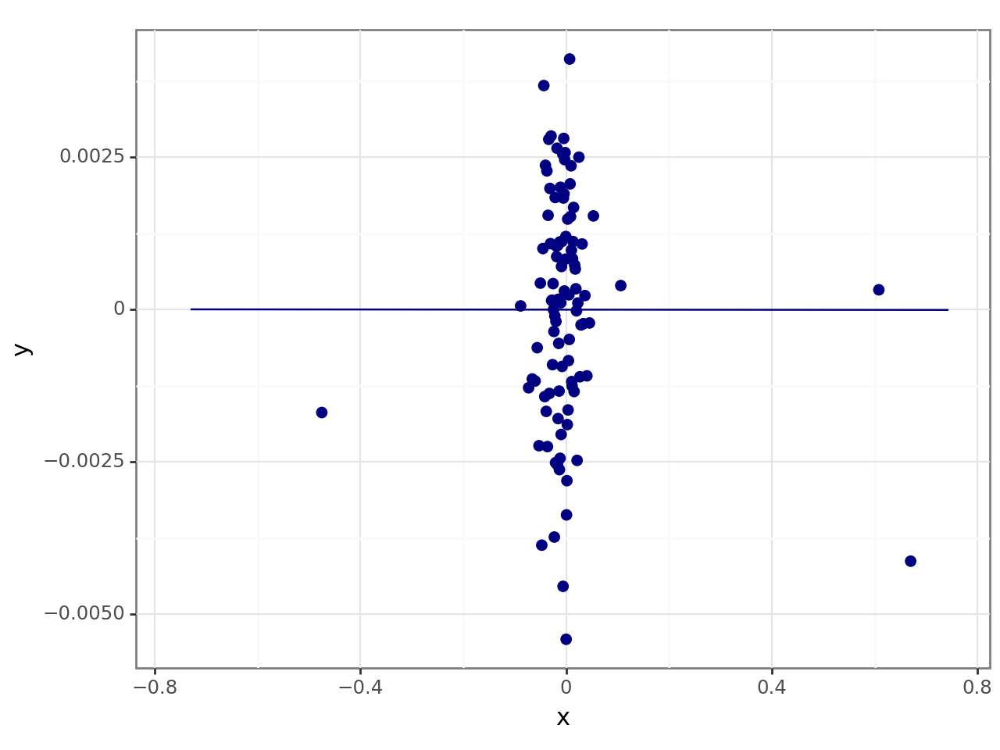


BMI_j_l2


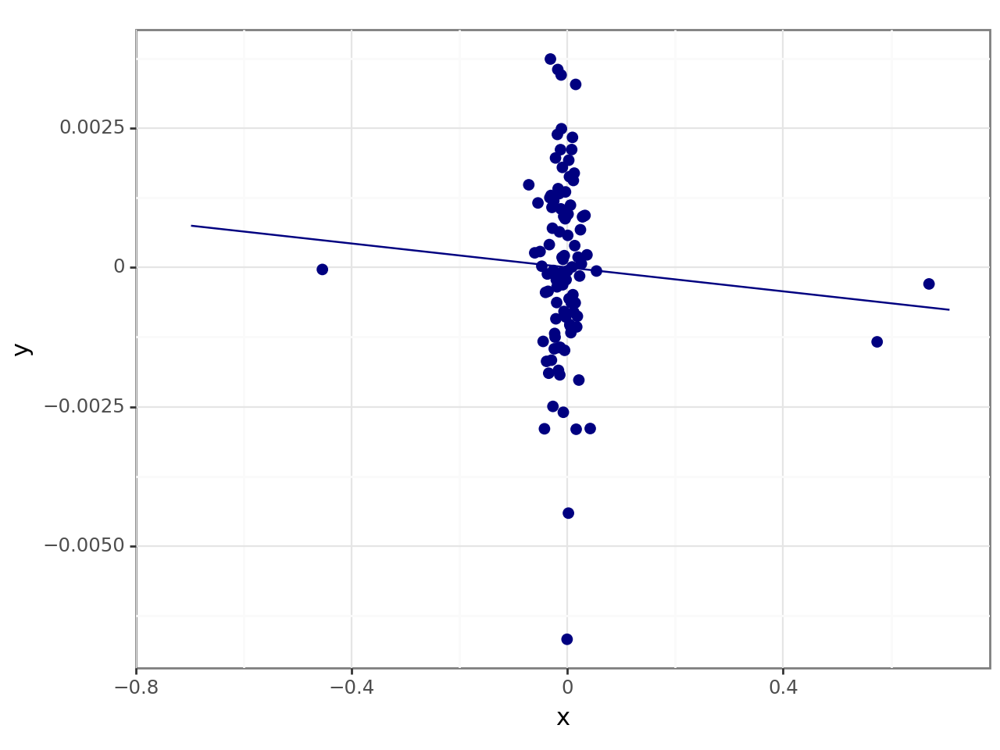


delta_log_wealth_l


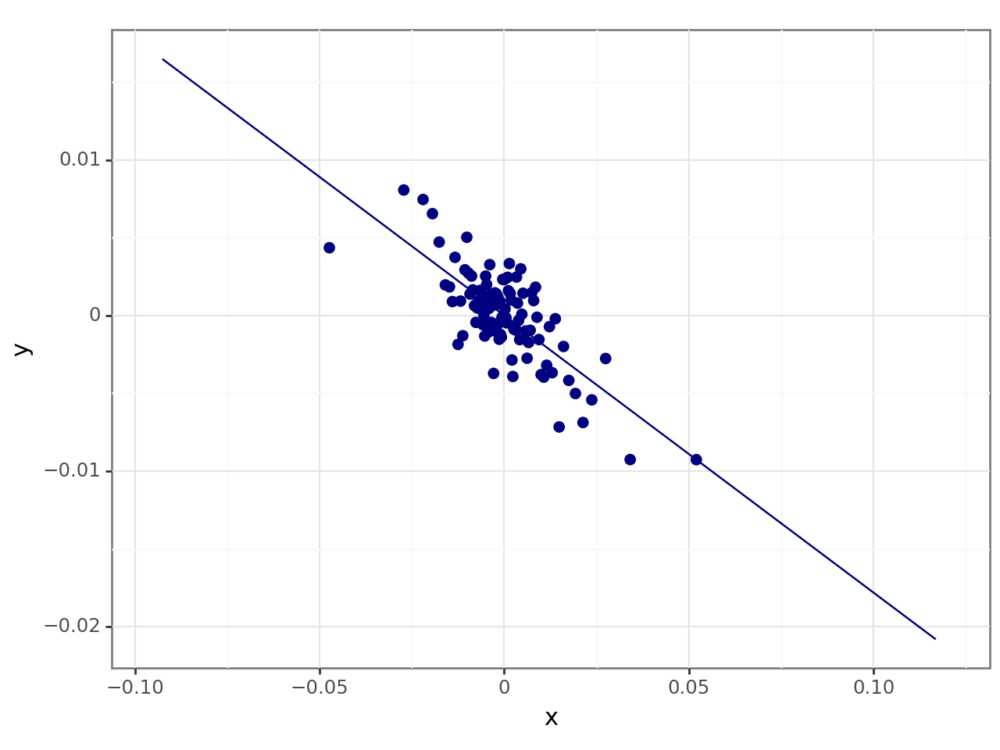


delta_log_wealth_l2


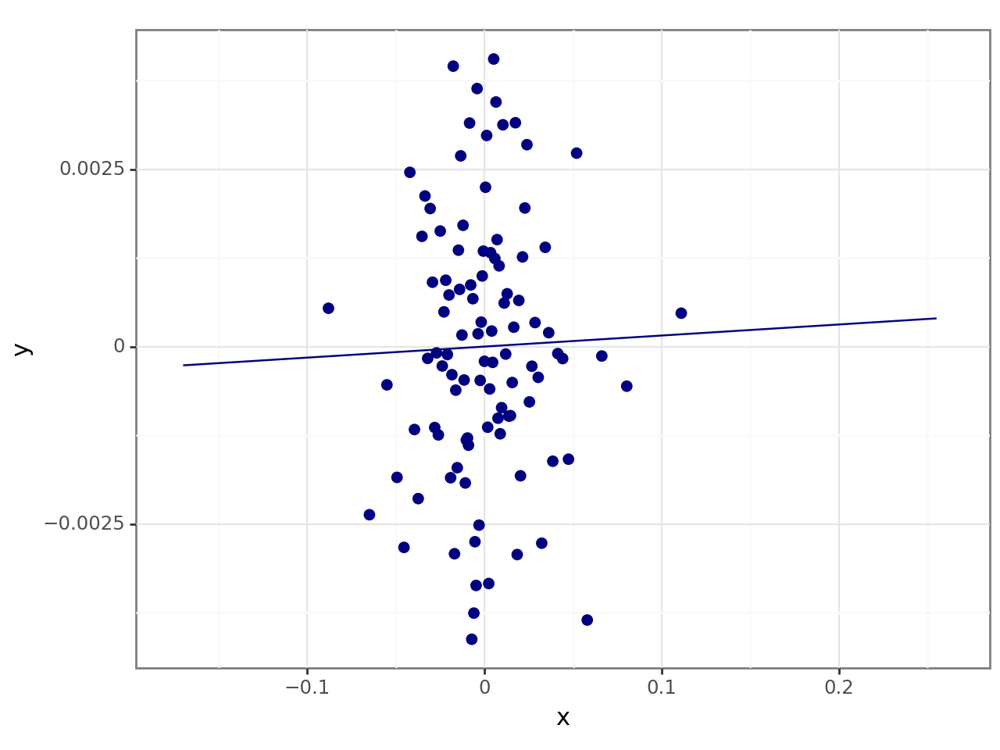

In [8]:
#HVORDAN SER DETTE UD MED MERE DETALJERER SHADOW?

#HOURS, final regression 
gender = "w"
#Find the gender and the gender of the spouse
if gender == "w":
    spouse = "m"
elif gender =='m':
    spouse = "w"

  
data['wage_shock']=data[f'omega_res_{gender}']
data['wage_shock_l']=data[f'omega_res_{gender}_l']
data['wage_shock_l2']=data[f'omega_res_{gender}_l2']
data['wage_shock_j']=data[f'omega_res_{spouse}']
data['wage_shock_j_l']=data[f'omega_res_{spouse}_l']
data['wage_shock_j_l2']=data[f'omega_res_{spouse}_l2']
    

  
data['BMI'] = data[f'delta_log_BMI_{gender}']
data['BMI_l'] = data[f'delta_log_BMI_{gender}_l']
data['BMI_l2'] = data[f'delta_log_BMI_{gender}_l2']
data['BMI_j'] = data[f'delta_log_BMI_{spouse}']
data['BMI_j_l'] = data[f'delta_log_BMI_{spouse}_l']
data['BMI_j_l2'] = data[f'delta_log_BMI_{spouse}_l2']




data_regress = data[['t',f'inc_share_{spouse}_l',f'delta_log_earnings_{spouse}','init_barg','log_earnings_w', 'log_earnings_m','log_earnings_w_l', 'log_earnings_m_l', 'inc_share_w', 'inc_share_w_l','log_wealth', 'wealth_F',  f'y_{gender}', 'idx', 'wage_shock','wage_shock_l','wage_shock_l2','wage_shock_j','wage_shock_j_l','wage_shock_j_l2','BMI','BMI_l','BMI_l2','BMI_j','BMI_j_l','BMI_j_l2',f'control_part_inc_{gender}','control_cons','delta_log_wealth','delta_log_wealth_l','delta_log_wealth_l2','delta_log_Love','delta_log_Love_l','delta_log_Love_l2','delta_log_fam_inc', 'log_fam_inc' , 'log_fam_inc_l', 'log_fam_inc_l2', 'log_wealth_l', 'log_wealth_l2']]

#DROP NAN
data_regress = data_regress.dropna() # det ser ud som om den ikke fjerner nogen

#PREPARE T
X_t=pd.get_dummies(data_regress[['t', 'init_barg']], columns = ['t','init_barg'], prefix = ['D_t','D_init_barg'], dtype = float) 
#X_t=pd.get_dummies(data['t''init_barg'], columns = ['t'], prefix = 'D_t', dtype = float, drop_first=True,  ) 
X_t = X_t.drop(columns = ['D_t_13','D_init_barg_1']) #drop reference cat

#consumption
cons = data_regress[['control_cons']]

#earnings_inc

inc_share = data_regress[[f'control_part_inc_{gender}']]


#SHADOW VALUE: 

Shadow_value = data_regress[['t']]
cat = ['delta_log_fam_inc', 'delta_log_wealth', 'log_fam_inc_l', 'log_wealth_l']
    
for i in cat:
    Shadow_value[i] = pd.qcut(data_regress[i], 50, labels = False, duplicates='raise') 

Shadow_value = pd.get_dummies(Shadow_value, columns=['delta_log_fam_inc', 'delta_log_wealth', 'log_fam_inc_l', 'log_wealth_l' ], drop_first = True, dtype = float)


#Drop if less than two
Shadow_value = Shadow_value.loc[:,(Shadow_value.sum()>2 )]
Shadow_value = Shadow_value.drop(columns = ['t'])

 
df = data_regress.drop(columns = ['t','init_barg',f'inc_share_{spouse}_l','control_cons', f'control_part_inc_{gender}', f'delta_log_earnings_{spouse}', 'log_earnings_w', 'log_fam_inc' , 'log_earnings_m','log_earnings_w_l', 'log_earnings_m_l', 'inc_share_w', 'inc_share_w_l','log_wealth', 'wealth_F',  f'y_{gender}', 'idx','delta_log_fam_inc', 'log_fam_inc_l', 'log_wealth_l', 'log_fam_inc_l2', 'log_wealth_l2', 'delta_log_wealth'])
    

#df = df.drop(columns = ['wage_shock_j_l2','wage_shock_l2','BMI_l2','BMI_j_l2','delta_log_wealth_l2'])
    
df = df.drop(columns = ['delta_log_Love','delta_log_Love_l','delta_log_Love_l2'])
    

#REGRESS
y  = data_regress[f'y_{gender}']
x1 = pd.concat([df,  X_t , Shadow_value, inc_share, cons], axis=1 )
#x = x.T.drop_duplicates().T #drop duplicates
x1 = sm.add_constant(x1)  
#result = sm.OLS(y,x).fit() 

result2 = sm.OLS(y,x1).fit()
print(result2.summary())
res = result2.resid
predict = result2.predict()
data_regress['res'] = res
data_regress['predict'] = predict

print('residual plot')
plt.scatter(predict,res)
plt.ylabel("Residual Delta log mu")
plt.xlabel(f'Predicted value Delta log mu')

#plt.savefig(f'output/barg_res_predict_plot{model_name}_{gender}.png')
plt.show()
joint_plot = sns.jointplot(data_regress, x=predict, y=res)
est = binsreg(res,predict, nbins=100,polyreg=1, noplot=False) 


#print('res against y')
#plt.scatter(data_regress[['delta_log_barganing']],res)
#plt.show()

list = [f'control_part_inc_{gender}','control_cons' , 'wage_shock','wage_shock_l','wage_shock_l2','wage_shock_j','wage_shock_j_l','wage_shock_j_l2','BMI','BMI_l','BMI_l2','BMI_j','BMI_j_l','BMI_j_l2','delta_log_wealth_l','delta_log_wealth_l2']

for i in list:

    data_regress[f'b_{i}'] = params[f'{i}']*x1[f'{i}']
    data_regress[f'var_c_{i}'] = data_regress['predict']-data_regress[f'b_{i}'] 



for i in list :
    


    xlabel = f'{i}'
    if i == "wage_shock":
        xlabel = "Shock to wage"
    elif i == "wage_shock_j":
        xlabel = "Shock to partners wage"
    elif i == "delta_log_barganing_l":
        xlabel = "Change in barganing weigth, lag"

    data_regress_neg = data_regress[data_regress[f'{i}']<0]
    data_regress_pos = data_regress[data_regress[f'{i}']>0]
    x = x1
    y2 = x[f'{i}']
    x = x.drop(columns = [f'{i}'])
    
    #x = x.drop(columns = list_drop)
    #x = x.T.drop_duplicates().T #drop duplicates
    x = sm.add_constant(x)  
    
    result= sm.OLS(y,x).fit()
    res_y = result.resid
    data_regress[f'res_y'] = res_y
    
    result= sm.OLS(y2,x).fit()
    res_x = result.resid
    #data_regress[[f'res_x']]=res_x


    
    #joint_plot = sns.jointplot(data_regress, x='res_x', y='res_y')
    print(f'{i}')
    est = binsreg(res_y,res_x, nbins=100,polyreg=1, noplot=False) 
   


C:\Users\czk481\AppData\Local\Temp\2\ipykernel_11100\1369775352.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\czk481\AppData\Local\Temp\2\ipykernel_11100\1369775352.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\czk481\AppData\Local\Temp\2\ipykernel_11100\1369775352.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.or

                            OLS Regression Results                            
Dep. Variable:                    y_w   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.941
Method:                 Least Squares   F-statistic:                     482.7
Date:                Sun, 19 May 2024   Prob (F-statistic):               0.00
Time:                        13:30:03   Log-Likelihood:                 25236.
No. Observations:                9568   AIC:                        -4.984e+04
Df Residuals:                    9251   BIC:                        -4.757e+04
Df Model:                         316                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.08

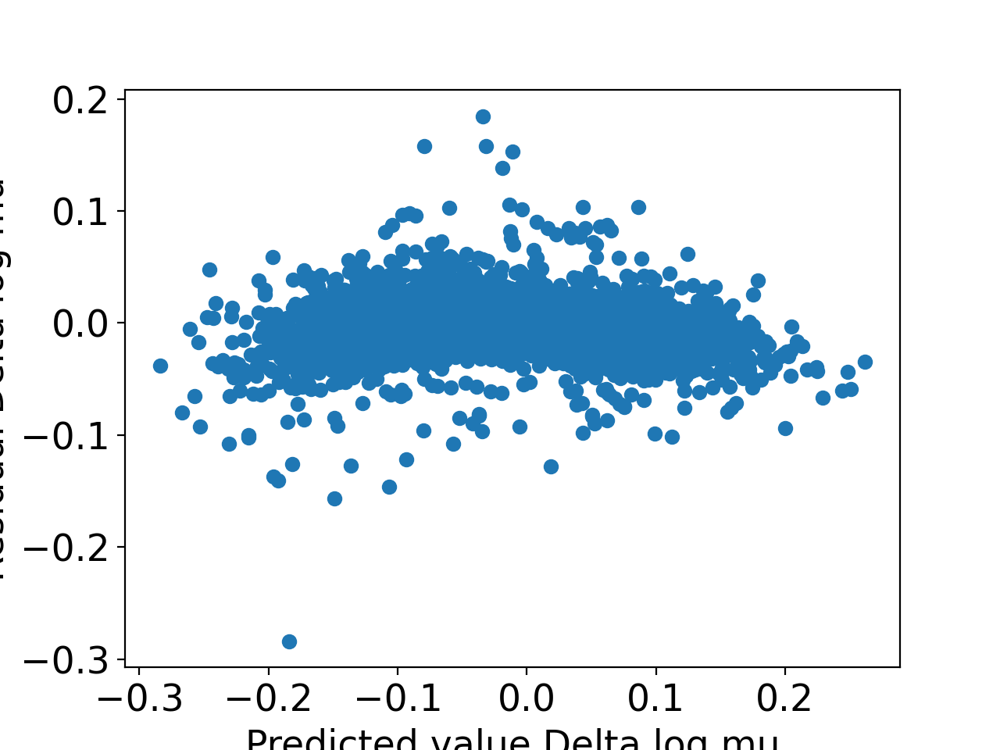

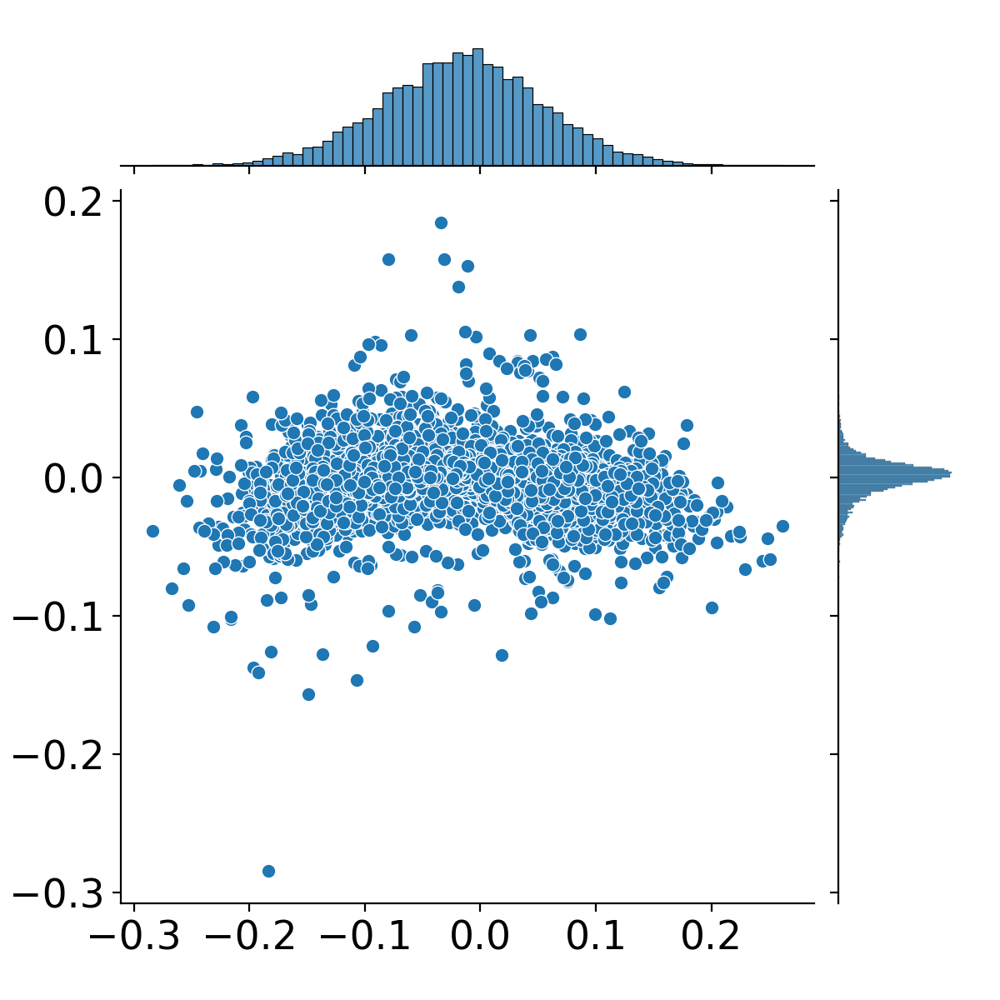

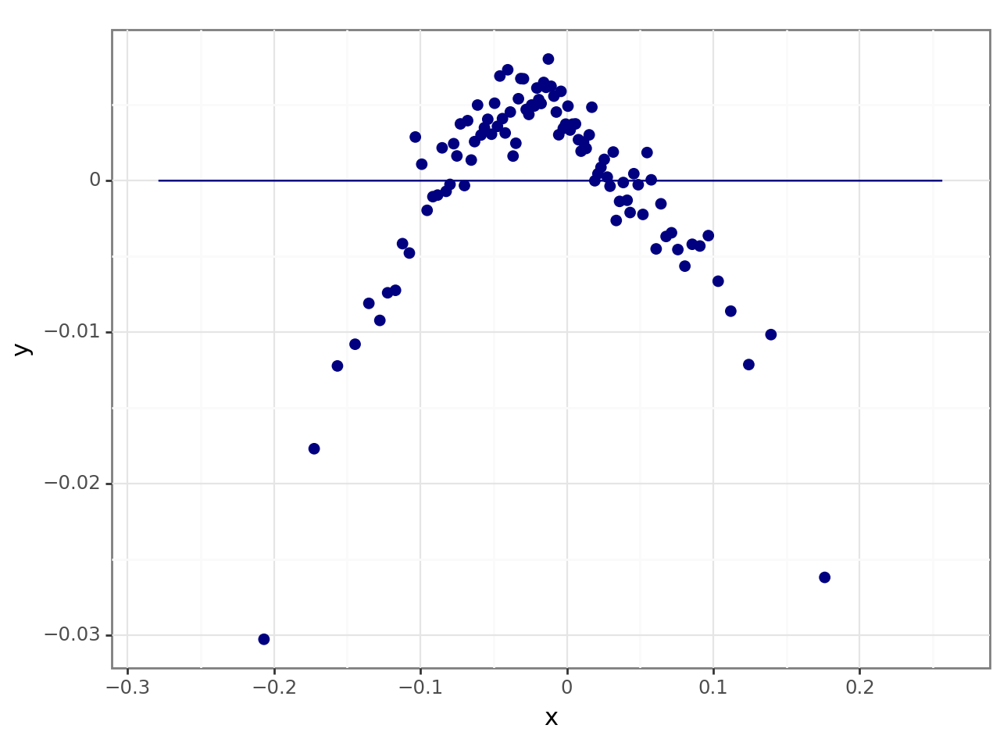


wage_shock


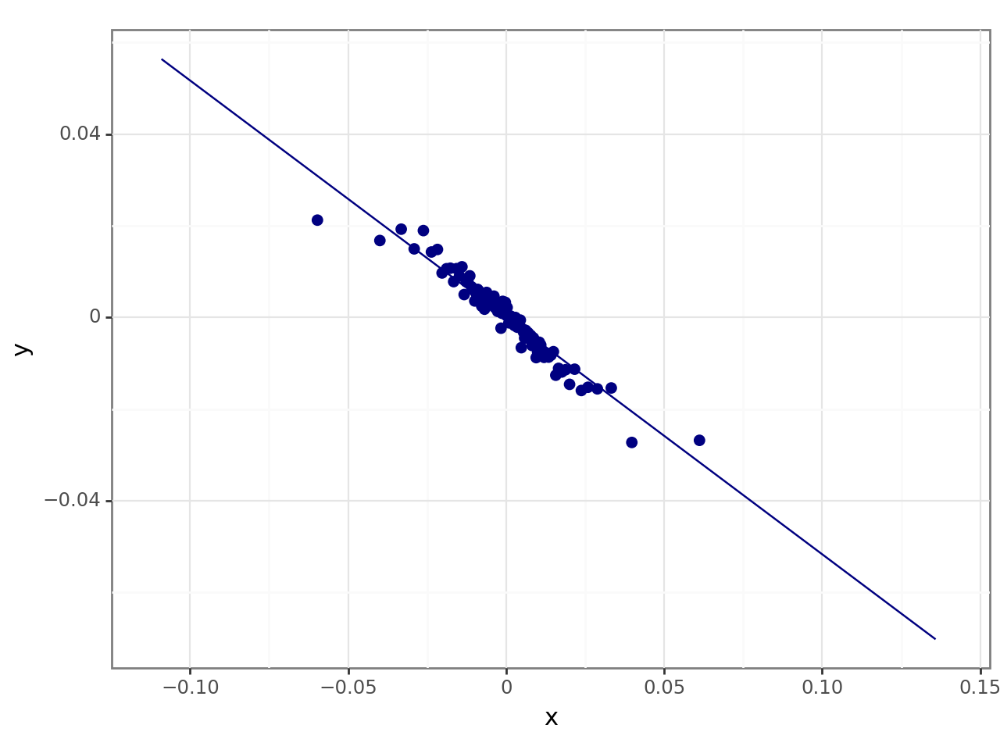


wage_shock_l


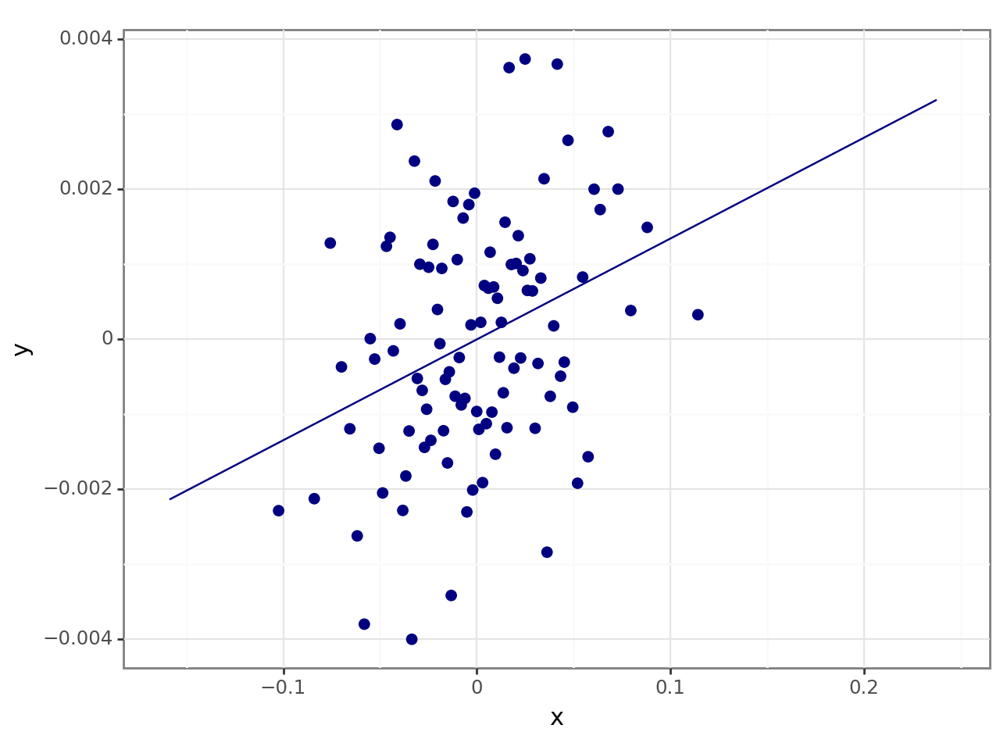


wage_shock_l2


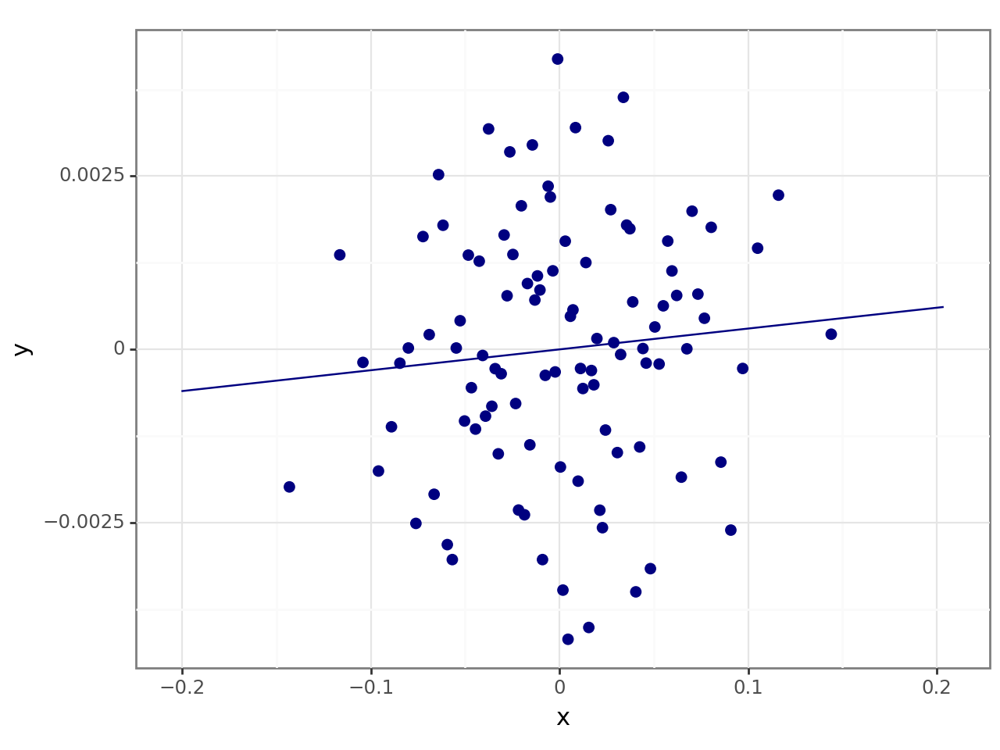


wage_shock_j


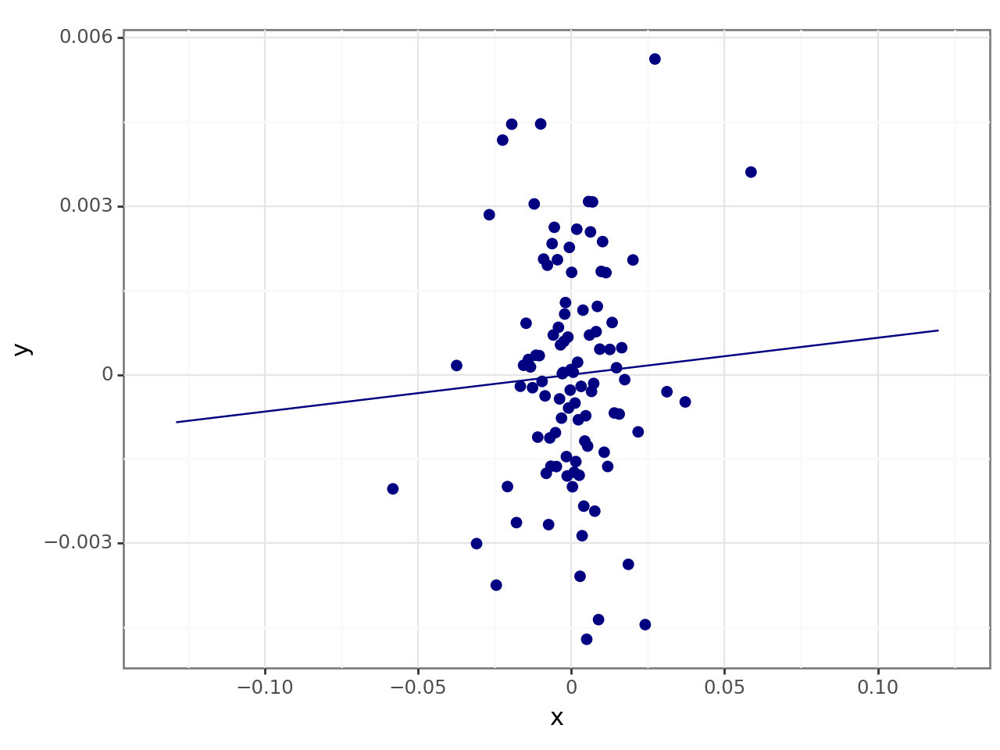


wage_shock_j_l


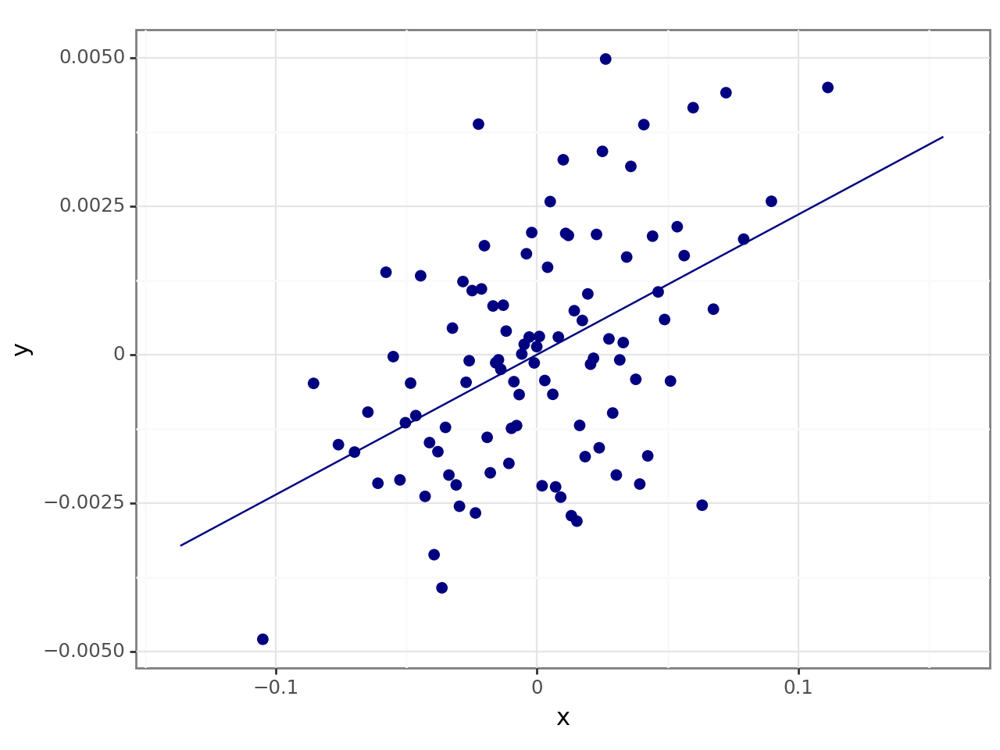


wage_shock_j_l2


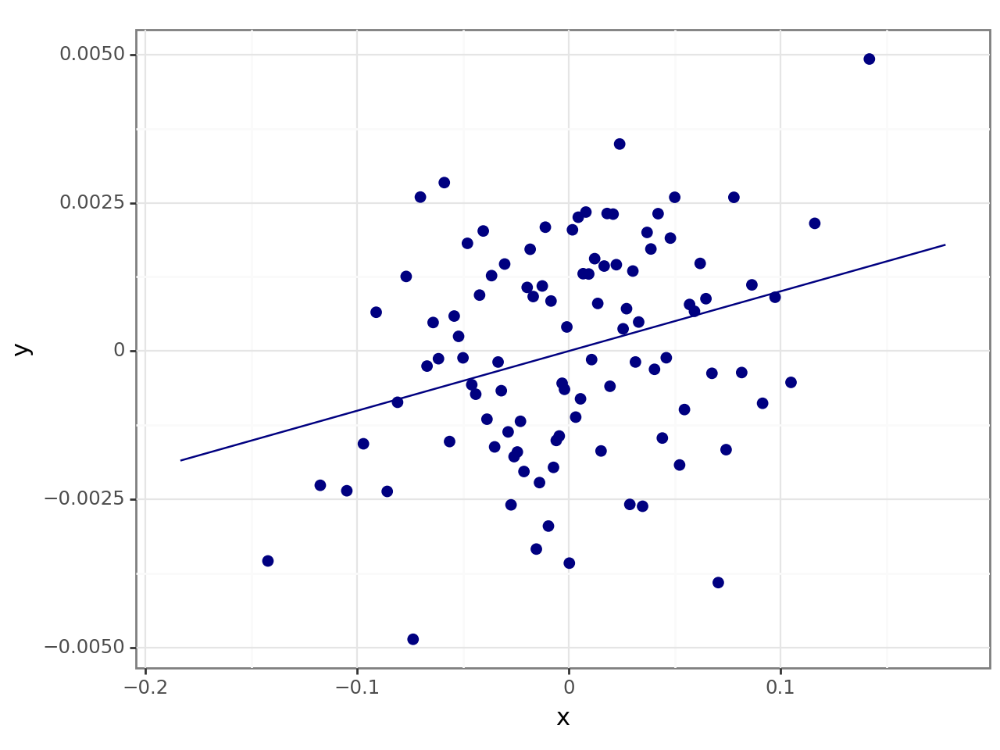


BMI


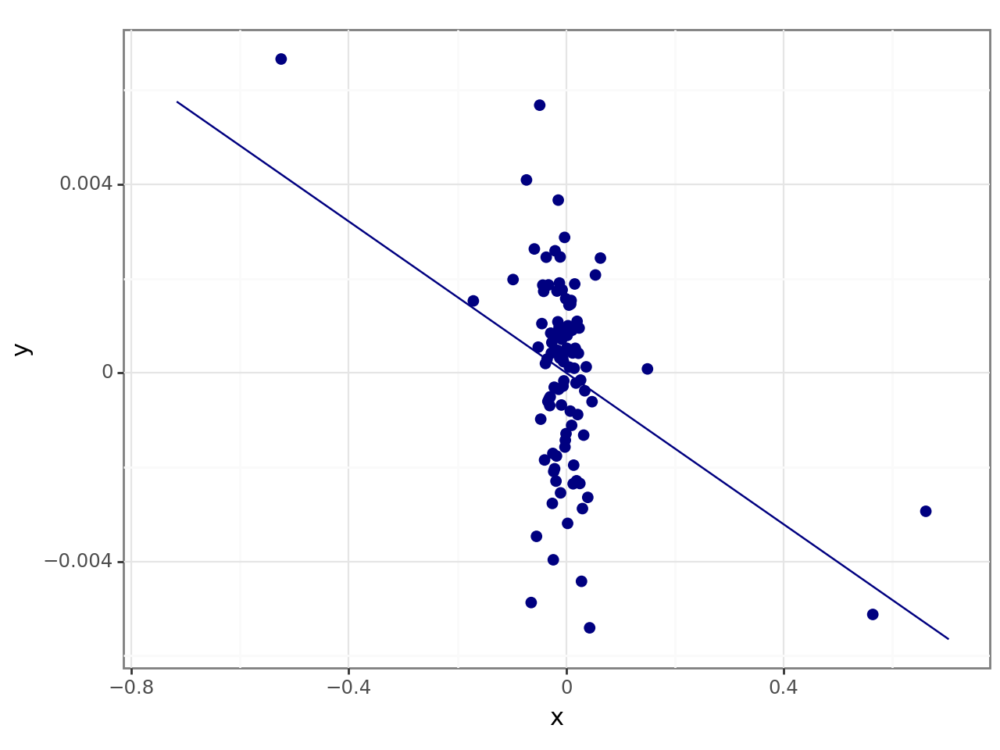


BMI_l


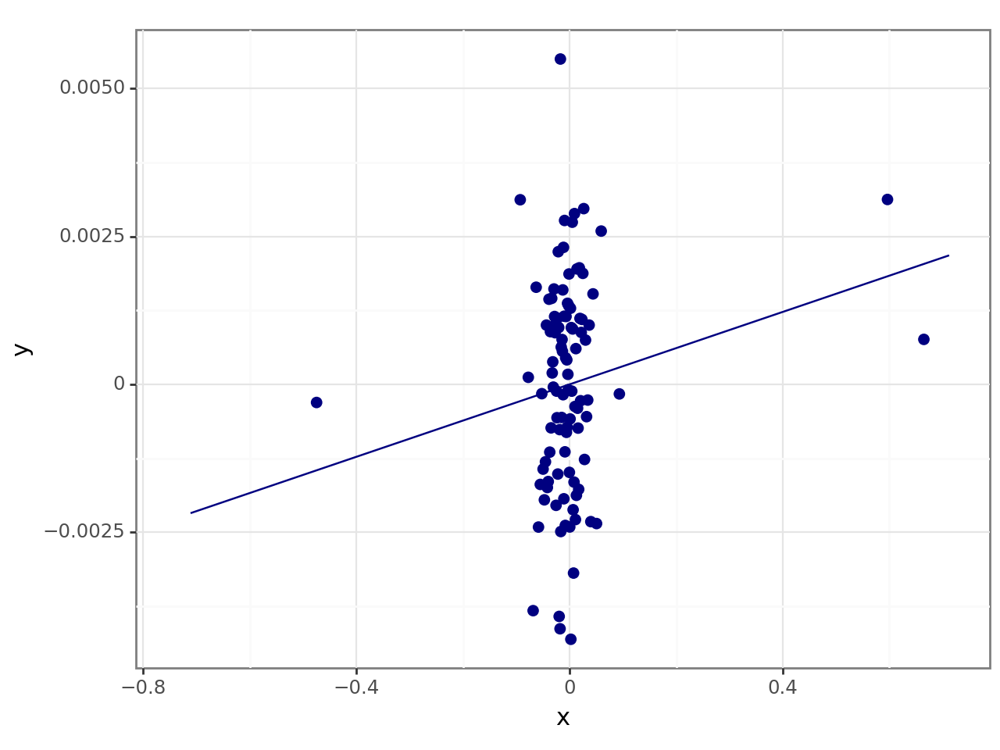


BMI_l2


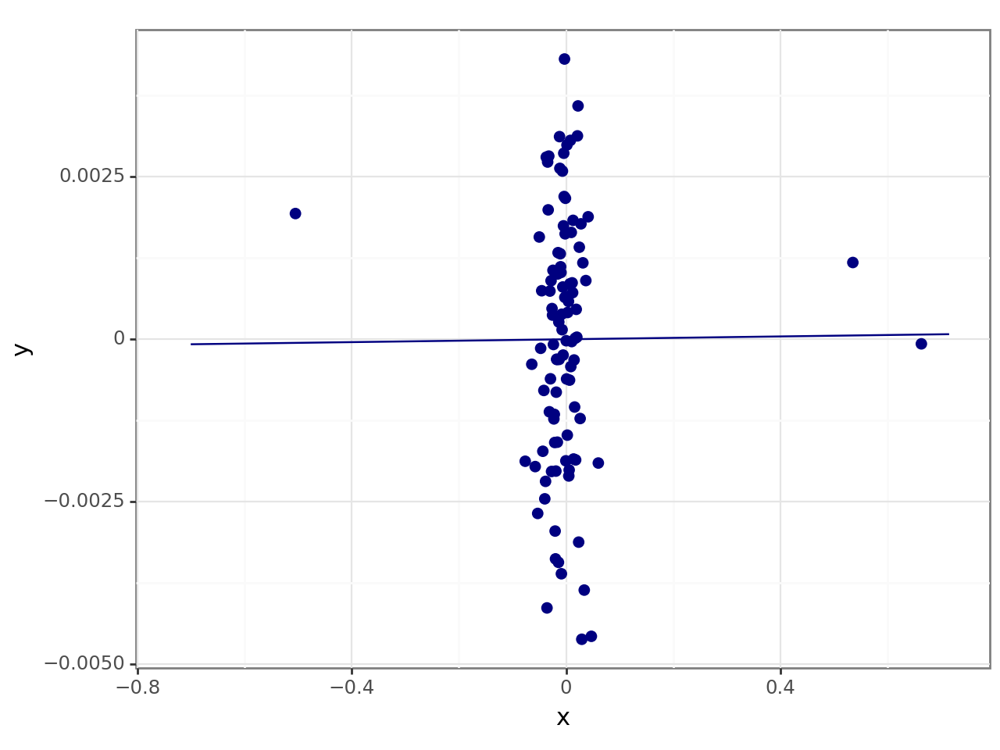


BMI_j


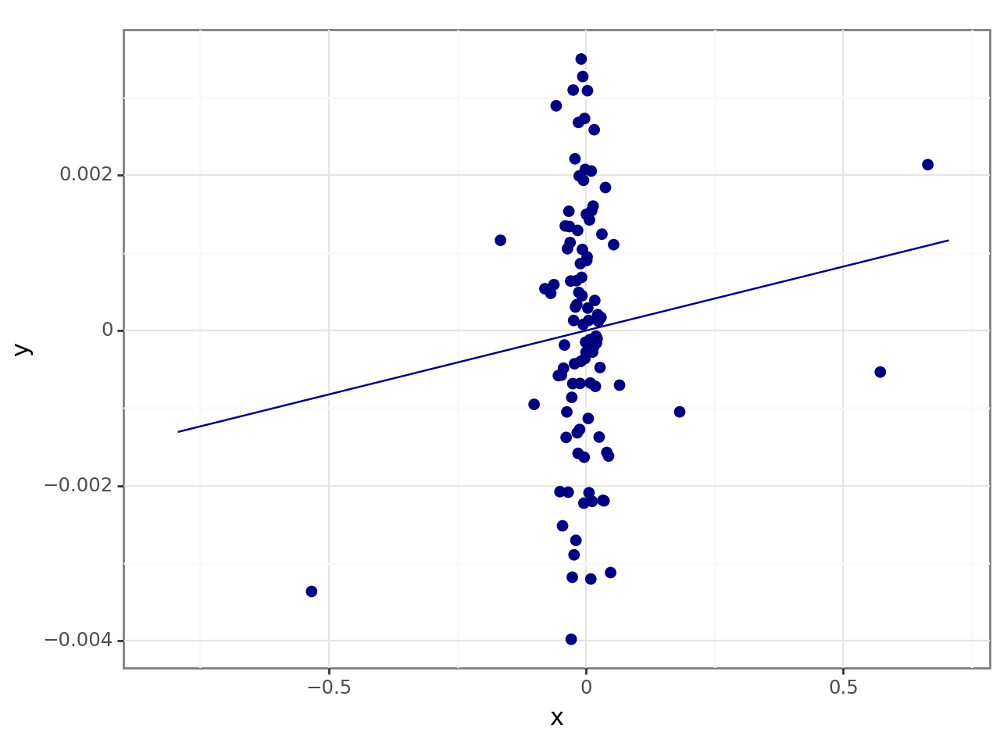


BMI_j_l


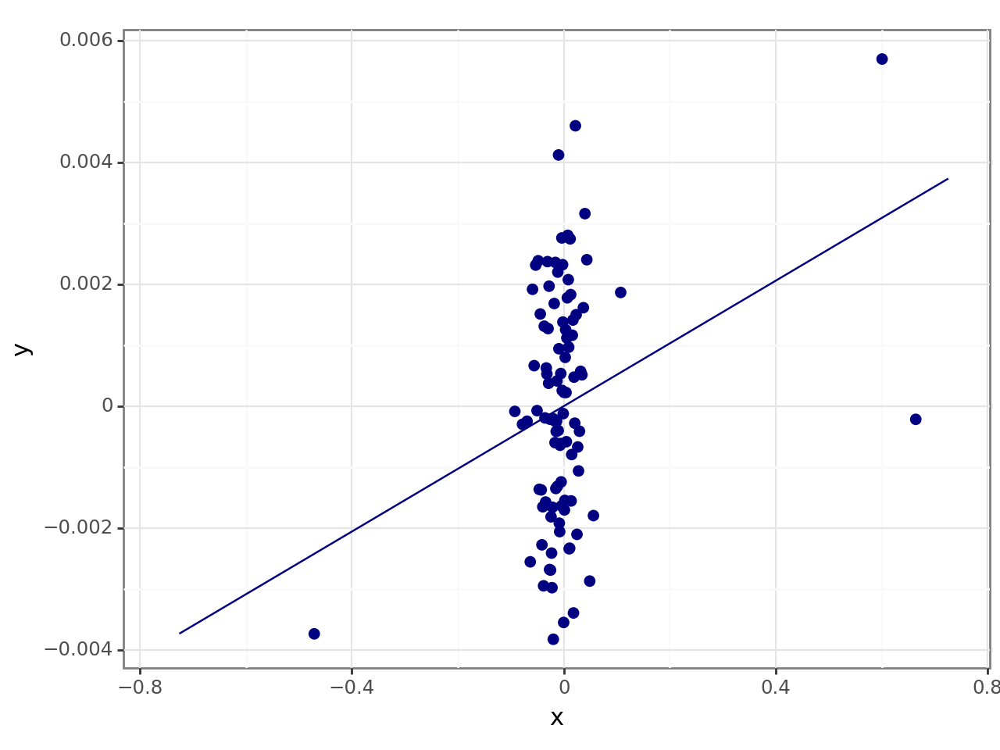


BMI_j_l2


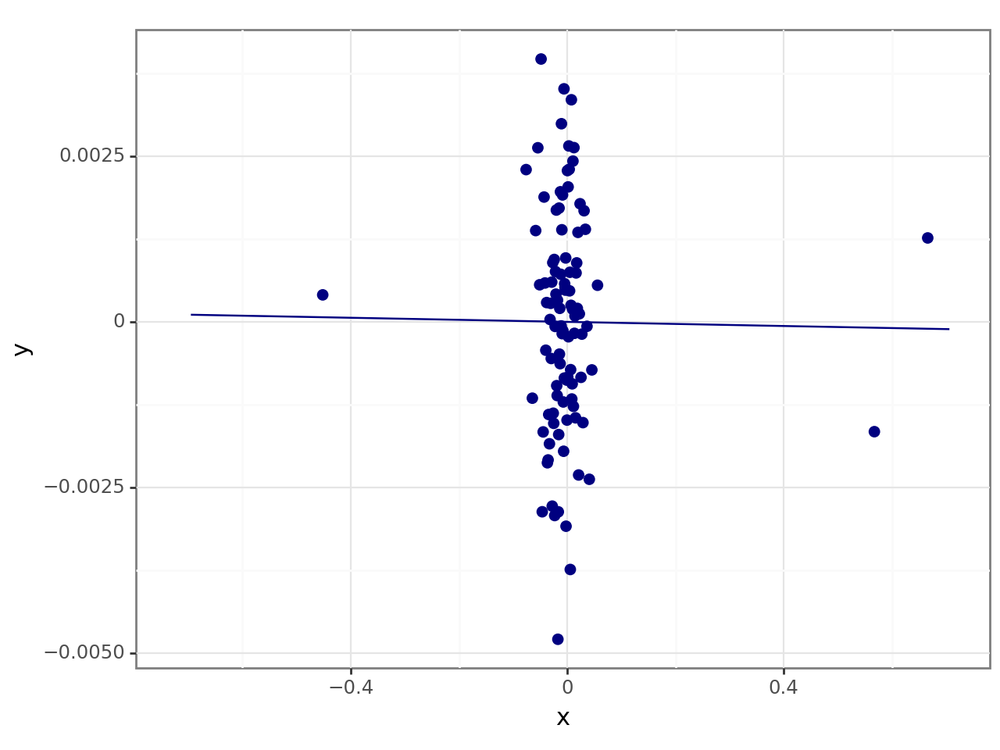


delta_log_wealth_l


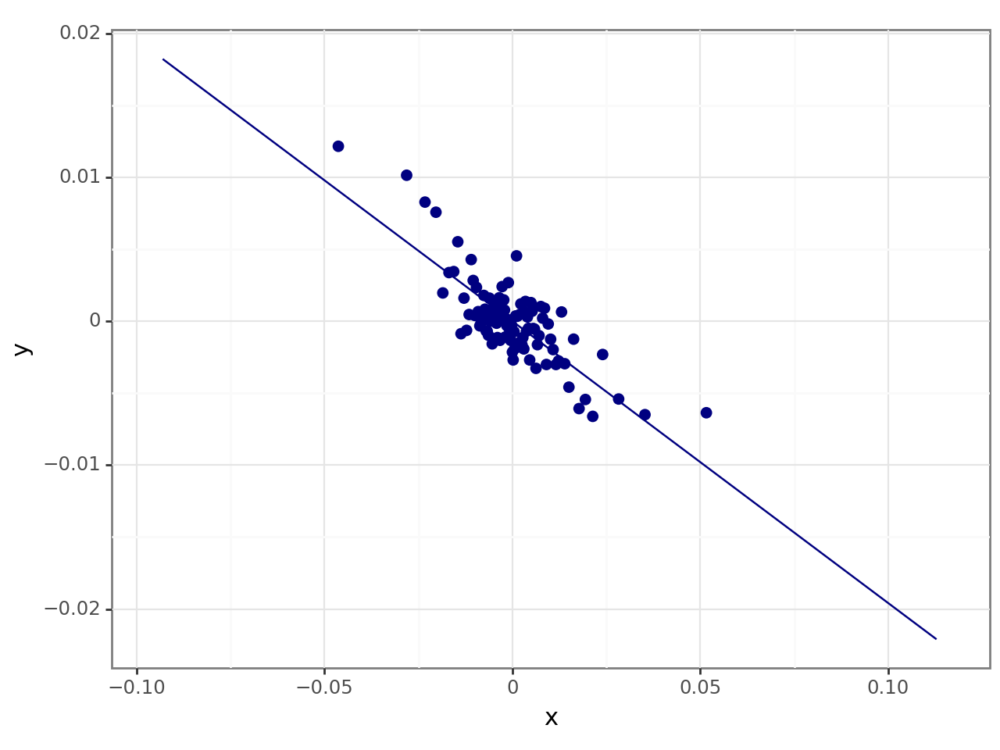


delta_log_wealth_l2


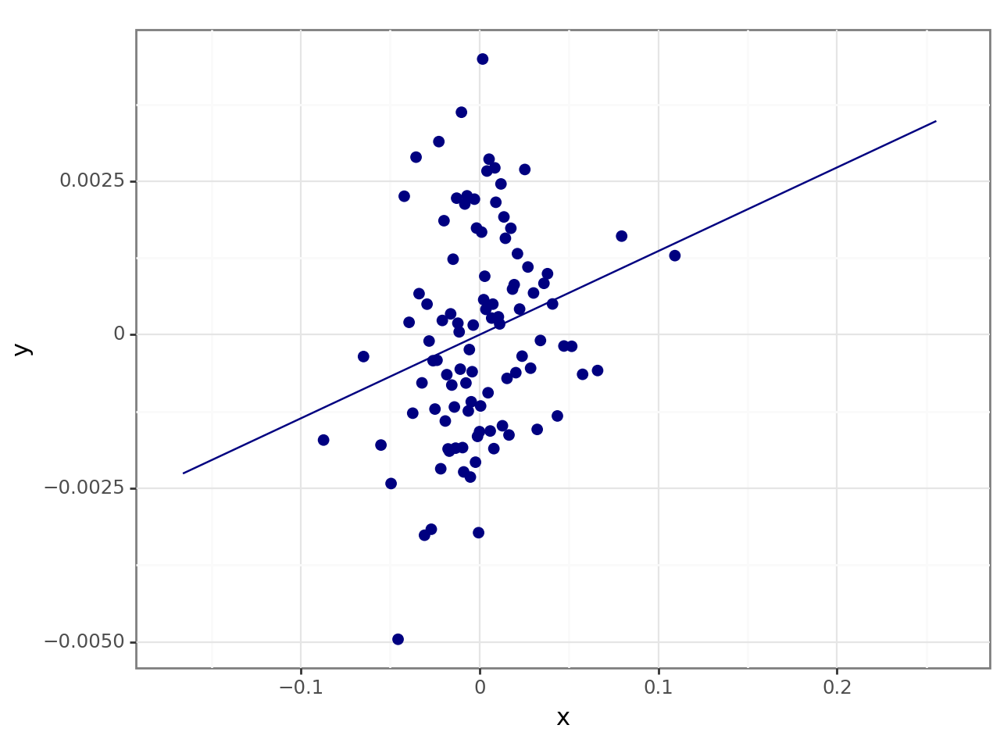

In [9]:
#HVORDAN SER DETTE UD MED MERE DETALJERER SHADOW+ detalheret incshare+detaljeret cons?

#HOURS, final regression 
gender = "w"
#Find the gender and the gender of the spouse
if gender == "w":
    spouse = "m"
elif gender =='m':
    spouse = "w"

  
data['wage_shock']=data[f'omega_res_{gender}']
data['wage_shock_l']=data[f'omega_res_{gender}_l']
data['wage_shock_l2']=data[f'omega_res_{gender}_l2']
data['wage_shock_j']=data[f'omega_res_{spouse}']
data['wage_shock_j_l']=data[f'omega_res_{spouse}_l']
data['wage_shock_j_l2']=data[f'omega_res_{spouse}_l2']
    

  
data['BMI'] = data[f'delta_log_BMI_{gender}']
data['BMI_l'] = data[f'delta_log_BMI_{gender}_l']
data['BMI_l2'] = data[f'delta_log_BMI_{gender}_l2']
data['BMI_j'] = data[f'delta_log_BMI_{spouse}']
data['BMI_j_l'] = data[f'delta_log_BMI_{spouse}_l']
data['BMI_j_l2'] = data[f'delta_log_BMI_{spouse}_l2']




data_regress = data[['t',f'inc_share_{spouse}_l',f'delta_log_earnings_{spouse}','init_barg','log_earnings_w', 'log_earnings_m','log_earnings_w_l', 'log_earnings_m_l', 'inc_share_w', 'inc_share_w_l','log_wealth', 'wealth_F',  f'y_{gender}', 'idx', 'wage_shock','wage_shock_l','wage_shock_l2','wage_shock_j','wage_shock_j_l','wage_shock_j_l2','BMI','BMI_l','BMI_l2','BMI_j','BMI_j_l','BMI_j_l2',f'control_part_inc_{gender}','control_cons','delta_log_wealth','delta_log_wealth_l','delta_log_wealth_l2','delta_log_Love','delta_log_Love_l','delta_log_Love_l2','delta_log_fam_inc', 'log_fam_inc' , 'log_fam_inc_l', 'log_fam_inc_l2', 'log_wealth_l', 'log_wealth_l2']]

#DROP NAN
data_regress = data_regress.dropna() # det ser ud som om den ikke fjerner nogen

#PREPARE T
X_t=pd.get_dummies(data_regress[['t', 'init_barg']], columns = ['t','init_barg'], prefix = ['D_t','D_init_barg'], dtype = float) 
#X_t=pd.get_dummies(data['t''init_barg'], columns = ['t'], prefix = 'D_t', dtype = float, drop_first=True,  ) 
X_t = X_t.drop(columns = ['D_t_13','D_init_barg_1']) #drop reference cat

#consumption
cons = data_regress['control_cons']


#earnings_inc
inc_share = data_regress[['t']]
cat = [f'control_part_inc_{gender}',]
    
for i in cat:
    inc_share[i] = pd.qcut(data_regress[i], 50, labels = False, duplicates='raise') 

inc_share = pd.get_dummies(inc_share, columns=[f'control_part_inc_{gender}' ], drop_first = True, dtype = float)


#Drop if less than two
inc_share = inc_share.loc[:,(inc_share.sum()>2 )]
inc_share = inc_share.drop(columns = ['t'])


#SHADOW VALUE: 
Shadow_value = data_regress[['t']]
cat = ['delta_log_fam_inc', 'delta_log_wealth', 'log_fam_inc_l', 'log_wealth_l']
    
for i in cat:
    Shadow_value[i] = pd.qcut(data_regress[i], 50, labels = False, duplicates='raise') 

Shadow_value = pd.get_dummies(Shadow_value, columns=['delta_log_fam_inc', 'delta_log_wealth', 'log_fam_inc_l', 'log_wealth_l' ], drop_first = True, dtype = float)


#Drop if less than two
Shadow_value = Shadow_value.loc[:,(Shadow_value.sum()>2 )]
Shadow_value = Shadow_value.drop(columns = ['t'])

 
df = data_regress.drop(columns = ['t','init_barg',f'inc_share_{spouse}_l','control_cons', f'control_part_inc_{gender}', f'delta_log_earnings_{spouse}', 'log_earnings_w', 'log_fam_inc' , 'log_earnings_m','log_earnings_w_l', 'log_earnings_m_l', 'inc_share_w', 'inc_share_w_l','log_wealth', 'wealth_F',  f'y_{gender}', 'idx','delta_log_fam_inc', 'log_fam_inc_l', 'log_wealth_l', 'log_fam_inc_l2', 'log_wealth_l2', 'delta_log_wealth'])
    

#df = df.drop(columns = ['wage_shock_j_l2','wage_shock_l2','BMI_l2','BMI_j_l2','delta_log_wealth_l2'])
    
df = df.drop(columns = ['delta_log_Love','delta_log_Love_l','delta_log_Love_l2'])
    

#REGRESS
y  = data_regress[f'y_{gender}']
x1 = pd.concat([df,  X_t , Shadow_value, inc_share, cons], axis=1 )
#x = x.T.drop_duplicates().T #drop duplicates
x1 = sm.add_constant(x1)  
#result = sm.OLS(y,x).fit() 

result2 = sm.OLS(y,x1).fit()
print(result2.summary())
res = result2.resid
predict = result2.predict()
data_regress['res'] = res
data_regress['predict'] = predict

print('residual plot')
plt.scatter(predict,res)
plt.ylabel("Residual Delta log mu")
plt.xlabel(f'Predicted value Delta log mu')

#plt.savefig(f'output/barg_res_predict_plot{model_name}_{gender}.png')
plt.show()
joint_plot = sns.jointplot(data_regress, x=predict, y=res)
est = binsreg(res,predict, nbins=100,polyreg=1, noplot=False) 


#print('res against y')
#plt.scatter(data_regress[['delta_log_barganing']],res)
#plt.show()

list = [ 'wage_shock','wage_shock_l','wage_shock_l2','wage_shock_j','wage_shock_j_l','wage_shock_j_l2','BMI','BMI_l','BMI_l2','BMI_j','BMI_j_l','BMI_j_l2','delta_log_wealth_l','delta_log_wealth_l2']

for i in list:

    data_regress[f'b_{i}'] = params[f'{i}']*x1[f'{i}']
    data_regress[f'var_c_{i}'] = data_regress['predict']-data_regress[f'b_{i}'] 



for i in list :
    


    xlabel = f'{i}'
    if i == "wage_shock":
        xlabel = "Shock to wage"
    elif i == "wage_shock_j":
        xlabel = "Shock to partners wage"
    elif i == "delta_log_barganing_l":
        xlabel = "Change in barganing weigth, lag"

    data_regress_neg = data_regress[data_regress[f'{i}']<0]
    data_regress_pos = data_regress[data_regress[f'{i}']>0]
    x = x1
    y2 = x[f'{i}']
    x = x.drop(columns = [f'{i}'])
    
    #x = x.drop(columns = list_drop)
    #x = x.T.drop_duplicates().T #drop duplicates
    x = sm.add_constant(x)  
    
    result= sm.OLS(y,x).fit()
    res_y = result.resid
    data_regress[f'res_y'] = res_y
    
    result= sm.OLS(y2,x).fit()
    res_x = result.resid
    #data_regress[[f'res_x']]=res_x


    
    #joint_plot = sns.jointplot(data_regress, x='res_x', y='res_y')
    print(f'{i}')
    est = binsreg(res_y,res_x, nbins=100,polyreg=1, noplot=False) 
   
